In [2]:
import numpy as np
from matplotlib import pyplot as plt
import matplotlib
import glob
import os,sys
import fitsio as fio
import matplotlib as mpl
from tqdm import tqdm
import proplot as pplt
import pickle
import pandas as pd
import smatch
%matplotlib inline

matplotlib.rcParams.update({'font.size': 20})

# Match griz and riz

In [21]:
d_pgauss_griz = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/mdet_stats_pgauss_griz_1267tiles.fits')
d_pgauss_riz = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/mdet_stats_pgauss_riz_1267tiles.fits')

In [ ]:
len(d_pgauss), len(d_pgauss_riz)

In [ ]:
partial = d_pgauss[:1000000]
partial_riz = d_pgauss[:1000000]

In [ ]:
nside = 4096
maxmatch = 1
radius = 0.263/3600 # degrees

In [ ]:
matches = smatch.match(partial['ra'], partial['dec'], radius, partial_riz['ra'], partial_riz['dec'], nside=nside, maxmatch=maxmatch)

In [ ]:
d_match = partial[matches['i1']]
d_match_riz = partial_riz[matches['i2']]

In [ ]:
len(d_match), len(d_match_riz)

In [ ]:
matches['i1']

In [17]:
def save_result(res, d, mdet_mom, start, end):
    res['ra'][start:end] = d['ra']
    res['psfrec_g_1'][start:end] = d['psfrec_g_1']
    res['psfrec_g_2'][start:end] = d['psfrec_g_2']
    res['psfrec_T'][start:end] = d['psfrec_T']
    res[mdet_mom+'_s2n'][start:end] = d[mdet_mom+'_s2n']
    res[mdet_mom+'_T'][start:end] = d[mdet_mom+'_T']
    res[mdet_mom+'_T_ratio'][start:end] = d[mdet_mom+'_T_ratio']
    res[mdet_mom+'_g_1'][start:end] = d[mdet_mom+'_g_1']
    res[mdet_mom+'_g_2'][start:end] = d[mdet_mom+'_g_2']
    res['dec'][start:end] = d['dec']
    res[mdet_mom+'_g_cov_1_1'][start:end] = d[mdet_mom+'_g_cov_1_1']
    res[mdet_mom+'_g_cov_2_2'][start:end] = d[mdet_mom+'_g_cov_2_2']
    res[mdet_mom+'_T_err'][start:end] = d[mdet_mom+'_T_err']

    mag_g = 30.0 - 2.5*np.log10(d[mdet_mom+"_band_flux_g"])
    mag_r = 30.0 - 2.5*np.log10(d[mdet_mom+"_band_flux_r"])
    mag_i = 30.0 - 2.5*np.log10(d[mdet_mom+"_band_flux_i"])
    mag_z = 30.0 - 2.5*np.log10(d[mdet_mom+"_band_flux_z"])
    gmr = mag_g - mag_r
    rmi = mag_r - mag_i
    imz = mag_i - mag_z
    res['g-r'][start:end] = gmr
    res['r-i'][start:end] = rmi
    res['i-z'][start:end] = imz
    
    return res

In [5]:
# match objects per tile

f = open('/global/cfs/cdirs/des/y6-shear-catalogs/metadetection/mdet_files_1267tiles.txt', 'r')
fs = f.read().split('\n')[:-1]
mdet_files_griz = []
mdet_files_riz = []
for fname in fs:
    fn = os.path.join('/global/cscratch1/sd/myamamot/metadetect/cuts_final/griz/pgauss', fname.split('/')[-1])
    if os.path.exists(fn):
        mdet_files_griz.append(fn)
    fn = os.path.join('/global/cscratch1/sd/myamamot/metadetect/cuts_final/riz/pgauss', fname.split('/')[-1])
    if os.path.exists(fn):
        mdet_files_riz.append(fn)
    
print('there are ', len(mdet_files_griz), ' to be processed.')

there are  1265  to be processed.


In [6]:
from tqdm import tqdm
nside = 4096
maxmatch = 1
radius = 0.263/3600 # degrees
start_g = 0
start_griz = 0
start_riz = 0
mdet_mom = 'pgauss'
res_griz = np.zeros(100000000, dtype=[('ra', float), ('psfrec_g_1', float), ('psfrec_g_2', float), ('psfrec_T', float), (mdet_mom+'_s2n', float), (mdet_mom+'_T', float), (mdet_mom+'_T_ratio', float), (mdet_mom+'_g_1', float), (mdet_mom+'_g_2', float), ('dec', float), (mdet_mom+'_g_cov_1_1', float), (mdet_mom+'_g_cov_2_2', float), ('g-r', float), ('r-i', float), ('i-z', float), (mdet_mom+'_T_err', float)])
res_riz = np.zeros(100000000, dtype=[('ra', float), ('psfrec_g_1', float), ('psfrec_g_2', float), ('psfrec_T', float), (mdet_mom+'_s2n', float), (mdet_mom+'_T', float), (mdet_mom+'_T_ratio', float), (mdet_mom+'_g_1', float), (mdet_mom+'_g_2', float), ('dec', float), (mdet_mom+'_g_cov_1_1', float), (mdet_mom+'_g_cov_2_2', float), ('g-r', float), ('r-i', float), ('i-z', float), (mdet_mom+'_T_err', float)])
res_g = np.zeros(100000000, dtype=[('ra', float), ('psfrec_g_1', float), ('psfrec_g_2', float), ('psfrec_T', float), (mdet_mom+'_s2n', float), (mdet_mom+'_T', float), (mdet_mom+'_T_ratio', float), (mdet_mom+'_g_1', float), (mdet_mom+'_g_2', float), ('dec', float), (mdet_mom+'_g_cov_1_1', float), (mdet_mom+'_g_cov_2_2', float), ('g-r', float), ('r-i', float), ('i-z', float), (mdet_mom+'_T_err', float)])

for f_griz, f_riz in tqdm(zip(mdet_files_griz, mdet_files_riz)):
    d_griz = fio.read(f_griz)
    d_griz = d_griz[d_griz['mdet_step'] == 'noshear']
    d_riz = fio.read(f_riz)
    d_riz = d_riz[d_riz['mdet_step'] == 'noshear']
    print('noshear objects found in each band combination', len(d_griz), len(d_riz))
    
    
    matches = smatch.match(d_griz['ra'], d_griz['dec'], radius, d_riz['ra'], d_riz['dec'], nside=nside, maxmatch=maxmatch)
    d_match_griz = d_griz[matches['i1']]
    d_match_riz = d_riz[matches['i2']]
    print('after match', len(d_match_griz), len(d_match_riz))
    diff = len(d_griz) - len(d_match_griz)
    print('only g-band match', diff, ' in tile %s'%f_griz.split('/')[-1])
    
    # save objects that are only found in griz-band. (d_match_griz)
    end_griz = start_griz + len(d_match_griz)
    res_griz = save_result(res_griz, d_match_griz, mdet_mom, start_griz, end_griz)
    start_griz = end_griz
    
    # save objects that are only found in riz-band. (d_match_riz)
    end_riz = start_riz + len(d_match_riz)
    res_riz = save_result(res_riz, d_match_riz, mdet_mom, start_riz, end_riz)
    start_riz = end_riz
    
    # objects that have no match. 
    nomatch_msk = np.in1d(np.arange(len(d_griz)), matches['i1'], invert=True)
    d_nomatch_griz = d_griz[nomatch_msk]
    
    # save objects that are only found in g-band. (d_nomatch_griz)
    end_g = start_g + len(d_nomatch_griz)
    res_g = save_result(res_g, d_nomatch_griz, mdet_mom, start_g, end_g)
    start_g = end_g

    nomatch_msk = np.in1d(np.arange(len(d_riz)), matches['i2'], invert=True)
    d_nomatch_riz = d_riz[nomatch_msk]
    print(len(d_nomatch_griz), len(d_nomatch_riz))
    
res_g = res_g[res_g['ra'] != 0]
res_griz = res_griz[res_griz['ra'] != 0]
res_riz = res_riz[res_riz['ra'] != 0]

0it [00:00, ?it/s]

noshear objects found in each band combination 15227 16481


1it [00:00,  1.23it/s]

after match 13441 13441
only g-band match 1786  in tile DES0000-0207_r5935p01_metadetect.fits
1786 3040
noshear objects found in each band combination 18780 19085


2it [00:01,  1.22it/s]

after match 16579 16579
only g-band match 2201  in tile DES0000+0209_r5935p01_metadetect.fits
2201 2506


3it [00:02,  1.32it/s]

noshear objects found in each band combination 14138 14839
after match 12590 12590
only g-band match 1548  in tile DES0000-0250_r5935p01_metadetect.fits
1548 2249
noshear objects found in each band combination 14109 14397


4it [00:02,  1.39it/s]

after match 12440 12440
only g-band match 1669  in tile DES0000+0252_r5935p01_metadetect.fits
1669 1958
noshear objects found in each band combination 16308 16275


5it [00:03,  1.37it/s]

after match 14357 14357
only g-band match 1951  in tile DES0000-0333_r5935p01_metadetect.fits
1951 1918
noshear objects found in each band combination 13838 13760


6it [00:04,  1.41it/s]

after match 12138 12138
only g-band match 1700  in tile DES0000+0335_r5935p01_metadetect.fits
1700 1622
noshear objects found in each band combination 19350 19089


7it [00:05,  1.25it/s]

after match 17060 17060
only g-band match 2290  in tile DES0000-0416_r5935p01_metadetect.fits
2290 2031
noshear objects found in each band combination 12927 12955


8it [00:05,  1.36it/s]

after match 11248 11248
only g-band match 1679  in tile DES0000+0418_r5935p01_metadetect.fits
1679 1707
noshear objects found in each band combination 15470 14266


9it [00:06,  1.44it/s]

after match 12994 12994
only g-band match 2476  in tile DES0000-3540_r5935p01_metadetect.fits
2476 1273
noshear objects found in each band combination 18128 17029


10it [00:07,  1.42it/s]

after match 15349 15349
only g-band match 2779  in tile DES0000-3623_r5935p01_metadetect.fits
2779 1680
noshear objects found in each band combination 20820 19162


11it [00:08,  1.39it/s]

after match 17264 17264
only g-band match 3556  in tile DES0000-3706_r5935p01_metadetect.fits
3556 1899
noshear objects found in each band combination 20546 20205


12it [00:08,  1.30it/s]

after match 17682 17682
only g-band match 2864  in tile DES0000-4748_r5935p01_metadetect.fits
2864 2523
noshear objects found in each band combination 17178 16729


13it [00:09,  1.32it/s]

after match 14843 14843
only g-band match 2335  in tile DES0000-4831_r5935p01_metadetect.fits
2335 1886


14it [00:10,  1.39it/s]

noshear objects found in each band combination 15384 14821
after match 13228 13228
only g-band match 2156  in tile DES0000-5248_r5935p01_metadetect.fits
2156 1594
noshear objects found in each band combination 20303 19545


15it [00:11,  1.32it/s]

after match 17261 17261
only g-band match 3042  in tile DES0000-5622_r5935p01_metadetect.fits
3042 2285
noshear objects found in each band combination 20747 19546


16it [00:11,  1.29it/s]

after match 17549 17549
only g-band match 3198  in tile DES0000-5914_r5935p01_metadetect.fits
3198 2000
noshear objects found in each band combination 14021 13841


17it [00:12,  1.32it/s]

after match 12078 12078
only g-band match 1943  in tile DES0001-0458_r5935p01_metadetect.fits
1943 1766
noshear objects found in each band combination 12759 12151


18it [00:13,  1.38it/s]

after match 10815 10815
only g-band match 1944  in tile DES0001-0541_r5935p01_metadetect.fits
1944 1336
noshear objects found in each band combination 15775 15042


19it [00:14,  1.35it/s]

after match 13513 13513
only g-band match 2262  in tile DES0001-0624_r5935p01_metadetect.fits
2262 1530
noshear objects found in each band combination 16586 15499


20it [00:14,  1.33it/s]

after match 13962 13962
only g-band match 2624  in tile DES0001-3457_r5935p01_metadetect.fits
2624 1538
noshear objects found in each band combination 19630 19054


21it [00:15,  1.27it/s]

after match 16921 16921
only g-band match 2709  in tile DES0001-4914_r5935p01_metadetect.fits
2709 2133
noshear objects found in each band combination 16405 15828


22it [00:16,  1.31it/s]

after match 13947 13947
only g-band match 2458  in tile DES0001-4957_r5935p01_metadetect.fits
2458 1881
noshear objects found in each band combination 19916 18990


23it [00:17,  1.28it/s]

after match 16913 16913
only g-band match 3003  in tile DES0001-5331_r5935p01_metadetect.fits
3003 2081
noshear objects found in each band combination 21411 19953


24it [00:18,  1.17it/s]

after match 17999 17999
only g-band match 3412  in tile DES0001-5705_r5935p01_metadetect.fits
3412 1954
noshear objects found in each band combination 19667 19120


25it [00:19,  1.14it/s]

after match 16943 16943
only g-band match 2724  in tile DES0001-6205_r5935p01_metadetect.fits
2724 2180
noshear objects found in each band combination 17873 16988


26it [00:21,  1.41s/it]

after match 15076 15076
only g-band match 2797  in tile DES0001-6414_r5935p01_metadetect.fits
2797 1913
noshear objects found in each band combination 17133 17468


27it [00:22,  1.27s/it]

after match 14848 14848
only g-band match 2285  in tile DES0002+0001_r5935p01_metadetect.fits
2285 2621
noshear objects found in each band combination 16599 17576


28it [00:23,  1.19s/it]

after match 14615 14615
only g-band match 1984  in tile DES0002-0041_r5935p01_metadetect.fits
1984 2962
noshear objects found in each band combination 19596 20153


29it [00:24,  1.14s/it]

after match 17394 17394
only g-band match 2202  in tile DES0002+0043_r5935p01_metadetect.fits
2202 2759
noshear objects found in each band combination 16773 18106


30it [00:25,  1.08s/it]

after match 14874 14874
only g-band match 1899  in tile DES0002-0124_r5935p01_metadetect.fits
1899 3232
noshear objects found in each band combination 19798 20146


31it [00:26,  1.06s/it]

after match 17386 17386
only g-band match 2412  in tile DES0002+0126_r5935p01_metadetect.fits
2412 2762
noshear objects found in each band combination 16305 17372


32it [00:27,  1.01s/it]

after match 14436 14436
only g-band match 1869  in tile DES0002-0207_r5935p01_metadetect.fits
1869 2937
noshear objects found in each band combination 19296 19738


33it [00:28,  1.01it/s]

after match 16991 16991
only g-band match 2305  in tile DES0002+0209_r5935p01_metadetect.fits
2305 2747
noshear objects found in each band combination 13244 13049


34it [00:29,  1.15it/s]

after match 11411 11411
only g-band match 1833  in tile DES0002-3332_r5935p01_metadetect.fits
1833 1639
noshear objects found in each band combination 14670 14143


35it [00:29,  1.24it/s]

after match 12360 12360
only g-band match 2310  in tile DES0002-3415_r5935p01_metadetect.fits
2310 1785
noshear objects found in each band combination 15828 15793


36it [00:30,  1.25it/s]

after match 13538 13538
only g-band match 2290  in tile DES0002-3914_r5935p01_metadetect.fits
2290 2255
noshear objects found in each band combination 17303 16301


37it [00:31,  1.28it/s]

after match 14456 14456
only g-band match 2847  in tile DES0002-3957_r5935p01_metadetect.fits
2847 1846
noshear objects found in each band combination 20341 19278


38it [00:32,  1.19it/s]

after match 17227 17227
only g-band match 3114  in tile DES0002-4040_r5935p01_metadetect.fits
3114 2055
noshear objects found in each band combination 18090 17225


39it [00:33,  1.19it/s]

after match 15287 15287
only g-band match 2803  in tile DES0002-4123_r5935p01_metadetect.fits
2803 1941
noshear objects found in each band combination 21283 20016


40it [00:34,  1.12it/s]

after match 17932 17932
only g-band match 3351  in tile DES0002-4206_r5935p01_metadetect.fits
3351 2085
noshear objects found in each band combination 20873 19948


41it [00:35,  1.10it/s]

after match 17854 17854
only g-band match 3019  in tile DES0002-4249_r5935p01_metadetect.fits
3019 2095
noshear objects found in each band combination 18584 18233


42it [00:36,  1.11it/s]

after match 16115 16115
only g-band match 2469  in tile DES0002-4331_r5935p01_metadetect.fits
2469 2119
noshear objects found in each band combination 16695 16968


43it [00:36,  1.16it/s]

after match 14555 14555
only g-band match 2140  in tile DES0002-4414_r5935p01_metadetect.fits
2140 2414
noshear objects found in each band combination 15483 15401


44it [00:37,  1.23it/s]

after match 13155 13155
only g-band match 2328  in tile DES0002-5040_r5935p01_metadetect.fits
2328 2249
noshear objects found in each band combination 21961 20948


45it [00:38,  1.14it/s]

after match 18693 18693
only g-band match 3268  in tile DES0002-5414_r5935p01_metadetect.fits
3268 2256
noshear objects found in each band combination 20421 19384


46it [00:39,  1.14it/s]

after match 17473 17473
only g-band match 2948  in tile DES0002-5957_r5935p01_metadetect.fits
2948 1913
noshear objects found in each band combination 13671 14355


47it [00:40,  1.23it/s]

after match 12129 12129
only g-band match 1542  in tile DES0003-0250_r5935p01_metadetect.fits
1542 2226
noshear objects found in each band combination 15976 15974


48it [00:41,  1.16it/s]

after match 13871 13871
only g-band match 2105  in tile DES0003+0252_r5935p01_metadetect.fits
2105 2104
noshear objects found in each band combination 17758 17948


49it [00:42,  1.14it/s]

after match 15691 15691
only g-band match 2067  in tile DES0003-0333_r5935p01_metadetect.fits
2067 2257
noshear objects found in each band combination 16080 15991


50it [00:42,  1.19it/s]

after match 14016 14016
only g-band match 2064  in tile DES0003+0335_r5935p01_metadetect.fits
2064 1975
noshear objects found in each band combination 19568 19614


51it [00:43,  1.15it/s]

after match 17380 17380
only g-band match 2188  in tile DES0003-0416_r5935p01_metadetect.fits
2188 2234
noshear objects found in each band combination 14792 14853


52it [00:44,  1.21it/s]

after match 13004 13004
only g-band match 1788  in tile DES0003+0418_r5935p01_metadetect.fits
1788 1849
noshear objects found in each band combination 16324 16245


53it [00:45,  1.20it/s]

after match 14190 14190
only g-band match 2134  in tile DES0003-0458_r5935p01_metadetect.fits
2134 2055


54it [00:45,  1.41it/s]

noshear objects found in each band combination 7711 8061
after match 6803 6803
only g-band match 908  in tile DES0003+0500_r5935p01_metadetect.fits
908 1258
noshear objects found in each band combination 13846 12991


55it [00:46,  1.46it/s]

after match 11521 11521
only g-band match 2325  in tile DES0003-3249_r5935p01_metadetect.fits
2325 1470
noshear objects found in each band combination 19288 17313


56it [00:47,  1.36it/s]

after match 15824 15824
only g-band match 3464  in tile DES0003-3706_r5935p01_metadetect.fits
3464 1491
noshear objects found in each band combination 18607 17326


57it [00:48,  1.29it/s]

after match 15441 15441
only g-band match 3166  in tile DES0003-3749_r5935p01_metadetect.fits
3166 1888
noshear objects found in each band combination 19602 18943


58it [00:49,  1.19it/s]

after match 16496 16496
only g-band match 3106  in tile DES0003-3832_r5935p01_metadetect.fits
3106 2449
noshear objects found in each band combination 18380 18402


59it [00:50,  1.14it/s]

after match 15771 15771
only g-band match 2609  in tile DES0003-4457_r5935p01_metadetect.fits
2609 2631
noshear objects found in each band combination 17081 16528


60it [00:50,  1.14it/s]

after match 14273 14273
only g-band match 2808  in tile DES0003-4540_r5935p01_metadetect.fits
2808 2256
noshear objects found in each band combination 17470 17481


61it [00:51,  1.18it/s]

after match 14917 14917
only g-band match 2553  in tile DES0003-4623_r5935p01_metadetect.fits
2553 2565
noshear objects found in each band combination 19346 18689


62it [00:52,  1.17it/s]

after match 16209 16209
only g-band match 3137  in tile DES0003-4706_r5935p01_metadetect.fits
3137 2481
noshear objects found in each band combination 17447 17307


63it [00:53,  1.21it/s]

after match 14851 14851
only g-band match 2596  in tile DES0003-5123_r5935p01_metadetect.fits
2596 2456
noshear objects found in each band combination 21223 20917


64it [00:54,  1.14it/s]

after match 18232 18232
only g-band match 2991  in tile DES0003-5205_r5935p01_metadetect.fits
2991 2685
noshear objects found in each band combination 21819 21331


65it [00:55,  1.07it/s]

after match 18783 18783
only g-band match 3036  in tile DES0003-5457_r5935p01_metadetect.fits
3036 2551
noshear objects found in each band combination 19337 18029


66it [00:56,  1.04it/s]

after match 16174 16174
only g-band match 3163  in tile DES0003-5748_r5935p01_metadetect.fits
3163 1856
noshear objects found in each band combination 15733 15006


67it [00:57,  1.13it/s]

after match 13301 13301
only g-band match 2432  in tile DES0003-6039_r5935p01_metadetect.fits
2432 1706
noshear objects found in each band combination 18798 17923


68it [00:58,  1.05it/s]

after match 15853 15853
only g-band match 2945  in tile DES0003-6248_r5935p01_metadetect.fits
2945 2071
noshear objects found in each band combination 15221 15104


69it [00:58,  1.12it/s]

after match 13143 13143
only g-band match 2078  in tile DES0003-6456_r5935p01_metadetect.fits
2078 1961
noshear objects found in each band combination 14446 14002


70it [00:59,  1.19it/s]

after match 12401 12401
only g-band match 2045  in tile DES0004-0541_r5935p01_metadetect.fits
2045 1602
noshear objects found in each band combination 13585 13501


71it [01:00,  1.22it/s]

after match 11725 11725
only g-band match 1860  in tile DES0004-0624_r5935p01_metadetect.fits
1860 1776
noshear objects found in each band combination 25547 23956


72it [01:01,  1.02it/s]

after match 21934 21934
only g-band match 3613  in tile DES0004-3457_r5935p01_metadetect.fits
3613 2022
noshear objects found in each band combination 20389 18604


73it [01:02,  1.04it/s]

after match 17243 17243
only g-band match 3146  in tile DES0004-3540_r5935p01_metadetect.fits
3146 1362
noshear objects found in each band combination 22115 20267


74it [01:03,  1.02it/s]

after match 18574 18574
only g-band match 3541  in tile DES0004-3623_r5935p01_metadetect.fits
3541 1695
noshear objects found in each band combination 18305 17313


75it [01:04,  1.07it/s]

after match 15377 15377
only g-band match 2928  in tile DES0004-4748_r5935p01_metadetect.fits
2928 1938
noshear objects found in each band combination 19407 18720


76it [01:05,  1.04it/s]

after match 16417 16417
only g-band match 2990  in tile DES0004-4831_r5935p01_metadetect.fits
2990 2303
noshear objects found in each band combination 19774 18951


77it [01:06,  1.07it/s]

after match 16851 16851
only g-band match 2923  in tile DES0004-5248_r5935p01_metadetect.fits
2923 2102
noshear objects found in each band combination 20671 20596


78it [01:07,  1.01it/s]

after match 17735 17735
only g-band match 2936  in tile DES0004-5540_r5935p01_metadetect.fits
2936 2862
noshear objects found in each band combination 22299 20334


79it [01:08,  1.02s/it]

after match 18453 18453
only g-band match 3846  in tile DES0004-5831_r5935p01_metadetect.fits
3846 1883
noshear objects found in each band combination 15837 16400


80it [01:09,  1.02it/s]

after match 13857 13857
only g-band match 1980  in tile DES0005+0001_r5935p01_metadetect.fits
1980 2543
noshear objects found in each band combination 15153 16273


81it [01:10,  1.09it/s]

after match 13395 13395
only g-band match 1758  in tile DES0005-0041_r5935p01_metadetect.fits
1758 2879
noshear objects found in each band combination 18245 18598


82it [01:11,  1.05it/s]

after match 16065 16065
only g-band match 2180  in tile DES0005+0043_r5935p01_metadetect.fits
2180 2534
noshear objects found in each band combination 15566 16784


83it [01:12,  1.09it/s]

after match 13825 13825
only g-band match 1741  in tile DES0005-0124_r5935p01_metadetect.fits
1741 2960
noshear objects found in each band combination 21079 21880


84it [01:13,  1.01s/it]

after match 18785 18785
only g-band match 2294  in tile DES0005+0126_r5935p01_metadetect.fits
2294 3095
noshear objects found in each band combination 16473 16993


85it [01:14,  1.02it/s]

after match 14547 14547
only g-band match 1926  in tile DES0005-0207_r5935p01_metadetect.fits
1926 2446
noshear objects found in each band combination 16981 17742


86it [01:15,  1.05it/s]

after match 15006 15006
only g-band match 1975  in tile DES0005+0209_r5935p01_metadetect.fits
1975 2737
noshear objects found in each band combination 17342 17346


87it [01:16,  1.01s/it]

after match 15159 15159
only g-band match 2183  in tile DES0005-0250_r5935p01_metadetect.fits
2183 2189
noshear objects found in each band combination 15705 15787


88it [01:17,  1.04it/s]

after match 13543 13543
only g-band match 2162  in tile DES0005+0252_r5935p01_metadetect.fits
2162 2244


89it [01:17,  1.33it/s]

noshear objects found in each band combination 4023 4329
after match 3524 3524
only g-band match 499  in tile DES0005-0707_r5935p01_metadetect.fits
499 805
noshear objects found in each band combination 22641 21447


90it [01:18,  1.20it/s]

after match 19293 19293
only g-band match 3348  in tile DES0005-3415_r5935p01_metadetect.fits
3348 2156
noshear objects found in each band combination 18021 17459


91it [01:19,  1.17it/s]

after match 15334 15334
only g-band match 2687  in tile DES0005-4914_r5935p01_metadetect.fits
2687 2125
noshear objects found in each band combination 16164 15539


92it [01:20,  1.22it/s]

after match 13694 13694
only g-band match 2470  in tile DES0005-5331_r5935p01_metadetect.fits
2470 1847
noshear objects found in each band combination 23519 23012


93it [01:21,  1.09it/s]

after match 20009 20009
only g-band match 3510  in tile DES0005-5622_r5935p01_metadetect.fits
3510 3003
noshear objects found in each band combination 19865 19374


94it [01:22,  1.09it/s]

after match 17078 17078
only g-band match 2787  in tile DES0005-6122_r5935p01_metadetect.fits
2787 2297
noshear objects found in each band combination 20416 19085


95it [01:23,  1.05it/s]

after match 17165 17165
only g-band match 3251  in tile DES0005-6331_r5935p01_metadetect.fits
3251 1920
noshear objects found in each band combination 16727 16804


96it [01:24,  1.05it/s]

after match 14598 14598
only g-band match 2129  in tile DES0006-0333_r5935p01_metadetect.fits
2129 2207
noshear objects found in each band combination 15044 15244


97it [01:24,  1.11it/s]

after match 13118 13118
only g-band match 1926  in tile DES0006+0335_r5935p01_metadetect.fits
1926 2127
noshear objects found in each band combination 15826 16587


98it [01:25,  1.13it/s]

after match 14011 14011
only g-band match 1815  in tile DES0006-0416_r5935p01_metadetect.fits
1815 2576
noshear objects found in each band combination 15074 15134


99it [01:26,  1.17it/s]

after match 13161 13161
only g-band match 1913  in tile DES0006+0418_r5935p01_metadetect.fits
1913 1974
noshear objects found in each band combination 18490 18589


100it [01:27,  1.16it/s]

after match 16131 16131
only g-band match 2359  in tile DES0006-0458_r5935p01_metadetect.fits
2359 2458


101it [01:27,  1.32it/s]

noshear objects found in each band combination 9135 9306
after match 8029 8029
only g-band match 1106  in tile DES0006+0500_r5935p01_metadetect.fits
1106 1277
noshear objects found in each band combination 19272 17860


102it [01:28,  1.26it/s]

after match 16214 16214
only g-band match 3058  in tile DES0006-3249_r5935p01_metadetect.fits
3058 1648
noshear objects found in each band combination 20471 19591


103it [01:29,  1.18it/s]

after match 17525 17525
only g-band match 2946  in tile DES0006-3332_r5935p01_metadetect.fits
2946 2066
noshear objects found in each band combination 17802 17333


104it [01:30,  1.18it/s]

after match 15022 15022
only g-band match 2780  in tile DES0006-3832_r5935p01_metadetect.fits
2780 2312
noshear objects found in each band combination 16521 16040


105it [01:31,  1.19it/s]

after match 13836 13836
only g-band match 2685  in tile DES0006-3914_r5935p01_metadetect.fits
2685 2205
noshear objects found in each band combination 18036 17803


106it [01:32,  1.16it/s]

after match 15368 15368
only g-band match 2668  in tile DES0006-3957_r5935p01_metadetect.fits
2668 2438
noshear objects found in each band combination 19265 18614


107it [01:33,  1.14it/s]

after match 16467 16467
only g-band match 2798  in tile DES0006-4040_r5935p01_metadetect.fits
2798 2149
noshear objects found in each band combination 19971 18979


108it [01:34,  1.13it/s]

after match 16898 16898
only g-band match 3073  in tile DES0006-4123_r5935p01_metadetect.fits
3073 2081
noshear objects found in each band combination 21081 20317


109it [01:35,  1.13it/s]

after match 18116 18116
only g-band match 2965  in tile DES0006-4206_r5935p01_metadetect.fits
2965 2201
noshear objects found in each band combination 20461 20252


110it [01:36,  1.11it/s]

after match 17896 17896
only g-band match 2565  in tile DES0006-4249_r5935p01_metadetect.fits
2565 2356
noshear objects found in each band combination 20412 20617


111it [01:37,  1.07it/s]

after match 18052 18052
only g-band match 2360  in tile DES0006-4331_r5935p01_metadetect.fits
2360 2566
noshear objects found in each band combination 17493 17804


112it [01:37,  1.12it/s]

after match 15315 15315
only g-band match 2178  in tile DES0006-4414_r5935p01_metadetect.fits
2178 2489
noshear objects found in each band combination 18238 17868


113it [01:38,  1.05it/s]

after match 15377 15377
only g-band match 2861  in tile DES0006-4957_r5935p01_metadetect.fits
2861 2491
noshear objects found in each band combination 18356 19000


114it [01:39,  1.08it/s]

after match 16085 16085
only g-band match 2271  in tile DES0006-5040_r5935p01_metadetect.fits
2271 2917
noshear objects found in each band combination 19341 17723


115it [01:40,  1.12it/s]

after match 15997 15997
only g-band match 3344  in tile DES0006-5414_r5935p01_metadetect.fits
3344 1727
noshear objects found in each band combination 21040 20500


116it [01:41,  1.09it/s]

after match 18301 18301
only g-band match 2739  in tile DES0006-5705_r5935p01_metadetect.fits
2739 2200
noshear objects found in each band combination 21603 19912


117it [01:42,  1.09it/s]

after match 18170 18170
only g-band match 3433  in tile DES0006-5914_r5935p01_metadetect.fits
3433 1743
noshear objects found in each band combination 15210 14993


118it [01:43,  1.14it/s]

after match 13008 13008
only g-band match 2202  in tile DES0007-0541_r5935p01_metadetect.fits
2202 1985
noshear objects found in each band combination 10528 11165


119it [01:43,  1.27it/s]

after match 9114 9114
only g-band match 1414  in tile DES0007-0624_r5935p01_metadetect.fits
1414 2051


120it [01:44,  1.50it/s]

noshear objects found in each band combination 9201 8917
after match 7983 7983
only g-band match 1218  in tile DES0007-3123_r5935p01_metadetect.fits
1218 934
noshear objects found in each band combination 21341 19900


121it [01:45,  1.27it/s]

after match 18234 18234
only g-band match 3107  in tile DES0007-3206_r5935p01_metadetect.fits
3107 1666
noshear objects found in each band combination 20868 19173


122it [01:46,  1.22it/s]

after match 17433 17433
only g-band match 3435  in tile DES0007-3623_r5935p01_metadetect.fits
3435 1741
noshear objects found in each band combination 20800 19858


123it [01:47,  1.14it/s]

after match 17629 17629
only g-band match 3171  in tile DES0007-3706_r5935p01_metadetect.fits
3171 2230
noshear objects found in each band combination 19498 19008


124it [01:48,  1.12it/s]

after match 16671 16671
only g-band match 2827  in tile DES0007-3749_r5935p01_metadetect.fits
2827 2337
noshear objects found in each band combination 18006 18140


125it [01:49,  1.14it/s]

after match 15630 15630
only g-band match 2376  in tile DES0007-4457_r5935p01_metadetect.fits
2376 2511
noshear objects found in each band combination 16418 15946


126it [01:49,  1.22it/s]

after match 13901 13901
only g-band match 2517  in tile DES0007-4540_r5935p01_metadetect.fits
2517 2046
noshear objects found in each band combination 17885 17538


127it [01:50,  1.20it/s]

after match 15040 15040
only g-band match 2845  in tile DES0007-4623_r5935p01_metadetect.fits
2845 2498
noshear objects found in each band combination 17200 18507


128it [01:51,  1.20it/s]

after match 15023 15023
only g-band match 2177  in tile DES0007-5123_r5935p01_metadetect.fits
2177 3484
noshear objects found in each band combination 20631 19162


129it [01:52,  1.16it/s]

after match 17407 17407
only g-band match 3224  in tile DES0007-5957_r5935p01_metadetect.fits
3224 1756
noshear objects found in each band combination 17631 16939


130it [01:53,  1.20it/s]

after match 14981 14981
only g-band match 2650  in tile DES0007-6205_r5935p01_metadetect.fits
2650 1958
noshear objects found in each band combination 16247 17299


131it [01:54,  1.07it/s]

after match 14175 14175
only g-band match 2072  in tile DES0008+0001_r5935p01_metadetect.fits
2072 3125
noshear objects found in each band combination 16117 17049


132it [01:55,  1.12it/s]

after match 14047 14047
only g-band match 2070  in tile DES0008-0041_r5935p01_metadetect.fits
2070 3003
noshear objects found in each band combination 16863 17216


133it [01:55,  1.14it/s]

after match 14880 14880
only g-band match 1983  in tile DES0008+0043_r5935p01_metadetect.fits
1983 2338
noshear objects found in each band combination 15628 16462


134it [01:56,  1.16it/s]

after match 13722 13722
only g-band match 1906  in tile DES0008-0124_r5935p01_metadetect.fits
1906 2742
noshear objects found in each band combination 17102 17286


135it [01:57,  1.15it/s]

after match 14918 14918
only g-band match 2184  in tile DES0008+0126_r5935p01_metadetect.fits
2184 2369
noshear objects found in each band combination 13772 14127


136it [01:58,  1.22it/s]

after match 12058 12058
only g-band match 1714  in tile DES0008-0207_r5935p01_metadetect.fits
1714 2069
noshear objects found in each band combination 18899 19379


137it [01:59,  1.18it/s]

after match 16614 16614
only g-band match 2285  in tile DES0008+0209_r5935p01_metadetect.fits
2285 2766
noshear objects found in each band combination 15244 15598


138it [02:00,  1.21it/s]

after match 13445 13445
only g-band match 1799  in tile DES0008-0250_r5935p01_metadetect.fits
1799 2154
noshear objects found in each band combination 16923 16614


139it [02:00,  1.21it/s]

after match 14472 14472
only g-band match 2451  in tile DES0008+0252_r5935p01_metadetect.fits
2451 2142


140it [02:01,  1.45it/s]

noshear objects found in each band combination 6973 6923
after match 6064 6064
only g-band match 909  in tile DES0008-3040_r5935p01_metadetect.fits
909 860
noshear objects found in each band combination 21462 20288


141it [02:02,  1.31it/s]

after match 18208 18208
only g-band match 3254  in tile DES0008-3415_r5935p01_metadetect.fits
3254 2081
noshear objects found in each band combination 22540 21249


142it [02:03,  1.17it/s]

after match 19252 19252
only g-band match 3288  in tile DES0008-3457_r5935p01_metadetect.fits
3288 2000
noshear objects found in each band combination 22336 20773


143it [02:04,  1.08it/s]

after match 19065 19065
only g-band match 3271  in tile DES0008-3540_r5935p01_metadetect.fits
3271 1708
noshear objects found in each band combination 18542 18529


144it [02:05,  1.09it/s]

after match 15879 15879
only g-band match 2663  in tile DES0008-4706_r5935p01_metadetect.fits
2663 2650
noshear objects found in each band combination 19153 18478


145it [02:06,  1.10it/s]

after match 16188 16188
only g-band match 2965  in tile DES0008-4748_r5935p01_metadetect.fits
2965 2292
noshear objects found in each band combination 20062 19672


146it [02:06,  1.12it/s]

after match 16989 16989
only g-band match 3073  in tile DES0008-5205_r5935p01_metadetect.fits
3073 2683
noshear objects found in each band combination 22701 20792


147it [02:07,  1.09it/s]

after match 18818 18818
only g-band match 3883  in tile DES0008-5457_r5935p01_metadetect.fits
3883 1978
noshear objects found in each band combination 21403 20189


148it [02:08,  1.06it/s]

after match 18223 18223
only g-band match 3180  in tile DES0008-5748_r5935p01_metadetect.fits
3180 1967
noshear objects found in each band combination 20690 19308


149it [02:09,  1.09it/s]

after match 17494 17494
only g-band match 3196  in tile DES0008-6414_r5935p01_metadetect.fits
3196 1817
noshear objects found in each band combination 18523 19276


150it [02:10,  1.08it/s]

after match 16373 16373
only g-band match 2150  in tile DES0009-0333_r5935p01_metadetect.fits
2150 2903
noshear objects found in each band combination 16195 15948


151it [02:11,  1.14it/s]

after match 14003 14003
only g-band match 2192  in tile DES0009+0335_r5935p01_metadetect.fits
2192 1947
noshear objects found in each band combination 17193 17892


152it [02:12,  1.13it/s]

after match 15124 15124
only g-band match 2069  in tile DES0009-0416_r5935p01_metadetect.fits
2069 2768
noshear objects found in each band combination 14214 14205


153it [02:13,  1.17it/s]

after match 12305 12305
only g-band match 1909  in tile DES0009+0418_r5935p01_metadetect.fits
1909 1901
noshear objects found in each band combination 16506 16924


154it [02:14,  1.16it/s]

after match 14551 14551
only g-band match 1955  in tile DES0009-0458_r5935p01_metadetect.fits
1955 2374
noshear objects found in each band combination 10772 10855


155it [02:14,  1.30it/s]

after match 9424 9424
only g-band match 1348  in tile DES0009+0500_r5935p01_metadetect.fits
1348 1431


156it [02:15,  1.52it/s]

noshear objects found in each band combination 8311 8281
after match 7242 7242
only g-band match 1069  in tile DES0009-2958_r5935p01_metadetect.fits
1069 1040
noshear objects found in each band combination 22502 21009


157it [02:16,  1.29it/s]

after match 19165 19165
only g-band match 3337  in tile DES0009-3249_r5935p01_metadetect.fits
3337 1845
noshear objects found in each band combination 18339 17569


158it [02:16,  1.26it/s]

after match 15739 15739
only g-band match 2600  in tile DES0009-3332_r5935p01_metadetect.fits
2600 1830
noshear objects found in each band combination 19212 18516


159it [02:17,  1.22it/s]

after match 16167 16167
only g-band match 3045  in tile DES0009-4831_r5935p01_metadetect.fits
3045 2350
noshear objects found in each band combination 18903 18500


160it [02:18,  1.20it/s]

after match 15729 15729
only g-band match 3174  in tile DES0009-4914_r5935p01_metadetect.fits
3174 2771
noshear objects found in each band combination 22157 21046


161it [02:19,  1.15it/s]

after match 18675 18675
only g-band match 3482  in tile DES0009-5248_r5935p01_metadetect.fits
3482 2371
noshear objects found in each band combination 22090 21000


162it [02:20,  1.08it/s]

after match 18472 18472
only g-band match 3618  in tile DES0009-5540_r5935p01_metadetect.fits
3618 2529
noshear objects found in each band combination 21126 19527


163it [02:21,  1.03it/s]

after match 17693 17693
only g-band match 3433  in tile DES0009-5831_r5935p01_metadetect.fits
3433 1835
noshear objects found in each band combination 20339 19278


164it [02:22,  1.02it/s]

after match 17261 17261
only g-band match 3078  in tile DES0009-6039_r5935p01_metadetect.fits
3078 2017
noshear objects found in each band combination 19086 18137


165it [02:23,  1.05it/s]

after match 16041 16041
only g-band match 3045  in tile DES0009-6248_r5935p01_metadetect.fits
3045 2098
noshear objects found in each band combination 16875 16858


166it [02:24,  1.08it/s]

after match 14672 14672
only g-band match 2203  in tile DES0010-0541_r5935p01_metadetect.fits
2203 2187
noshear objects found in each band combination 14331 14547


167it [02:25,  1.16it/s]

after match 12437 12437
only g-band match 1894  in tile DES0010-0624_r5935p01_metadetect.fits
1894 2112
noshear objects found in each band combination 22224 20892


168it [02:26,  1.09it/s]

after match 18960 18960
only g-band match 3264  in tile DES0010-3206_r5935p01_metadetect.fits
3264 1932
noshear objects found in each band combination 21552 20883


169it [02:27,  1.06it/s]

after match 18381 18381
only g-band match 3171  in tile DES0010-3706_r5935p01_metadetect.fits
3171 2504
noshear objects found in each band combination 19365 18987


170it [02:28,  1.01it/s]

after match 16422 16422
only g-band match 2943  in tile DES0010-3749_r5935p01_metadetect.fits
2943 2565
noshear objects found in each band combination 21421 20500


171it [02:29,  1.02it/s]

after match 18257 18257
only g-band match 3164  in tile DES0010-3832_r5935p01_metadetect.fits
3164 2244
noshear objects found in each band combination 21029 19797


172it [02:30,  1.01it/s]

after match 17648 17648
only g-band match 3381  in tile DES0010-3914_r5935p01_metadetect.fits
3381 2150
noshear objects found in each band combination 21452 20477


173it [02:31,  1.01it/s]

after match 18078 18078
only g-band match 3374  in tile DES0010-3957_r5935p01_metadetect.fits
3374 2402
noshear objects found in each band combination 20966 20142


174it [02:32,  1.04it/s]

after match 17832 17832
only g-band match 3134  in tile DES0010-4040_r5935p01_metadetect.fits
3134 2312
noshear objects found in each band combination 22053 20543


175it [02:33,  1.03it/s]

after match 18493 18493
only g-band match 3560  in tile DES0010-4123_r5935p01_metadetect.fits
3560 2051
noshear objects found in each band combination 21177 20025


176it [02:34,  1.05it/s]

after match 18024 18024
only g-band match 3153  in tile DES0010-4206_r5935p01_metadetect.fits
3153 2002
noshear objects found in each band combination 20958 20640


177it [02:35,  1.04it/s]

after match 18038 18038
only g-band match 2920  in tile DES0010-4249_r5935p01_metadetect.fits
2920 2602
noshear objects found in each band combination 21876 21826


178it [02:36,  1.03it/s]

after match 19086 19086
only g-band match 2790  in tile DES0010-4331_r5935p01_metadetect.fits
2790 2740
noshear objects found in each band combination 17276 17372


179it [02:36,  1.10it/s]

after match 14837 14837
only g-band match 2439  in tile DES0010-4414_r5935p01_metadetect.fits
2439 2536
noshear objects found in each band combination 19258 19173


180it [02:37,  1.12it/s]

after match 16571 16571
only g-band match 2687  in tile DES0010-4957_r5935p01_metadetect.fits
2687 2606
noshear objects found in each band combination 18908 17944


181it [02:38,  1.14it/s]

after match 15935 15935
only g-band match 2973  in tile DES0010-5331_r5935p01_metadetect.fits
2973 2009
noshear objects found in each band combination 20810 20384


182it [02:39,  1.11it/s]

after match 17785 17785
only g-band match 3025  in tile DES0010-5622_r5935p01_metadetect.fits
3025 2603
noshear objects found in each band combination 15686 15565


183it [02:40,  1.16it/s]

after match 13410 13410
only g-band match 2276  in tile DES0010-6456_r5935p01_metadetect.fits
2276 2155
noshear objects found in each band combination 17488 18692


184it [02:41,  1.14it/s]

after match 15374 15374
only g-band match 2114  in tile DES0011+0001_r5935p01_metadetect.fits
2114 3319
noshear objects found in each band combination 15868 16418


185it [02:41,  1.19it/s]

after match 13638 13638
only g-band match 2230  in tile DES0011-0041_r5935p01_metadetect.fits
2230 2781
noshear objects found in each band combination 19416 20347


186it [02:42,  1.16it/s]

after match 17112 17112
only g-band match 2304  in tile DES0011+0043_r5935p01_metadetect.fits
2304 3236
noshear objects found in each band combination 16457 16961


187it [02:43,  1.20it/s]

after match 14432 14432
only g-band match 2025  in tile DES0011-0124_r5935p01_metadetect.fits
2025 2531
noshear objects found in each band combination 18216 18224


188it [02:44,  1.16it/s]

after match 15924 15924
only g-band match 2292  in tile DES0011+0126_r5935p01_metadetect.fits
2292 2301
noshear objects found in each band combination 15975 16539


189it [02:45,  1.19it/s]

after match 13982 13982
only g-band match 1993  in tile DES0011-0207_r5935p01_metadetect.fits
1993 2559
noshear objects found in each band combination 17727 17969


190it [02:46,  1.18it/s]

after match 15513 15513
only g-band match 2214  in tile DES0011+0209_r5935p01_metadetect.fits
2214 2458
noshear objects found in each band combination 15170 15987


191it [02:47,  1.20it/s]

after match 13488 13488
only g-band match 1682  in tile DES0011-0250_r5935p01_metadetect.fits
1682 2500
noshear objects found in each band combination 15853 15626


192it [02:47,  1.20it/s]

after match 13507 13507
only g-band match 2346  in tile DES0011+0252_r5935p01_metadetect.fits
2346 2119
noshear objects found in each band combination 14689 15208


193it [02:48,  1.28it/s]

after match 13027 13027
only g-band match 1662  in tile DES0011-0333_r5935p01_metadetect.fits
1662 2181
noshear objects found in each band combination 17010 16939


194it [02:49,  1.28it/s]

after match 14547 14547
only g-band match 2463  in tile DES0011+0335_r5935p01_metadetect.fits
2463 2394
noshear objects found in each band combination 18089 16922


195it [02:50,  1.25it/s]

after match 15291 15291
only g-band match 2798  in tile DES0011-3040_r5935p01_metadetect.fits
2798 1631
noshear objects found in each band combination 19321 18374


196it [02:51,  1.20it/s]

after match 16469 16469
only g-band match 2852  in tile DES0011-3123_r5935p01_metadetect.fits
2852 1906
noshear objects found in each band combination 16789 15854


197it [02:51,  1.23it/s]

after match 14101 14101
only g-band match 2688  in tile DES0011-3457_r5935p01_metadetect.fits
2688 1753
noshear objects found in each band combination 22322 20786


198it [02:52,  1.16it/s]

after match 18752 18752
only g-band match 3570  in tile DES0011-3540_r5935p01_metadetect.fits
3570 2034
noshear objects found in each band combination 20655 19417


199it [02:53,  1.08it/s]

after match 17404 17404
only g-band match 3251  in tile DES0011-3623_r5935p01_metadetect.fits
3251 2014
noshear objects found in each band combination 17799 17623


200it [02:54,  1.14it/s]

after match 15235 15235
only g-band match 2564  in tile DES0011-4457_r5935p01_metadetect.fits
2564 2388
noshear objects found in each band combination 17407 16681


201it [02:55,  1.17it/s]

after match 14641 14641
only g-band match 2766  in tile DES0011-4540_r5935p01_metadetect.fits
2766 2041
noshear objects found in each band combination 21779 20543


202it [02:56,  1.14it/s]

after match 18207 18207
only g-band match 3572  in tile DES0011-4623_r5935p01_metadetect.fits
3572 2336
noshear objects found in each band combination 20658 20984


203it [02:57,  1.11it/s]

after match 18018 18018
only g-band match 2640  in tile DES0011-5040_r5935p01_metadetect.fits
2640 2968
noshear objects found in each band combination 18121 16459


204it [02:58,  1.04it/s]

after match 14829 14829
only g-band match 3292  in tile DES0011-5414_r5935p01_metadetect.fits
3292 1631
noshear objects found in each band combination 20749 19022


205it [02:59,  1.06it/s]

after match 17444 17444
only g-band match 3305  in tile DES0011-5914_r5935p01_metadetect.fits
3305 1578
noshear objects found in each band combination 21705 21217


206it [03:00,  1.06it/s]

after match 18711 18711
only g-band match 2994  in tile DES0011-6122_r5935p01_metadetect.fits
2994 2506
noshear objects found in each band combination 18122 17855


207it [03:01,  1.07it/s]

after match 15716 15716
only g-band match 2406  in tile DES0012-0416_r5935p01_metadetect.fits
2406 2140
noshear objects found in each band combination 14462 14733


208it [03:01,  1.15it/s]

after match 12516 12516
only g-band match 1946  in tile DES0012+0418_r5935p01_metadetect.fits
1946 2218
noshear objects found in each band combination 16321 16203


209it [03:02,  1.15it/s]

after match 14158 14158
only g-band match 2163  in tile DES0012-0458_r5935p01_metadetect.fits
2163 2046


210it [03:03,  1.37it/s]

noshear objects found in each band combination 9043 9378
after match 8005 8005
only g-band match 1038  in tile DES0012+0500_r5935p01_metadetect.fits
1038 1374
noshear objects found in each band combination 17685 17487


211it [03:04,  1.28it/s]

after match 15568 15568
only g-band match 2117  in tile DES0012-0541_r5935p01_metadetect.fits
2117 1919
noshear objects found in each band combination 21468 20176


212it [03:05,  1.11it/s]

after match 18242 18242
only g-band match 3226  in tile DES0012-2958_r5935p01_metadetect.fits
3226 1934
noshear objects found in each band combination 22597 21005


213it [03:06,  1.03it/s]

after match 18985 18985
only g-band match 3612  in tile DES0012-3332_r5935p01_metadetect.fits
3612 2021
noshear objects found in each band combination 20472 19731


214it [03:07,  1.01it/s]

after match 17471 17471
only g-band match 3001  in tile DES0012-3415_r5935p01_metadetect.fits
3001 2260
noshear objects found in each band combination 20152 19132


215it [03:08,  1.02it/s]

after match 16950 16950
only g-band match 3202  in tile DES0012-4706_r5935p01_metadetect.fits
3202 2183
noshear objects found in each band combination 18562 17807


216it [03:09,  1.06it/s]

after match 15660 15660
only g-band match 2902  in tile DES0012-4748_r5935p01_metadetect.fits
2902 2148
noshear objects found in each band combination 20435 21203


217it [03:10,  1.05it/s]

after match 17955 17955
only g-band match 2480  in tile DES0012-5123_r5935p01_metadetect.fits
2480 3251
noshear objects found in each band combination 19383 18720


218it [03:11,  1.06it/s]

after match 16596 16596
only g-band match 2787  in tile DES0012-5705_r5935p01_metadetect.fits
2787 2124
noshear objects found in each band combination 20207 18504


219it [03:11,  1.10it/s]

after match 16915 16915
only g-band match 3292  in tile DES0012-6331_r5935p01_metadetect.fits
3292 1589
noshear objects found in each band combination 16938 16356


220it [03:12,  1.13it/s]

after match 14658 14658
only g-band match 2280  in tile DES0013-0624_r5935p01_metadetect.fits
2280 1699
noshear objects found in each band combination 20956 19739


221it [03:13,  1.11it/s]

after match 17798 17798
only g-band match 3158  in tile DES0013-2915_r5935p01_metadetect.fits
3158 1943
noshear objects found in each band combination 21495 20417


222it [03:14,  1.03it/s]

after match 18446 18446
only g-band match 3049  in tile DES0013-3206_r5935p01_metadetect.fits
3049 1971
noshear objects found in each band combination 23855 22764


223it [03:16,  1.02s/it]

after match 20588 20588
only g-band match 3267  in tile DES0013-3249_r5935p01_metadetect.fits
3267 2177
noshear objects found in each band combination 37532 34899


224it [03:17,  1.27s/it]

after match 32107 32107
only g-band match 5425  in tile DES0013-3914_r5935p01_metadetect.fits
5425 2795
noshear objects found in each band combination 20268 19327


225it [03:18,  1.20s/it]

after match 17124 17124
only g-band match 3144  in tile DES0013-3957_r5935p01_metadetect.fits
3144 2203
noshear objects found in each band combination 18797 18056


226it [03:19,  1.09s/it]

after match 15875 15875
only g-band match 2922  in tile DES0013-4040_r5935p01_metadetect.fits
2922 2183
noshear objects found in each band combination 20332 19066


227it [03:20,  1.04s/it]

after match 17023 17023
only g-band match 3309  in tile DES0013-4123_r5935p01_metadetect.fits
3309 2044
noshear objects found in each band combination 16853 15994


228it [03:21,  1.10s/it]

after match 13977 13977
only g-band match 2876  in tile DES0013-4831_r5935p01_metadetect.fits
2876 2018
noshear objects found in each band combination 22701 22424


229it [03:22,  1.06s/it]

after match 19654 19654
only g-band match 3047  in tile DES0013-5205_r5935p01_metadetect.fits
3047 2770
noshear objects found in each band combination 21956 20166


230it [03:23,  1.04s/it]

after match 18283 18283
only g-band match 3673  in tile DES0013-5457_r5935p01_metadetect.fits
3673 1884
noshear objects found in each band combination 22145 20453


231it [03:24,  1.03s/it]

after match 18528 18528
only g-band match 3617  in tile DES0013-5748_r5935p01_metadetect.fits
3617 1926
noshear objects found in each band combination 20939 19322


232it [03:25,  1.00s/it]

after match 17430 17430
only g-band match 3509  in tile DES0013-5957_r5935p01_metadetect.fits
3509 1895
noshear objects found in each band combination 21850 21471


233it [03:26,  1.02s/it]

after match 19077 19077
only g-band match 2773  in tile DES0013-6205_r5935p01_metadetect.fits
2773 2394
noshear objects found in each band combination 17056 18275


234it [03:27,  1.03it/s]

after match 14871 14871
only g-band match 2185  in tile DES0014+0001_r5935p01_metadetect.fits
2185 3406
noshear objects found in each band combination 17382 17593


235it [03:28,  1.08it/s]

after match 14916 14916
only g-band match 2466  in tile DES0014-0041_r5935p01_metadetect.fits
2466 2677
noshear objects found in each band combination 18128 19155


236it [03:29,  1.07it/s]

after match 15858 15858
only g-band match 2270  in tile DES0014+0043_r5935p01_metadetect.fits
2270 3298
noshear objects found in each band combination 17733 18184


237it [03:30,  1.07it/s]

after match 15579 15579
only g-band match 2154  in tile DES0014-0124_r5935p01_metadetect.fits
2154 2605
noshear objects found in each band combination 16162 16884


238it [03:31,  1.09it/s]

after match 14336 14336
only g-band match 1826  in tile DES0014+0126_r5935p01_metadetect.fits
1826 2548
noshear objects found in each band combination 16928 17598


239it [03:32,  1.08it/s]

after match 14964 14964
only g-band match 1964  in tile DES0014-0207_r5935p01_metadetect.fits
1964 2637
noshear objects found in each band combination 18640 19517


240it [03:33,  1.06it/s]

after match 16584 16584
only g-band match 2056  in tile DES0014+0209_r5935p01_metadetect.fits
2056 2933
noshear objects found in each band combination 14890 15281


241it [03:33,  1.13it/s]

after match 13112 13112
only g-band match 1778  in tile DES0014-0250_r5935p01_metadetect.fits
1778 2169
noshear objects found in each band combination 17334 18157


242it [03:35,  1.08it/s]

after match 15334 15334
only g-band match 2000  in tile DES0014+0252_r5935p01_metadetect.fits
2000 2823
noshear objects found in each band combination 16084 16093


243it [03:35,  1.12it/s]

after match 13931 13931
only g-band match 2153  in tile DES0014-0333_r5935p01_metadetect.fits
2153 2162
noshear objects found in each band combination 17949 18216


244it [03:36,  1.04it/s]

after match 15692 15692
only g-band match 2257  in tile DES0014+0335_r5935p01_metadetect.fits
2257 2524
noshear objects found in each band combination 16344 15184


245it [03:37,  1.08it/s]

after match 13738 13738
only g-band match 2606  in tile DES0014-2832_r5935p01_metadetect.fits
2606 1446
noshear objects found in each band combination 21183 19533


246it [03:38,  1.01s/it]

after match 17783 17783
only g-band match 3400  in tile DES0014-3123_r5935p01_metadetect.fits
3400 1752
noshear objects found in each band combination 20231 19063


247it [03:40,  1.04s/it]

after match 16958 16958
only g-band match 3273  in tile DES0014-3623_r5935p01_metadetect.fits
3273 2105
noshear objects found in each band combination 20770 19653


248it [03:41,  1.10s/it]

after match 17351 17351
only g-band match 3419  in tile DES0014-3706_r5935p01_metadetect.fits
3419 2303
noshear objects found in each band combination 17763 16879


249it [03:42,  1.05s/it]

after match 14853 14853
only g-band match 2910  in tile DES0014-3749_r5935p01_metadetect.fits
2910 2026
noshear objects found in each band combination 20508 19140


250it [03:43,  1.03s/it]

after match 17135 17135
only g-band match 3373  in tile DES0014-3832_r5935p01_metadetect.fits
3373 2006
noshear objects found in each band combination 20865 19297


251it [03:44,  1.02it/s]

after match 17425 17425
only g-band match 3440  in tile DES0014-4206_r5935p01_metadetect.fits
3440 1872
noshear objects found in each band combination 20104 19110


252it [03:45,  1.03it/s]

after match 17111 17111
only g-band match 2993  in tile DES0014-4249_r5935p01_metadetect.fits
2993 2001
noshear objects found in each band combination 18561 18287


253it [03:45,  1.08it/s]

after match 15985 15985
only g-band match 2576  in tile DES0014-4331_r5935p01_metadetect.fits
2576 2302
noshear objects found in each band combination 20166 20186


254it [03:46,  1.05it/s]

after match 17380 17380
only g-band match 2786  in tile DES0014-4414_r5935p01_metadetect.fits
2786 2806
noshear objects found in each band combination 19848 19423


255it [03:47,  1.04it/s]

after match 16810 16810
only g-band match 3038  in tile DES0014-4914_r5935p01_metadetect.fits
3038 2614
noshear objects found in each band combination 22780 21642


256it [03:48,  1.01it/s]

after match 19443 19443
only g-band match 3337  in tile DES0014-5248_r5935p01_metadetect.fits
3337 2200
noshear objects found in each band combination 24649 22959


257it [03:50,  1.03s/it]

after match 20802 20802
only g-band match 3847  in tile DES0014-5540_r5935p01_metadetect.fits
3847 2157
noshear objects found in each band combination 21162 19513


258it [03:51,  1.01s/it]

after match 17863 17863
only g-band match 3299  in tile DES0014-6414_r5935p01_metadetect.fits
3299 1652
noshear objects found in each band combination 17722 17153


259it [03:51,  1.02it/s]

after match 15317 15317
only g-band match 2405  in tile DES0015-0416_r5935p01_metadetect.fits
2405 1837
noshear objects found in each band combination 17353 17465


260it [03:52,  1.07it/s]

after match 15091 15091
only g-band match 2262  in tile DES0015+0418_r5935p01_metadetect.fits
2262 2374
noshear objects found in each band combination 16059 16259


261it [03:53,  1.12it/s]

after match 14016 14016
only g-band match 2043  in tile DES0015-0458_r5935p01_metadetect.fits
2043 2243


262it [03:53,  1.34it/s]

noshear objects found in each band combination 7815 8120
after match 6957 6957
only g-band match 858  in tile DES0015+0500_r5935p01_metadetect.fits
858 1164
noshear objects found in each band combination 15396 14931


263it [03:54,  1.35it/s]

after match 13127 13127
only g-band match 2269  in tile DES0015-0541_r5935p01_metadetect.fits
2269 1806
noshear objects found in each band combination 23734 21980


264it [03:55,  1.15it/s]

after match 20068 20068
only g-band match 3666  in tile DES0015-2958_r5935p01_metadetect.fits
3666 1915
noshear objects found in each band combination 23978 22120


265it [03:56,  1.06it/s]

after match 20197 20197
only g-band match 3781  in tile DES0015-3040_r5935p01_metadetect.fits
3781 1924
noshear objects found in each band combination 19999 19108


266it [03:58,  1.02it/s]

after match 17067 17067
only g-band match 2932  in tile DES0015-3415_r5935p01_metadetect.fits
2932 2044
noshear objects found in each band combination 19031 17981


267it [03:58,  1.05it/s]

after match 16142 16142
only g-band match 2889  in tile DES0015-3457_r5935p01_metadetect.fits
2889 1839
noshear objects found in each band combination 20496 19019


268it [03:59,  1.04it/s]

after match 16991 16991
only g-band match 3505  in tile DES0015-3540_r5935p01_metadetect.fits
3505 2032
noshear objects found in each band combination 20034 20334


269it [04:00,  1.03it/s]

after match 17413 17413
only g-band match 2621  in tile DES0015-4457_r5935p01_metadetect.fits
2621 2921
noshear objects found in each band combination 19192 18315


270it [04:01,  1.07it/s]

after match 16152 16152
only g-band match 3040  in tile DES0015-4540_r5935p01_metadetect.fits
3040 2165
noshear objects found in each band combination 20496 20864


271it [04:02,  1.08it/s]

after match 17830 17830
only g-band match 2666  in tile DES0015-4957_r5935p01_metadetect.fits
2666 3034
noshear objects found in each band combination 20554 21306


272it [04:03,  1.09it/s]

after match 18020 18020
only g-band match 2534  in tile DES0015-5040_r5935p01_metadetect.fits
2534 3287
noshear objects found in each band combination 20259 18826


273it [04:04,  1.06it/s]

after match 16879 16879
only g-band match 3380  in tile DES0015-5331_r5935p01_metadetect.fits
3380 1948
noshear objects found in each band combination 22339 21073


274it [04:05,  1.03it/s]

after match 18852 18852
only g-band match 3487  in tile DES0015-5622_r5935p01_metadetect.fits
3487 2222
noshear objects found in each band combination 21400 19274


275it [04:06,  1.01it/s]

after match 17629 17629
only g-band match 3771  in tile DES0015-5831_r5935p01_metadetect.fits
3771 1645
noshear objects found in each band combination 21046 19227


276it [04:07,  1.04it/s]

after match 17305 17305
only g-band match 3741  in tile DES0015-6039_r5935p01_metadetect.fits
3741 1923
noshear objects found in each band combination 14629 16462


277it [04:08,  1.11it/s]

after match 12953 12953
only g-band match 1676  in tile DES0016+0001_r5935p01_metadetect.fits
1676 3509
noshear objects found in each band combination 16107 18074


278it [04:09,  1.08it/s]

after match 14609 14609
only g-band match 1498  in tile DES0016-0041_r5935p01_metadetect.fits
1498 3466
noshear objects found in each band combination 13988 15697


279it [04:10,  1.15it/s]

after match 12452 12452
only g-band match 1536  in tile DES0016+0043_r5935p01_metadetect.fits
1536 3245
noshear objects found in each band combination 14796 14201


280it [04:10,  1.23it/s]

after match 12790 12790
only g-band match 2006  in tile DES0016-0624_r5935p01_metadetect.fits
2006 1411


281it [04:11,  1.46it/s]

noshear objects found in each band combination 6896 6869
after match 5978 5978
only g-band match 918  in tile DES0016-0707_r5935p01_metadetect.fits
918 891


282it [04:11,  1.60it/s]

noshear objects found in each band combination 11368 10678
after match 9621 9621
only g-band match 1747  in tile DES0016-2706_r5935p01_metadetect.fits
1747 1057
noshear objects found in each band combination 21832 20498


283it [04:12,  1.34it/s]

after match 18523 18523
only g-band match 3309  in tile DES0016-2915_r5935p01_metadetect.fits
3309 1980
noshear objects found in each band combination 21020 20049


284it [04:13,  1.23it/s]

after match 17999 17999
only g-band match 3021  in tile DES0016-3249_r5935p01_metadetect.fits
3021 2051
noshear objects found in each band combination 22889 21398


285it [04:14,  1.16it/s]

after match 19335 19335
only g-band match 3554  in tile DES0016-3332_r5935p01_metadetect.fits
3554 2063
noshear objects found in each band combination 20672 18912


286it [04:15,  1.12it/s]

after match 17058 17058
only g-band match 3614  in tile DES0016-4623_r5935p01_metadetect.fits
3614 1857
noshear objects found in each band combination 21756 20070


287it [04:16,  1.10it/s]

after match 17939 17939
only g-band match 3817  in tile DES0016-4706_r5935p01_metadetect.fits
3817 2132
noshear objects found in each band combination 22437 22156


288it [04:17,  1.06it/s]

after match 19274 19274
only g-band match 3163  in tile DES0016-5123_r5935p01_metadetect.fits
3163 2884
noshear objects found in each band combination 20498 19775


289it [04:18,  1.10it/s]

after match 17439 17439
only g-band match 3059  in tile DES0016-5414_r5935p01_metadetect.fits
3059 2336
noshear objects found in each band combination 17750 16828


290it [04:19,  1.14it/s]

after match 14916 14916
only g-band match 2834  in tile DES0016-6248_r5935p01_metadetect.fits
2834 1912
noshear objects found in each band combination 14526 15574


291it [04:19,  1.21it/s]

after match 13036 13036
only g-band match 1490  in tile DES0017-0124_r5935p01_metadetect.fits
1490 2539
noshear objects found in each band combination 14567 16229


292it [04:20,  1.25it/s]

after match 13222 13222
only g-band match 1345  in tile DES0017+0126_r5935p01_metadetect.fits
1345 3007
noshear objects found in each band combination 15384 16318


293it [04:21,  1.29it/s]

after match 13748 13748
only g-band match 1636  in tile DES0017-0207_r5935p01_metadetect.fits
1636 2572
noshear objects found in each band combination 15224 16854


294it [04:22,  1.30it/s]

after match 13886 13886
only g-band match 1338  in tile DES0017+0209_r5935p01_metadetect.fits
1338 2968
noshear objects found in each band combination 15081 15680


295it [04:22,  1.32it/s]

after match 13227 13227
only g-band match 1854  in tile DES0017-0250_r5935p01_metadetect.fits
1854 2453
noshear objects found in each band combination 16524 17863


296it [04:23,  1.27it/s]

after match 14791 14791
only g-band match 1733  in tile DES0017+0252_r5935p01_metadetect.fits
1733 3073
noshear objects found in each band combination 15045 15007


297it [04:24,  1.31it/s]

after match 13067 13067
only g-band match 1978  in tile DES0017-0333_r5935p01_metadetect.fits
1978 1940
noshear objects found in each band combination 17824 18066


298it [04:25,  1.23it/s]

after match 15580 15580
only g-band match 2244  in tile DES0017+0335_r5935p01_metadetect.fits
2244 2488
noshear objects found in each band combination 16881 17071


299it [04:26,  1.20it/s]

after match 14777 14777
only g-band match 2104  in tile DES0017-0416_r5935p01_metadetect.fits
2104 2294
noshear objects found in each band combination 15469 15169


300it [04:27,  1.05s/it]

after match 13255 13255
only g-band match 2214  in tile DES0017+0418_r5935p01_metadetect.fits
2214 1915
noshear objects found in each band combination 17335 16300


301it [04:28,  1.03it/s]

after match 14422 14422
only g-band match 2913  in tile DES0017-2832_r5935p01_metadetect.fits
2913 1879
noshear objects found in each band combination 22860 20990


302it [04:29,  1.04it/s]

after match 19244 19244
only g-band match 3616  in tile DES0017-3123_r5935p01_metadetect.fits
3616 1747
noshear objects found in each band combination 23464 21814


303it [04:30,  1.01s/it]

after match 19790 19790
only g-band match 3674  in tile DES0017-3206_r5935p01_metadetect.fits
3674 2025
noshear objects found in each band combination 19375 17440


304it [04:31,  1.04it/s]

after match 15841 15841
only g-band match 3534  in tile DES0017-3749_r5935p01_metadetect.fits
3534 1599
noshear objects found in each band combination 21443 18938


305it [04:32,  1.06it/s]

after match 17409 17409
only g-band match 4034  in tile DES0017-3832_r5935p01_metadetect.fits
4034 1529
noshear objects found in each band combination 23635 21334


306it [04:33,  1.04it/s]

after match 19441 19441
only g-band match 4194  in tile DES0017-3914_r5935p01_metadetect.fits
4194 1893
noshear objects found in each band combination 19886 18989


307it [04:34,  1.04it/s]

after match 16849 16849
only g-band match 3037  in tile DES0017-3957_r5935p01_metadetect.fits
3037 2145
noshear objects found in each band combination 20804 19873


308it [04:35,  1.04it/s]

after match 17681 17681
only g-band match 3123  in tile DES0017-4040_r5935p01_metadetect.fits
3123 2194
noshear objects found in each band combination 20409 19383


309it [04:36,  1.04it/s]

after match 17402 17402
only g-band match 3007  in tile DES0017-4123_r5935p01_metadetect.fits
3007 1984
noshear objects found in each band combination 22565 21066


310it [04:37,  1.03it/s]

after match 19141 19141
only g-band match 3424  in tile DES0017-4206_r5935p01_metadetect.fits
3424 1925
noshear objects found in each band combination 19533 18291


311it [04:38,  1.07it/s]

after match 16241 16241
only g-band match 3292  in tile DES0017-4748_r5935p01_metadetect.fits
3292 2050
noshear objects found in each band combination 18871 18320


312it [04:38,  1.13it/s]

after match 16088 16088
only g-band match 2783  in tile DES0017-4831_r5935p01_metadetect.fits
2783 2233
noshear objects found in each band combination 23301 22011


313it [04:39,  1.08it/s]

after match 19898 19898
only g-band match 3403  in tile DES0017-5205_r5935p01_metadetect.fits
3403 2114
noshear objects found in each band combination 20642 19384


314it [04:40,  1.08it/s]

after match 17380 17380
only g-band match 3262  in tile DES0017-5705_r5935p01_metadetect.fits
3262 2006
noshear objects found in each band combination 22041 20627


315it [04:41,  1.07it/s]

after match 18617 18617
only g-band match 3424  in tile DES0017-5914_r5935p01_metadetect.fits
3424 2012
noshear objects found in each band combination 20643 20018


316it [04:42,  1.05it/s]

after match 17614 17614
only g-band match 3029  in tile DES0017-6122_r5935p01_metadetect.fits
3029 2404
noshear objects found in each band combination 16430 15334


317it [04:43,  1.12it/s]

after match 13840 13840
only g-band match 2590  in tile DES0017-6456_r5935p01_metadetect.fits
2590 1494
noshear objects found in each band combination 16692 16955


318it [04:44,  1.15it/s]

after match 14497 14497
only g-band match 2195  in tile DES0018-0458_r5935p01_metadetect.fits
2195 2458
noshear objects found in each band combination 9716 10045


319it [04:44,  1.29it/s]

after match 8578 8578
only g-band match 1138  in tile DES0018+0500_r5935p01_metadetect.fits
1138 1467
noshear objects found in each band combination 17128 16970


320it [04:45,  1.27it/s]

after match 14751 14751
only g-band match 2377  in tile DES0018-0541_r5935p01_metadetect.fits
2377 2219
noshear objects found in each band combination 18358 17474


321it [04:46,  1.22it/s]

after match 15809 15809
only g-band match 2549  in tile DES0018-2749_r5935p01_metadetect.fits
2549 1665
noshear objects found in each band combination 22247 20622


322it [04:47,  1.12it/s]

after match 18638 18638
only g-band match 3609  in tile DES0018-3040_r5935p01_metadetect.fits
3609 1984
noshear objects found in each band combination 20276 19035


323it [04:48,  1.11it/s]

after match 17226 17226
only g-band match 3050  in tile DES0018-3457_r5935p01_metadetect.fits
3050 1812
noshear objects found in each band combination 19012 18127


324it [04:49,  1.09it/s]

after match 15892 15892
only g-band match 3120  in tile DES0018-3540_r5935p01_metadetect.fits
3120 2235
noshear objects found in each band combination 17860 16952


325it [04:50,  1.10it/s]

after match 14830 14830
only g-band match 3030  in tile DES0018-3623_r5935p01_metadetect.fits
3030 2123
noshear objects found in each band combination 22099 20960


326it [04:51,  1.06it/s]

after match 18849 18849
only g-band match 3250  in tile DES0018-3706_r5935p01_metadetect.fits
3250 2111
noshear objects found in each band combination 19974 18909


327it [04:52,  1.02it/s]

after match 17085 17085
only g-band match 2889  in tile DES0018-4249_r5935p01_metadetect.fits
2889 1824
noshear objects found in each band combination 16123 15991


328it [04:53,  1.08it/s]

after match 13813 13813
only g-band match 2310  in tile DES0018-4331_r5935p01_metadetect.fits
2310 2178
noshear objects found in each band combination 19119 19099


329it [04:54,  1.09it/s]

after match 16475 16475
only g-band match 2644  in tile DES0018-4414_r5935p01_metadetect.fits
2644 2625
noshear objects found in each band combination 21108 20906


330it [04:55,  1.05it/s]

after match 18243 18243
only g-band match 2865  in tile DES0018-4914_r5935p01_metadetect.fits
2865 2664
noshear objects found in each band combination 21050 20394


331it [04:56,  1.02it/s]

after match 18073 18073
only g-band match 2977  in tile DES0018-5457_r5935p01_metadetect.fits
2977 2323
noshear objects found in each band combination 20159 18460


332it [04:57,  1.01it/s]

after match 16838 16838
only g-band match 3321  in tile DES0018-6331_r5935p01_metadetect.fits
3321 1624
noshear objects found in each band combination 16686 18926


333it [04:58,  1.02s/it]

after match 15362 15362
only g-band match 1324  in tile DES0019+0001_r5935p01_metadetect.fits
1324 3564
noshear objects found in each band combination 16836 18906


334it [04:59,  1.08s/it]

after match 15351 15351
only g-band match 1485  in tile DES0019-0041_r5935p01_metadetect.fits
1485 3555
noshear objects found in each band combination 14395 15948


335it [05:00,  1.07s/it]

after match 12868 12868
only g-band match 1527  in tile DES0019+0043_r5935p01_metadetect.fits
1527 3081
noshear objects found in each band combination 17702 19166


336it [05:01,  1.11s/it]

after match 16017 16017
only g-band match 1685  in tile DES0019-0124_r5935p01_metadetect.fits
1685 3149
noshear objects found in each band combination 16106 17777


337it [05:02,  1.05s/it]

after match 14390 14390
only g-band match 1716  in tile DES0019+0126_r5935p01_metadetect.fits
1716 3388
noshear objects found in each band combination 13793 13710


338it [05:03,  1.01s/it]

after match 11843 11843
only g-band match 1950  in tile DES0019-0624_r5935p01_metadetect.fits
1950 1868
noshear objects found in each band combination 18004 17411


339it [05:04,  1.05it/s]

after match 15693 15693
only g-band match 2311  in tile DES0019-2706_r5935p01_metadetect.fits
2311 1720
noshear objects found in each band combination 22552 21536


340it [05:05,  1.01s/it]

after match 19277 19277
only g-band match 3275  in tile DES0019-2958_r5935p01_metadetect.fits
3275 2259
noshear objects found in each band combination 19898 19407


341it [05:06,  1.00it/s]

after match 17101 17101
only g-band match 2797  in tile DES0019-3332_r5935p01_metadetect.fits
2797 2308
noshear objects found in each band combination 20062 19300


342it [05:07,  1.00it/s]

after match 17167 17167
only g-band match 2895  in tile DES0019-3415_r5935p01_metadetect.fits
2895 2134
noshear objects found in each band combination 20244 19973


343it [05:08,  1.02it/s]

after match 17333 17333
only g-band match 2911  in tile DES0019-4457_r5935p01_metadetect.fits
2911 2640
noshear objects found in each band combination 20627 20240


344it [05:09,  1.03it/s]

after match 17652 17652
only g-band match 2975  in tile DES0019-4540_r5935p01_metadetect.fits
2975 2588
noshear objects found in each band combination 20606 20516


345it [05:10,  1.03it/s]

after match 17885 17885
only g-band match 2721  in tile DES0019-4957_r5935p01_metadetect.fits
2721 2631
noshear objects found in each band combination 18925 17779


346it [05:11,  1.07it/s]

after match 16014 16014
only g-band match 2911  in tile DES0019-5248_r5935p01_metadetect.fits
2911 1765
noshear objects found in each band combination 26207 24946


347it [05:12,  1.05s/it]

after match 22429 22429
only g-band match 3778  in tile DES0019-5540_r5935p01_metadetect.fits
3778 2517
noshear objects found in each band combination 22670 20798


348it [05:13,  1.03s/it]

after match 18928 18928
only g-band match 3742  in tile DES0019-5748_r5935p01_metadetect.fits
3742 1871
noshear objects found in each band combination 20146 19035


349it [05:14,  1.02it/s]

after match 16926 16926
only g-band match 3220  in tile DES0019-5957_r5935p01_metadetect.fits
3220 2111
noshear objects found in each band combination 22522 22748


350it [05:15,  1.01it/s]

after match 19907 19907
only g-band match 2615  in tile DES0019-6205_r5935p01_metadetect.fits
2615 2842
noshear objects found in each band combination 15475 16741


351it [05:16,  1.06it/s]

after match 13893 13893
only g-band match 1582  in tile DES0020-0207_r5935p01_metadetect.fits
1582 2848
noshear objects found in each band combination 16405 18196


352it [05:17,  1.06it/s]

after match 14681 14681
only g-band match 1724  in tile DES0020+0209_r5935p01_metadetect.fits
1724 3516
noshear objects found in each band combination 14390 14819


353it [05:17,  1.13it/s]

after match 12621 12621
only g-band match 1769  in tile DES0020-0250_r5935p01_metadetect.fits
1769 2198
noshear objects found in each band combination 16702 16994


354it [05:18,  1.10it/s]

after match 14801 14801
only g-band match 1901  in tile DES0020+0252_r5935p01_metadetect.fits
1901 2193
noshear objects found in each band combination 16477 16926


355it [05:19,  1.10it/s]

after match 14544 14544
only g-band match 1933  in tile DES0020-0333_r5935p01_metadetect.fits
1933 2384
noshear objects found in each band combination 18774 18902


356it [05:20,  1.07it/s]

after match 16487 16487
only g-band match 2287  in tile DES0020+0335_r5935p01_metadetect.fits
2287 2416
noshear objects found in each band combination 17179 17887


357it [05:21,  1.09it/s]

after match 15236 15236
only g-band match 1943  in tile DES0020-0416_r5935p01_metadetect.fits
1943 2652
noshear objects found in each band combination 15406 15409


358it [05:22,  1.13it/s]

after match 13431 13431
only g-band match 1975  in tile DES0020+0418_r5935p01_metadetect.fits
1975 1978
noshear objects found in each band combination 17384 16470


359it [05:23,  1.14it/s]

after match 14753 14753
only g-band match 2631  in tile DES0020-2623_r5935p01_metadetect.fits
2631 1717
noshear objects found in each band combination 19547 19071


360it [05:24,  1.12it/s]

after match 16865 16865
only g-band match 2682  in tile DES0020-2832_r5935p01_metadetect.fits
2682 2207
noshear objects found in each band combination 18168 17482


361it [05:25,  1.15it/s]

after match 15599 15599
only g-band match 2569  in tile DES0020-2915_r5935p01_metadetect.fits
2569 1884
noshear objects found in each band combination 23778 21526


362it [05:26,  1.08it/s]

after match 19807 19807
only g-band match 3971  in tile DES0020-3206_r5935p01_metadetect.fits
3971 1721
noshear objects found in each band combination 23279 21881


363it [05:27,  1.03it/s]

after match 19863 19863
only g-band match 3416  in tile DES0020-3249_r5935p01_metadetect.fits
3416 2019
noshear objects found in each band combination 19202 18322


364it [05:28,  1.06it/s]

after match 16194 16194
only g-band match 3008  in tile DES0020-4623_r5935p01_metadetect.fits
3008 2129
noshear objects found in each band combination 21890 20661


365it [05:29,  1.05it/s]

after match 18417 18417
only g-band match 3473  in tile DES0020-4706_r5935p01_metadetect.fits
3473 2244
noshear objects found in each band combination 19168 19098


366it [05:29,  1.10it/s]

after match 16697 16697
only g-band match 2471  in tile DES0020-5040_r5935p01_metadetect.fits
2471 2402
noshear objects found in each band combination 17062 15692


367it [05:30,  1.17it/s]

after match 14140 14140
only g-band match 2922  in tile DES0020-5331_r5935p01_metadetect.fits
2922 1553
noshear objects found in each band combination 24287 22440


368it [05:31,  1.07it/s]

after match 20384 20384
only g-band match 3903  in tile DES0020-5831_r5935p01_metadetect.fits
3903 2056
noshear objects found in each band combination 18287 18745


369it [05:32,  1.05it/s]

after match 16120 16120
only g-band match 2167  in tile DES0021-0458_r5935p01_metadetect.fits
2167 2625
noshear objects found in each band combination 10161 10553


370it [05:33,  1.17it/s]

after match 9052 9052
only g-band match 1109  in tile DES0021+0500_r5935p01_metadetect.fits
1109 1501
noshear objects found in each band combination 18127 17999


371it [05:34,  1.11it/s]

after match 15637 15637
only g-band match 2490  in tile DES0021-0541_r5935p01_metadetect.fits
2490 2363
noshear objects found in each band combination 17397 16041


372it [05:35,  1.11it/s]

after match 14488 14488
only g-band match 2909  in tile DES0021-2541_r5935p01_metadetect.fits
2909 1554
noshear objects found in each band combination 19966 19396


373it [05:36,  1.05s/it]

after match 17262 17262
only g-band match 2704  in tile DES0021-2749_r5935p01_metadetect.fits
2704 2136
noshear objects found in each band combination 21604 20640


374it [05:37,  1.05s/it]

after match 18480 18480
only g-band match 3124  in tile DES0021-3040_r5935p01_metadetect.fits
3124 2163
noshear objects found in each band combination 21324 19618


375it [05:38,  1.05s/it]

after match 17852 17852
only g-band match 3472  in tile DES0021-3123_r5935p01_metadetect.fits
3472 1769
noshear objects found in each band combination 19544 18506


376it [05:39,  1.03s/it]

after match 16142 16142
only g-band match 3402  in tile DES0021-3623_r5935p01_metadetect.fits
3402 2366
noshear objects found in each band combination 20140 18867


377it [05:40,  1.02s/it]

after match 16902 16902
only g-band match 3238  in tile DES0021-3706_r5935p01_metadetect.fits
3238 1965
noshear objects found in each band combination 21331 19225


378it [05:43,  1.55s/it]

after match 17828 17828
only g-band match 3503  in tile DES0021-3749_r5935p01_metadetect.fits
3503 1397
noshear objects found in each band combination 20969 18500


379it [05:44,  1.40s/it]

after match 17047 17047
only g-band match 3922  in tile DES0021-3832_r5935p01_metadetect.fits
3922 1454
noshear objects found in each band combination 20364 18099


380it [05:45,  1.28s/it]

after match 16716 16716
only g-band match 3648  in tile DES0021-3914_r5935p01_metadetect.fits
3648 1383
noshear objects found in each band combination 20509 19134


381it [05:46,  1.19s/it]

after match 17216 17216
only g-band match 3293  in tile DES0021-3957_r5935p01_metadetect.fits
3293 1918
noshear objects found in each band combination 21507 20464


382it [05:47,  1.13s/it]

after match 18386 18386
only g-band match 3121  in tile DES0021-4040_r5935p01_metadetect.fits
3121 2079
noshear objects found in each band combination 19493 18691


383it [05:48,  1.09s/it]

after match 16659 16659
only g-band match 2834  in tile DES0021-4123_r5935p01_metadetect.fits
2834 2033
noshear objects found in each band combination 18237 17607


384it [05:49,  1.03s/it]

after match 15922 15922
only g-band match 2315  in tile DES0021-4206_r5935p01_metadetect.fits
2315 1686
noshear objects found in each band combination 21543 21043


385it [05:50,  1.04s/it]

after match 18406 18406
only g-band match 3137  in tile DES0021-4748_r5935p01_metadetect.fits
3137 2639
noshear objects found in each band combination 22171 21729


386it [05:51,  1.04s/it]

after match 19052 19052
only g-band match 3119  in tile DES0021-5123_r5935p01_metadetect.fits
3119 2679
noshear objects found in each band combination 17042 15997


387it [05:52,  1.01it/s]

after match 14239 14239
only g-band match 2803  in tile DES0021-5414_r5935p01_metadetect.fits
2803 1758
noshear objects found in each band combination 23329 22314


388it [05:53,  1.03s/it]

after match 19871 19871
only g-band match 3458  in tile DES0021-5622_r5935p01_metadetect.fits
3458 2446
noshear objects found in each band combination 20493 18968


389it [05:54,  1.01it/s]

after match 16884 16884
only g-band match 3609  in tile DES0021-6039_r5935p01_metadetect.fits
3609 2084
noshear objects found in each band combination 21339 19538


390it [05:55,  1.02s/it]

after match 17903 17903
only g-band match 3436  in tile DES0021-6414_r5935p01_metadetect.fits
3436 1636
noshear objects found in each band combination 17946 19762


391it [05:56,  1.02s/it]

after match 16393 16393
only g-band match 1553  in tile DES0022+0001_r5935p01_metadetect.fits
1553 3369
noshear objects found in each band combination 17578 19794


392it [05:57,  1.01s/it]

after match 16125 16125
only g-band match 1453  in tile DES0022-0041_r5935p01_metadetect.fits
1453 3669
noshear objects found in each band combination 18864 20037


393it [05:58,  1.01s/it]

after match 16713 16713
only g-band match 2151  in tile DES0022+0043_r5935p01_metadetect.fits
2151 3326
noshear objects found in each band combination 17769 19306


394it [05:59,  1.02s/it]

after match 16014 16014
only g-band match 1755  in tile DES0022-0124_r5935p01_metadetect.fits
1755 3293
noshear objects found in each band combination 18094 19621


395it [06:00,  1.02s/it]

after match 16026 16026
only g-band match 2068  in tile DES0022+0126_r5935p01_metadetect.fits
2068 3597
noshear objects found in each band combination 16861 17698


396it [06:01,  1.01it/s]

after match 14976 14976
only g-band match 1885  in tile DES0022-0207_r5935p01_metadetect.fits
1885 2724
noshear objects found in each band combination 15881 16945


397it [06:02,  1.05it/s]

after match 13802 13802
only g-band match 2079  in tile DES0022+0209_r5935p01_metadetect.fits
2079 3144
noshear objects found in each band combination 13065 13117


398it [06:03,  1.13it/s]

after match 11180 11180
only g-band match 1885  in tile DES0022-0624_r5935p01_metadetect.fits
1885 1937
noshear objects found in each band combination 19785 18673


399it [06:04,  1.10it/s]

after match 16798 16798
only g-band match 2987  in tile DES0022-2706_r5935p01_metadetect.fits
2987 1876
noshear objects found in each band combination 18285 17946


400it [06:04,  1.11it/s]

after match 15836 15836
only g-band match 2449  in tile DES0022-2958_r5935p01_metadetect.fits
2449 2112
noshear objects found in each band combination 21038 20231


401it [06:06,  1.04it/s]

after match 18063 18063
only g-band match 2975  in tile DES0022-3415_r5935p01_metadetect.fits
2975 2168
noshear objects found in each band combination 21568 19836


402it [06:07,  1.03it/s]

after match 18025 18025
only g-band match 3543  in tile DES0022-3457_r5935p01_metadetect.fits
3543 1812
noshear objects found in each band combination 18918 17693


403it [06:08,  1.04it/s]

after match 15674 15674
only g-band match 3244  in tile DES0022-3540_r5935p01_metadetect.fits
3244 2020
noshear objects found in each band combination 18704 17912


404it [06:08,  1.07it/s]

after match 16092 16092
only g-band match 2612  in tile DES0022-4249_r5935p01_metadetect.fits
2612 1822
noshear objects found in each band combination 18333 18323


405it [06:09,  1.08it/s]

after match 16004 16004
only g-band match 2329  in tile DES0022-4331_r5935p01_metadetect.fits
2329 2321
noshear objects found in each band combination 19694 19012


406it [06:10,  1.06it/s]

after match 16863 16863
only g-band match 2831  in tile DES0022-4414_r5935p01_metadetect.fits
2831 2149
noshear objects found in each band combination 19075 18727


407it [06:11,  1.04it/s]

after match 16424 16424
only g-band match 2651  in tile DES0022-4831_r5935p01_metadetect.fits
2651 2303
noshear objects found in each band combination 23042 21907


408it [06:12,  1.03s/it]

after match 19628 19628
only g-band match 3414  in tile DES0022-5205_r5935p01_metadetect.fits
3414 2280
noshear objects found in each band combination 19989 19020


409it [06:14,  1.04s/it]

after match 16894 16894
only g-band match 3095  in tile DES0022-5705_r5935p01_metadetect.fits
3095 2126
noshear objects found in each band combination 22565 21591


410it [06:15,  1.13s/it]

after match 19243 19243
only g-band match 3322  in tile DES0022-5914_r5935p01_metadetect.fits
3322 2350
noshear objects found in each band combination 21832 20913


411it [06:16,  1.12s/it]

after match 18755 18755
only g-band match 3077  in tile DES0022-6248_r5935p01_metadetect.fits
3077 2160
noshear objects found in each band combination 17870 18698


412it [06:17,  1.09s/it]

after match 15942 15942
only g-band match 1928  in tile DES0023-0250_r5935p01_metadetect.fits
1928 2757
noshear objects found in each band combination 17461 17748


413it [06:18,  1.06s/it]

after match 15283 15283
only g-band match 2178  in tile DES0023+0252_r5935p01_metadetect.fits
2178 2465
noshear objects found in each band combination 17696 18077


414it [06:19,  1.06s/it]

after match 15565 15565
only g-band match 2131  in tile DES0023-0333_r5935p01_metadetect.fits
2131 2512
noshear objects found in each band combination 18086 18148


415it [06:20,  1.05s/it]

after match 15926 15926
only g-band match 2160  in tile DES0023+0335_r5935p01_metadetect.fits
2160 2222
noshear objects found in each band combination 18278 18656


416it [06:21,  1.04s/it]

after match 16111 16111
only g-band match 2167  in tile DES0023-0416_r5935p01_metadetect.fits
2167 2546
noshear objects found in each band combination 17754 17582


417it [06:22,  1.01s/it]

after match 15478 15478
only g-band match 2276  in tile DES0023+0418_r5935p01_metadetect.fits
2276 2104
noshear objects found in each band combination 21826 19814


418it [06:23,  1.03s/it]

after match 18074 18074
only g-band match 3752  in tile DES0023-2623_r5935p01_metadetect.fits
3752 1743
noshear objects found in each band combination 18520 18089


419it [06:24,  1.00it/s]

after match 15938 15938
only g-band match 2582  in tile DES0023-2915_r5935p01_metadetect.fits
2582 2153
noshear objects found in each band combination 24238 22412


420it [06:25,  1.07s/it]

after match 20648 20648
only g-band match 3590  in tile DES0023-3249_r5935p01_metadetect.fits
3590 1767
noshear objects found in each band combination 21408 20786


421it [06:26,  1.07s/it]

after match 18571 18571
only g-band match 2837  in tile DES0023-3332_r5935p01_metadetect.fits
2837 2215
noshear objects found in each band combination 20088 19370


422it [06:27,  1.05s/it]

after match 17229 17229
only g-band match 2859  in tile DES0023-4457_r5935p01_metadetect.fits
2859 2141
noshear objects found in each band combination 21112 20291


423it [06:28,  1.05s/it]

after match 17887 17887
only g-band match 3225  in tile DES0023-4540_r5935p01_metadetect.fits
3225 2405
noshear objects found in each band combination 20479 19988


424it [06:29,  1.03s/it]

after match 17548 17548
only g-band match 2931  in tile DES0023-4914_r5935p01_metadetect.fits
2931 2440
noshear objects found in each band combination 21411 20716


425it [06:31,  1.07s/it]

after match 18252 18252
only g-band match 3159  in tile DES0023-4957_r5935p01_metadetect.fits
3159 2465
noshear objects found in each band combination 20504 19380


426it [06:32,  1.06s/it]

after match 17258 17258
only g-band match 3246  in tile DES0023-5248_r5935p01_metadetect.fits
3246 2122
noshear objects found in each band combination 18778 18635


427it [06:33,  1.03s/it]

after match 16225 16225
only g-band match 2553  in tile DES0023-5457_r5935p01_metadetect.fits
2553 2411
noshear objects found in each band combination 18449 17247


428it [06:33,  1.03it/s]

after match 15438 15438
only g-band match 3011  in tile DES0023-6122_r5935p01_metadetect.fits
3011 1811
noshear objects found in each band combination 16963 17537


429it [06:34,  1.03it/s]

after match 14988 14988
only g-band match 1975  in tile DES0024-0458_r5935p01_metadetect.fits
1975 2550
noshear objects found in each band combination 10932 11398


430it [06:35,  1.14it/s]

after match 9757 9757
only g-band match 1175  in tile DES0024+0500_r5935p01_metadetect.fits
1175 1641
noshear objects found in each band combination 18561 18429


431it [06:36,  1.10it/s]

after match 16152 16152
only g-band match 2409  in tile DES0024-0541_r5935p01_metadetect.fits
2409 2277
noshear objects found in each band combination 15698 14860


432it [06:37,  1.15it/s]

after match 13233 13233
only g-band match 2465  in tile DES0024-0624_r5935p01_metadetect.fits
2465 1627
noshear objects found in each band combination 20485 18535


433it [06:38,  1.14it/s]

after match 16808 16808
only g-band match 3677  in tile DES0024-2541_r5935p01_metadetect.fits
3677 1728
noshear objects found in each band combination 18635 17569


434it [06:39,  1.14it/s]

after match 15699 15699
only g-band match 2936  in tile DES0024-2749_r5935p01_metadetect.fits
2936 1871
noshear objects found in each band combination 19474 18386


435it [06:40,  1.09it/s]

after match 16523 16523
only g-band match 2951  in tile DES0024-2832_r5935p01_metadetect.fits
2951 1864
noshear objects found in each band combination 20929 19476


436it [06:41,  1.07s/it]

after match 17679 17679
only g-band match 3250  in tile DES0024-3123_r5935p01_metadetect.fits
3250 1797
noshear objects found in each band combination 23623 21677


437it [06:42,  1.11s/it]

after match 19908 19908
only g-band match 3715  in tile DES0024-3206_r5935p01_metadetect.fits
3715 1771
noshear objects found in each band combination 19366 18951


438it [06:43,  1.06s/it]

after match 16534 16534
only g-band match 2832  in tile DES0024-4623_r5935p01_metadetect.fits
2832 2417
noshear objects found in each band combination 19020 18406


439it [06:44,  1.01it/s]

after match 16107 16107
only g-band match 2913  in tile DES0024-4706_r5935p01_metadetect.fits
2913 2299
noshear objects found in each band combination 17207 16658


440it [06:45,  1.05it/s]

after match 14626 14626
only g-band match 2581  in tile DES0024-5040_r5935p01_metadetect.fits
2581 2035
noshear objects found in each band combination 20535 19331


441it [06:46,  1.03it/s]

after match 17326 17326
only g-band match 3209  in tile DES0024-5748_r5935p01_metadetect.fits
3209 2005
noshear objects found in each band combination 19244 18824


442it [06:47,  1.04it/s]

after match 16499 16499
only g-band match 2745  in tile DES0024-5957_r5935p01_metadetect.fits
2745 2326
noshear objects found in each band combination 21162 19920


443it [06:48,  1.01s/it]

after match 18239 18239
only g-band match 2923  in tile DES0024-6456_r5935p01_metadetect.fits
2923 1682
noshear objects found in each band combination 17036 18826


444it [06:49,  1.02s/it]

after match 15459 15459
only g-band match 1577  in tile DES0025+0001_r5935p01_metadetect.fits
1577 3367
noshear objects found in each band combination 16042 18187


445it [06:50,  1.02it/s]

after match 14519 14519
only g-band match 1523  in tile DES0025-0041_r5935p01_metadetect.fits
1523 3668
noshear objects found in each band combination 19090 20093


446it [06:51,  1.01it/s]

after match 17113 17113
only g-band match 1977  in tile DES0025+0043_r5935p01_metadetect.fits
1977 2980
noshear objects found in each band combination 17792 19053


447it [06:52,  1.02s/it]

after match 15899 15899
only g-band match 1893  in tile DES0025-0124_r5935p01_metadetect.fits
1893 3155
noshear objects found in each band combination 18408 18709


448it [06:53,  1.01s/it]

after match 16018 16018
only g-band match 2390  in tile DES0025+0126_r5935p01_metadetect.fits
2390 2692
noshear objects found in each band combination 17300 17527


449it [06:54,  1.01it/s]

after match 15161 15161
only g-band match 2139  in tile DES0025-0207_r5935p01_metadetect.fits
2139 2368
noshear objects found in each band combination 12937 12685


450it [06:55,  1.15s/it]

after match 10848 10848
only g-band match 2089  in tile DES0025+0209_r5935p01_metadetect.fits
2089 1837
noshear objects found in each band combination 16525 17103


451it [06:56,  1.08s/it]

after match 14623 14623
only g-band match 1902  in tile DES0025-0250_r5935p01_metadetect.fits
1902 2481
noshear objects found in each band combination 15349 15618


452it [06:57,  1.07s/it]

after match 13322 13322
only g-band match 2027  in tile DES0025+0252_r5935p01_metadetect.fits
2027 2297
noshear objects found in each band combination 14283 13613


453it [06:58,  1.03it/s]

after match 12064 12064
only g-band match 2219  in tile DES0025-2458_r5935p01_metadetect.fits
2219 1550
noshear objects found in each band combination 18090 18319


454it [06:59,  1.04it/s]

after match 15809 15809
only g-band match 2281  in tile DES0025-2958_r5935p01_metadetect.fits
2281 2510
noshear objects found in each band combination 20683 20311


455it [07:00,  1.02s/it]

after match 17998 17998
only g-band match 2685  in tile DES0025-3040_r5935p01_metadetect.fits
2685 2316
noshear objects found in each band combination 21856 20555


456it [07:01,  1.04s/it]

after match 18344 18344
only g-band match 3512  in tile DES0025-3457_r5935p01_metadetect.fits
3512 2211
noshear objects found in each band combination 23328 22354


457it [07:02,  1.06s/it]

after match 19779 19779
only g-band match 3549  in tile DES0025-3540_r5935p01_metadetect.fits
3549 2576
noshear objects found in each band combination 20643 19692


458it [07:03,  1.04s/it]

after match 17530 17530
only g-band match 3113  in tile DES0025-3623_r5935p01_metadetect.fits
3113 2162
noshear objects found in each band combination 20952 19065


459it [07:05,  1.13s/it]

after match 17280 17280
only g-band match 3672  in tile DES0025-3706_r5935p01_metadetect.fits
3672 1787
noshear objects found in each band combination 19122 17080


460it [07:06,  1.06s/it]

after match 15614 15614
only g-band match 3508  in tile DES0025-3749_r5935p01_metadetect.fits
3508 1467
noshear objects found in each band combination 21911 19968


461it [07:07,  1.07s/it]

after match 18325 18325
only g-band match 3586  in tile DES0025-3832_r5935p01_metadetect.fits
3586 1643
noshear objects found in each band combination 20436 18760


462it [07:08,  1.04s/it]

after match 17266 17266
only g-band match 3170  in tile DES0025-3914_r5935p01_metadetect.fits
3170 1496
noshear objects found in each band combination 20470 18992


463it [07:09,  1.05s/it]

after match 17329 17329
only g-band match 3141  in tile DES0025-3957_r5935p01_metadetect.fits
3141 1664
noshear objects found in each band combination 19416 18490


464it [07:10,  1.02s/it]

after match 16519 16519
only g-band match 2897  in tile DES0025-4040_r5935p01_metadetect.fits
2897 1972
noshear objects found in each band combination 19892 19134


465it [07:11,  1.01it/s]

after match 17410 17410
only g-band match 2482  in tile DES0025-4123_r5935p01_metadetect.fits
2482 1726


466it [07:11,  1.21it/s]

noshear objects found in each band combination 10076 9713
after match 8876 8876
only g-band match 1200  in tile DES0025-4206_r5935p01_metadetect.fits
1200 837
noshear objects found in each band combination 15444 15409


467it [07:12,  1.26it/s]

after match 13711 13711
only g-band match 1733  in tile DES0025-4249_r5935p01_metadetect.fits
1733 1699
noshear objects found in each band combination 21108 20166


468it [07:13,  1.16it/s]

after match 18028 18028
only g-band match 3080  in tile DES0025-4748_r5935p01_metadetect.fits
3080 2139
noshear objects found in each band combination 17689 16302


469it [07:14,  1.16it/s]

after match 14640 14640
only g-band match 3049  in tile DES0025-5331_r5935p01_metadetect.fits
3049 1662
noshear objects found in each band combination 21657 20473


470it [07:15,  1.10it/s]

after match 18614 18614
only g-band match 3043  in tile DES0025-6331_r5935p01_metadetect.fits
3043 1861
noshear objects found in each band combination 18160 17878


471it [07:16,  1.06it/s]

after match 15762 15762
only g-band match 2398  in tile DES0026-0333_r5935p01_metadetect.fits
2398 2116
noshear objects found in each band combination 17016 16853


472it [07:17,  1.08it/s]

after match 14861 14861
only g-band match 2155  in tile DES0026+0335_r5935p01_metadetect.fits
2155 1992
noshear objects found in each band combination 18570 18094


473it [07:18,  1.03s/it]

after match 16054 16054
only g-band match 2516  in tile DES0026-0416_r5935p01_metadetect.fits
2516 2041
noshear objects found in each band combination 17202 16915


474it [07:19,  1.01it/s]

after match 15039 15039
only g-band match 2163  in tile DES0026+0418_r5935p01_metadetect.fits
2163 1877
noshear objects found in each band combination 17042 17142


475it [07:20,  1.05it/s]

after match 14973 14973
only g-band match 2069  in tile DES0026-0458_r5935p01_metadetect.fits
2069 2170


476it [07:20,  1.09it/s]

noshear objects found in each band combination 9635 9749
after match 8504 8504
only g-band match 1131  in tile DES0026+0500_r5935p01_metadetect.fits
1131 1246
noshear objects found in each band combination 16324 15651


477it [07:21,  1.13it/s]

after match 13984 13984
only g-band match 2340  in tile DES0026-2415_r5935p01_metadetect.fits
2340 1667
noshear objects found in each band combination 21069 19500


478it [07:22,  1.06it/s]

after match 17793 17793
only g-band match 3276  in tile DES0026-2623_r5935p01_metadetect.fits
3276 1709
noshear objects found in each band combination 14461 14207


479it [07:23,  1.14it/s]

after match 12437 12437
only g-band match 2024  in tile DES0026-2915_r5935p01_metadetect.fits
2024 1771
noshear objects found in each band combination 18985 18029


480it [07:24,  1.11it/s]

after match 16443 16443
only g-band match 2542  in tile DES0026-3249_r5935p01_metadetect.fits
2542 1587
noshear objects found in each band combination 20174 19412


481it [07:25,  1.08it/s]

after match 17367 17367
only g-band match 2807  in tile DES0026-3332_r5935p01_metadetect.fits
2807 2045
noshear objects found in each band combination 20960 20617


482it [07:26,  1.04it/s]

after match 18143 18143
only g-band match 2817  in tile DES0026-3415_r5935p01_metadetect.fits
2817 2476
noshear objects found in each band combination 14827 14634


483it [07:27,  1.11it/s]

after match 13074 13074
only g-band match 1753  in tile DES0026-4331_r5935p01_metadetect.fits
1753 1560
noshear objects found in each band combination 19830 19721


484it [07:28,  1.09it/s]

after match 17414 17414
only g-band match 2416  in tile DES0026-4414_r5935p01_metadetect.fits
2416 2307
noshear objects found in each band combination 22323 21920


485it [07:29,  1.03it/s]

after match 19330 19330
only g-band match 2993  in tile DES0026-4831_r5935p01_metadetect.fits
2993 2591
noshear objects found in each band combination 17600 16445


486it [07:30,  1.08it/s]

after match 14671 14671
only g-band match 2929  in tile DES0026-5414_r5935p01_metadetect.fits
2929 1774
noshear objects found in each band combination 22017 20459


487it [07:31,  1.04it/s]

after match 18364 18364
only g-band match 3653  in tile DES0026-5622_r5935p01_metadetect.fits
3653 2096
noshear objects found in each band combination 23732 21973


488it [07:32,  1.02s/it]

after match 20091 20091
only g-band match 3641  in tile DES0026-5831_r5935p01_metadetect.fits
3641 1882
noshear objects found in each band combination 19885 19500


489it [07:33,  1.00it/s]

after match 17155 17155
only g-band match 2730  in tile DES0026-6205_r5935p01_metadetect.fits
2730 2346
noshear objects found in each band combination 19143 18657


490it [07:34,  1.01s/it]

after match 16496 16496
only g-band match 2647  in tile DES0027-0541_r5935p01_metadetect.fits
2647 2162
noshear objects found in each band combination 17383 16320


491it [07:35,  1.02it/s]

after match 14829 14829
only g-band match 2554  in tile DES0027-0624_r5935p01_metadetect.fits
2554 1492
noshear objects found in each band combination 15141 14707


492it [07:36,  1.09it/s]

after match 13264 13264
only g-band match 1877  in tile DES0027-2332_r5935p01_metadetect.fits
1877 1443
noshear objects found in each band combination 17987 16933


493it [07:36,  1.11it/s]

after match 15304 15304
only g-band match 2683  in tile DES0027-2541_r5935p01_metadetect.fits
2683 1629
noshear objects found in each band combination 18476 17585


494it [07:37,  1.12it/s]

after match 15858 15858
only g-band match 2618  in tile DES0027-2832_r5935p01_metadetect.fits
2618 1727
noshear objects found in each band combination 24176 22831


495it [07:38,  1.02it/s]

after match 20738 20738
only g-band match 3438  in tile DES0027-3123_r5935p01_metadetect.fits
3438 2093
noshear objects found in each band combination 20444 19737


496it [07:39,  1.02it/s]

after match 17762 17762
only g-band match 2682  in tile DES0027-3206_r5935p01_metadetect.fits
2682 1976
noshear objects found in each band combination 20852 20403


497it [07:40,  1.01it/s]

after match 17964 17964
only g-band match 2888  in tile DES0027-4457_r5935p01_metadetect.fits
2888 2439
noshear objects found in each band combination 20767 19839


498it [07:41,  1.03it/s]

after match 17590 17590
only g-band match 3177  in tile DES0027-4540_r5935p01_metadetect.fits
3177 2250
noshear objects found in each band combination 19980 19640


499it [07:42,  1.03it/s]

after match 17154 17154
only g-band match 2826  in tile DES0027-4914_r5935p01_metadetect.fits
2826 2486
noshear objects found in each band combination 23377 22398


500it [07:43,  1.01it/s]

after match 19977 19977
only g-band match 3400  in tile DES0027-5205_r5935p01_metadetect.fits
3400 2425
noshear objects found in each band combination 20353 19178


501it [07:44,  1.03it/s]

after match 17045 17045
only g-band match 3308  in tile DES0027-5457_r5935p01_metadetect.fits
3308 2133
noshear objects found in each band combination 21513 20132


502it [07:45,  1.03s/it]

after match 18207 18207
only g-band match 3306  in tile DES0027-5705_r5935p01_metadetect.fits
3306 1925
noshear objects found in each band combination 22094 20697


503it [07:47,  1.04s/it]

after match 18473 18473
only g-band match 3621  in tile DES0027-6039_r5935p01_metadetect.fits
3621 2226
noshear objects found in each band combination 21774 20268


504it [07:48,  1.02s/it]

after match 18508 18508
only g-band match 3266  in tile DES0027-6414_r5935p01_metadetect.fits
3266 1760
noshear objects found in each band combination 13052 12443
after match 11218 11218
only g-band match 1834  in tile DES0027-6539_r5935p01_metadetect.fits


505it [07:48,  1.13it/s]

1834 1225
noshear objects found in each band combination 17680 18883


506it [07:49,  1.11it/s]

after match 15951 15951
only g-band match 1729  in tile DES0028+0001_r5935p01_metadetect.fits
1729 2932
noshear objects found in each band combination 16517 17898


507it [07:50,  1.08it/s]

after match 14772 14772
only g-band match 1745  in tile DES0028-0041_r5935p01_metadetect.fits
1745 3126
noshear objects found in each band combination 20074 20940


508it [07:51,  1.07s/it]

after match 18016 18016
only g-band match 2058  in tile DES0028+0043_r5935p01_metadetect.fits
2058 2926
noshear objects found in each band combination 17495 17453


509it [07:52,  1.04s/it]

after match 15127 15127
only g-band match 2368  in tile DES0028-0124_r5935p01_metadetect.fits
2368 2328
noshear objects found in each band combination 17851 17381


510it [07:53,  1.04s/it]

after match 15240 15240
only g-band match 2611  in tile DES0028+0126_r5935p01_metadetect.fits
2611 2142
noshear objects found in each band combination 18873 18607


511it [07:55,  1.07s/it]

after match 16458 16458
only g-band match 2415  in tile DES0028-0207_r5935p01_metadetect.fits
2415 2151
noshear objects found in each band combination 16994 16297


512it [07:55,  1.03s/it]

after match 14349 14349
only g-band match 2645  in tile DES0028+0209_r5935p01_metadetect.fits
2645 1950
noshear objects found in each band combination 17398 17410


513it [07:56,  1.00it/s]

after match 15250 15250
only g-band match 2148  in tile DES0028-0250_r5935p01_metadetect.fits
2148 2161
noshear objects found in each band combination 14022 13763


514it [07:57,  1.07it/s]

after match 11962 11962
only g-band match 2060  in tile DES0028+0252_r5935p01_metadetect.fits
2060 1804


515it [07:58,  1.28it/s]

noshear objects found in each band combination 8300 8196
after match 7240 7240
only g-band match 1060  in tile DES0028-0707_r5935p01_metadetect.fits
1060 957
noshear objects found in each band combination 19581 18207


516it [07:59,  1.18it/s]

after match 16414 16414
only g-band match 3167  in tile DES0028-2458_r5935p01_metadetect.fits
3167 1796
noshear objects found in each band combination 21106 20350


517it [08:00,  1.09it/s]

after match 18194 18194
only g-band match 2912  in tile DES0028-2706_r5935p01_metadetect.fits
2912 2156
noshear objects found in each band combination 19109 18199


518it [08:01,  1.07it/s]

after match 16208 16208
only g-band match 2901  in tile DES0028-2749_r5935p01_metadetect.fits
2901 1991
noshear objects found in each band combination 19501 18477


519it [08:02,  1.08it/s]

after match 16593 16593
only g-band match 2908  in tile DES0028-3040_r5935p01_metadetect.fits
2908 1886
noshear objects found in each band combination 20757 19333


520it [08:03,  1.06it/s]

after match 17342 17342
only g-band match 3415  in tile DES0028-3623_r5935p01_metadetect.fits
3415 1992
noshear objects found in each band combination 19648 17302


521it [08:03,  1.07it/s]

after match 15731 15731
only g-band match 3917  in tile DES0028-3706_r5935p01_metadetect.fits
3917 1572
noshear objects found in each band combination 21413 19225


522it [08:05,  1.04it/s]

after match 17382 17382
only g-band match 4031  in tile DES0028-3749_r5935p01_metadetect.fits
4031 1843
noshear objects found in each band combination 20209 18898


523it [08:06,  1.02it/s]

after match 17084 17084
only g-band match 3125  in tile DES0028-3832_r5935p01_metadetect.fits
3125 1815
noshear objects found in each band combination 19997 18552


524it [08:06,  1.04it/s]

after match 16980 16980
only g-band match 3017  in tile DES0028-3914_r5935p01_metadetect.fits
3017 1574
noshear objects found in each band combination 17368 16441


525it [08:07,  1.08it/s]

after match 14886 14886
only g-band match 2482  in tile DES0028-3957_r5935p01_metadetect.fits
2482 1555
noshear objects found in each band combination 15843 15380


526it [08:08,  1.18it/s]

after match 13534 13534
only g-band match 2309  in tile DES0028-4040_r5935p01_metadetect.fits
2309 1846
noshear objects found in each band combination 17625 17311


527it [08:09,  1.20it/s]

after match 15036 15036
only g-band match 2589  in tile DES0028-4623_r5935p01_metadetect.fits
2589 2276
noshear objects found in each band combination 19362 18587


528it [08:10,  1.14it/s]

after match 16512 16512
only g-band match 2850  in tile DES0028-4957_r5935p01_metadetect.fits
2850 2076
noshear objects found in each band combination 22099 20607


529it [08:11,  1.05it/s]

after match 18731 18731
only g-band match 3368  in tile DES0028-5248_r5935p01_metadetect.fits
3368 1878


530it [08:12,  1.06s/it]

noshear objects found in each band combination 24228 22686
after match 20613 20613
only g-band match 3615  in tile DES0028-5914_r5935p01_metadetect.fits
3615 2074
noshear objects found in each band combination 18732 18286


531it [08:14,  1.41s/it]

after match 16361 16361
only g-band match 2371  in tile DES0028-6248_r5935p01_metadetect.fits
2371 1926
noshear objects found in each band combination 15358 14976


532it [08:15,  1.22s/it]

after match 13249 13249
only g-band match 2109  in tile DES0029-0333_r5935p01_metadetect.fits
2109 1727
noshear objects found in each band combination 18207 17706


533it [08:16,  1.14s/it]

after match 15705 15705
only g-band match 2502  in tile DES0029+0335_r5935p01_metadetect.fits
2502 2003
noshear objects found in each band combination 14919 14437


534it [08:17,  1.01s/it]

after match 12862 12862
only g-band match 2057  in tile DES0029-0416_r5935p01_metadetect.fits
2057 1575
noshear objects found in each band combination 18080 17771


535it [08:18,  1.00s/it]

after match 15807 15807
only g-band match 2273  in tile DES0029+0418_r5935p01_metadetect.fits
2273 1965
noshear objects found in each band combination 16944 16665


536it [08:19,  1.03it/s]

after match 14664 14664
only g-band match 2280  in tile DES0029-0458_r5935p01_metadetect.fits
2280 2002


537it [08:19,  1.18it/s]

noshear objects found in each band combination 9558 9635
after match 8450 8450
only g-band match 1108  in tile DES0029+0500_r5935p01_metadetect.fits
1108 1185
noshear objects found in each band combination 20348 18983


538it [08:20,  1.10it/s]

after match 17236 17236
only g-band match 3112  in tile DES0029-2415_r5935p01_metadetect.fits
3112 1750
noshear objects found in each band combination 21651 20826


539it [08:21,  1.06it/s]

after match 18755 18755
only g-band match 2896  in tile DES0029-2623_r5935p01_metadetect.fits
2896 2072
noshear objects found in each band combination 18978 18714


540it [08:22,  1.10it/s]

after match 16661 16661
only g-band match 2317  in tile DES0029-2915_r5935p01_metadetect.fits
2317 2053
noshear objects found in each band combination 20308 20428


541it [08:23,  1.03s/it]

after match 17949 17949
only g-band match 2359  in tile DES0029-2958_r5935p01_metadetect.fits
2359 2481
noshear objects found in each band combination 23120 21702


542it [08:25,  1.08s/it]

after match 19586 19586
only g-band match 3534  in tile DES0029-3332_r5935p01_metadetect.fits
3534 2118
noshear objects found in each band combination 21157 20444


543it [08:26,  1.07s/it]

after match 18014 18014
only g-band match 3143  in tile DES0029-3415_r5935p01_metadetect.fits
3143 2432
noshear objects found in each band combination 21930 21015


544it [08:27,  1.05s/it]

after match 18625 18625
only g-band match 3305  in tile DES0029-3457_r5935p01_metadetect.fits
3305 2391
noshear objects found in each band combination 21899 20827


545it [08:28,  1.06s/it]

after match 18593 18593
only g-band match 3306  in tile DES0029-3540_r5935p01_metadetect.fits
3306 2234
noshear objects found in each band combination 19111 19054


546it [08:29,  1.02s/it]

after match 16761 16761
only g-band match 2350  in tile DES0029-4123_r5935p01_metadetect.fits
2350 2293
noshear objects found in each band combination 18295 17673


547it [08:30,  1.03it/s]

after match 15903 15903
only g-band match 2392  in tile DES0029-4206_r5935p01_metadetect.fits
2392 1772
noshear objects found in each band combination 17388 17024


548it [08:30,  1.07it/s]

after match 15086 15086
only g-band match 2302  in tile DES0029-4249_r5935p01_metadetect.fits
2302 1938
noshear objects found in each band combination 19271 18711


549it [08:31,  1.10it/s]

after match 16444 16444
only g-band match 2827  in tile DES0029-4706_r5935p01_metadetect.fits
2827 2267
noshear objects found in each band combination 18706 18064


550it [08:32,  1.12it/s]

after match 16055 16055
only g-band match 2651  in tile DES0029-4748_r5935p01_metadetect.fits
2651 2009
noshear objects found in each band combination 14664 13985


551it [08:33,  1.21it/s]

after match 12193 12193
only g-band match 2471  in tile DES0029-5040_r5935p01_metadetect.fits
2471 1792
noshear objects found in each band combination 19439 18392


552it [08:34,  1.15it/s]

after match 16621 16621
only g-band match 2818  in tile DES0029-5331_r5935p01_metadetect.fits
2818 1771
noshear objects found in each band combination 19549 18277


553it [08:35,  1.11it/s]

after match 16353 16353
only g-band match 3196  in tile DES0029-5540_r5935p01_metadetect.fits
3196 1925
noshear objects found in each band combination 20332 19049


554it [08:36,  1.10it/s]

after match 17251 17251
only g-band match 3081  in tile DES0029-5748_r5935p01_metadetect.fits
3081 1799
noshear objects found in each band combination 22664 21050


555it [08:37,  1.01it/s]

after match 18950 18950
only g-band match 3714  in tile DES0029-6122_r5935p01_metadetect.fits
3714 2100
noshear objects found in each band combination 17416 16991


556it [08:38,  1.02it/s]

after match 15033 15033
only g-band match 2383  in tile DES0030-0541_r5935p01_metadetect.fits
2383 1958
noshear objects found in each band combination 16779 16770


557it [08:39,  1.06it/s]

after match 14636 14636
only g-band match 2143  in tile DES0030-0624_r5935p01_metadetect.fits
2143 2136
noshear objects found in each band combination 18454 17457


558it [08:40,  1.09it/s]

after match 15861 15861
only g-band match 2593  in tile DES0030-2332_r5935p01_metadetect.fits
2593 1597
noshear objects found in each band combination 22793 21326


559it [08:41,  1.02it/s]

after match 19271 19271
only g-band match 3522  in tile DES0030-2541_r5935p01_metadetect.fits
3522 2057
noshear objects found in each band combination 19314 18725


560it [08:42,  1.04it/s]

after match 16717 16717
only g-band match 2597  in tile DES0030-2832_r5935p01_metadetect.fits
2597 2008
noshear objects found in each band combination 20450 19625


561it [08:43,  1.04it/s]

after match 17680 17680
only g-band match 2770  in tile DES0030-3206_r5935p01_metadetect.fits
2770 1945
noshear objects found in each band combination 21349 20344


562it [08:43,  1.04it/s]

after match 18398 18398
only g-band match 2951  in tile DES0030-3249_r5935p01_metadetect.fits
2951 1947
noshear objects found in each band combination 16276 16627


563it [08:44,  1.12it/s]

after match 14451 14451
only g-band match 1825  in tile DES0030-4331_r5935p01_metadetect.fits
1825 2177
noshear objects found in each band combination 19589 19954


564it [08:45,  1.10it/s]

after match 17425 17425
only g-band match 2164  in tile DES0030-4414_r5935p01_metadetect.fits
2164 2529
noshear objects found in each band combination 14598 14013


565it [08:46,  1.21it/s]

after match 12401 12401
only g-band match 2197  in tile DES0030-4831_r5935p01_metadetect.fits
2197 1612
noshear objects found in each band combination 17256 16889


566it [08:47,  1.22it/s]

after match 14708 14708
only g-band match 2548  in tile DES0030-5123_r5935p01_metadetect.fits
2548 2181
noshear objects found in each band combination 20022 19825


567it [08:48,  1.16it/s]

after match 17288 17288
only g-band match 2734  in tile DES0030-5957_r5935p01_metadetect.fits
2734 2540
noshear objects found in each band combination 20771 19279


568it [08:49,  1.11it/s]

after match 17641 17641
only g-band match 3130  in tile DES0030-6456_r5935p01_metadetect.fits
3130 1641
noshear objects found in each band combination 17953 18414


569it [08:50,  1.10it/s]

after match 16027 16027
only g-band match 1926  in tile DES0031+0001_r5935p01_metadetect.fits
1926 2387
noshear objects found in each band combination 18527 19007


570it [08:50,  1.09it/s]

after match 16328 16328
only g-band match 2199  in tile DES0031-0041_r5935p01_metadetect.fits
2199 2679
noshear objects found in each band combination 21540 21650


571it [08:52,  1.04it/s]

after match 18994 18994
only g-band match 2546  in tile DES0031+0043_r5935p01_metadetect.fits
2546 2656
noshear objects found in each band combination 17885 17404


572it [08:52,  1.04it/s]

after match 15278 15278
only g-band match 2607  in tile DES0031-0124_r5935p01_metadetect.fits
2607 2127
noshear objects found in each band combination 20442 20148


573it [08:54,  1.00it/s]

after match 17948 17948
only g-band match 2494  in tile DES0031+0126_r5935p01_metadetect.fits
2494 2201
noshear objects found in each band combination 18070 18360


574it [08:54,  1.03it/s]

after match 15802 15802
only g-band match 2268  in tile DES0031-0207_r5935p01_metadetect.fits
2268 2560
noshear objects found in each band combination 17886 17373


575it [08:55,  1.03it/s]

after match 15445 15445
only g-band match 2441  in tile DES0031+0209_r5935p01_metadetect.fits
2441 1928
noshear objects found in each band combination 17865 18499


576it [08:56,  1.06it/s]

after match 15768 15768
only g-band match 2097  in tile DES0031-0250_r5935p01_metadetect.fits
2097 2731
noshear objects found in each band combination 18213 17240


577it [08:57,  1.05it/s]

after match 15505 15505
only g-band match 2708  in tile DES0031+0252_r5935p01_metadetect.fits
2708 1735
noshear objects found in each band combination 17595 17983


578it [08:58,  1.07it/s]

after match 15625 15625
only g-band match 1970  in tile DES0031-0333_r5935p01_metadetect.fits
1970 2360
noshear objects found in each band combination 19832 19084


579it [08:59,  1.06it/s]

after match 17077 17077
only g-band match 2755  in tile DES0031+0335_r5935p01_metadetect.fits
2755 2010


580it [08:59,  1.34it/s]

noshear objects found in each band combination 5753 6167
after match 5152 5152
only g-band match 601  in tile DES0031-0707_r5935p01_metadetect.fits
601 1015
noshear objects found in each band combination 18384 17105


581it [09:00,  1.27it/s]

after match 15600 15600
only g-band match 2784  in tile DES0031-2249_r5935p01_metadetect.fits
2784 1505
noshear objects found in each band combination 21551 19953


582it [09:01,  1.13it/s]

after match 18159 18159
only g-band match 3392  in tile DES0031-2458_r5935p01_metadetect.fits
3392 1796
noshear objects found in each band combination 19131 18223


583it [09:02,  1.14it/s]

after match 16240 16240
only g-band match 2891  in tile DES0031-2749_r5935p01_metadetect.fits
2891 1985
noshear objects found in each band combination 20429 19065


584it [09:03,  1.11it/s]

after match 17215 17215
only g-band match 3214  in tile DES0031-3040_r5935p01_metadetect.fits
3214 1852
noshear objects found in each band combination 22651 20863


585it [09:04,  1.08it/s]

after match 19044 19044
only g-band match 3607  in tile DES0031-3123_r5935p01_metadetect.fits
3607 1819
noshear objects found in each band combination 19243 18823


586it [09:05,  1.09it/s]

after match 16447 16447
only g-band match 2796  in tile DES0031-4457_r5935p01_metadetect.fits
2796 2376
noshear objects found in each band combination 18570 18115


587it [09:06,  1.09it/s]

after match 15780 15780
only g-band match 2790  in tile DES0031-4540_r5935p01_metadetect.fits
2790 2336
noshear objects found in each band combination 17604 17069


588it [09:07,  1.15it/s]

after match 14859 14859
only g-band match 2745  in tile DES0031-4914_r5935p01_metadetect.fits
2745 2211
noshear objects found in each band combination 19000 17754


589it [09:08,  1.16it/s]

after match 15937 15937
only g-band match 3063  in tile DES0031-5205_r5935p01_metadetect.fits
3063 1818
noshear objects found in each band combination 19535 18390


590it [09:09,  1.15it/s]

after match 16163 16163
only g-band match 3372  in tile DES0031-5414_r5935p01_metadetect.fits
3372 2228
noshear objects found in each band combination 20682 18962


591it [09:09,  1.13it/s]

after match 17260 17260
only g-band match 3422  in tile DES0031-5622_r5935p01_metadetect.fits
3422 1703
noshear objects found in each band combination 23614 21657


592it [09:11,  1.06it/s]

after match 19800 19800
only g-band match 3814  in tile DES0031-5831_r5935p01_metadetect.fits
3814 1857
noshear objects found in each band combination 21251 20712


593it [09:11,  1.06it/s]

after match 18484 18484
only g-band match 2767  in tile DES0031-6331_r5935p01_metadetect.fits
2767 2228
noshear objects found in each band combination 15802 15568


594it [09:12,  1.11it/s]

after match 13686 13686
only g-band match 2116  in tile DES0032-0416_r5935p01_metadetect.fits
2116 1882
noshear objects found in each band combination 17037 17003


595it [09:13,  1.09it/s]

after match 14958 14958
only g-band match 2079  in tile DES0032+0418_r5935p01_metadetect.fits
2079 2046
noshear objects found in each band combination 18896 18245


596it [09:14,  1.08it/s]

after match 16234 16234
only g-band match 2662  in tile DES0032-0458_r5935p01_metadetect.fits
2662 2011


597it [09:15,  1.12it/s]

noshear objects found in each band combination 10093 10474
after match 8970 8970
only g-band match 1123  in tile DES0032+0500_r5935p01_metadetect.fits
1123 1504


598it [09:15,  1.31it/s]

noshear objects found in each band combination 10355 10211
after match 8942 8942
only g-band match 1413  in tile DES0032-2206_r5935p01_metadetect.fits
1413 1269
noshear objects found in each band combination 20176 18819


599it [09:16,  1.22it/s]

after match 17007 17007
only g-band match 3169  in tile DES0032-2415_r5935p01_metadetect.fits
3169 1813
noshear objects found in each band combination 19103 18362


600it [09:17,  1.22it/s]

after match 16322 16322
only g-band match 2781  in tile DES0032-2623_r5935p01_metadetect.fits
2781 2042
noshear objects found in each band combination 19914 19626


601it [09:18,  1.16it/s]

after match 17508 17508
only g-band match 2406  in tile DES0032-2958_r5935p01_metadetect.fits
2406 2118
noshear objects found in each band combination 18743 17932


602it [09:19,  1.16it/s]

after match 15813 15813
only g-band match 2930  in tile DES0032-3457_r5935p01_metadetect.fits
2930 2123
noshear objects found in each band combination 19527 18567


603it [09:20,  1.11it/s]

after match 16430 16430
only g-band match 3097  in tile DES0032-3540_r5935p01_metadetect.fits
3097 2138
noshear objects found in each band combination 18145 17446


604it [09:21,  1.12it/s]

after match 15485 15485
only g-band match 2660  in tile DES0032-3623_r5935p01_metadetect.fits
2660 1962
noshear objects found in each band combination 17036 15555


605it [09:22,  1.16it/s]

after match 14015 14015
only g-band match 3021  in tile DES0032-3706_r5935p01_metadetect.fits
3021 1541
noshear objects found in each band combination 19846 18420


606it [09:23,  1.11it/s]

after match 16550 16550
only g-band match 3296  in tile DES0032-3749_r5935p01_metadetect.fits
3296 1871
noshear objects found in each band combination 19277 18068


607it [09:24,  1.09it/s]

after match 16132 16132
only g-band match 3145  in tile DES0032-3832_r5935p01_metadetect.fits
3145 1937
noshear objects found in each band combination 18600 17619


608it [09:25,  1.11it/s]

after match 15742 15742
only g-band match 2858  in tile DES0032-3914_r5935p01_metadetect.fits
2858 1878
noshear objects found in each band combination 17359 16720


609it [09:25,  1.09it/s]

after match 14636 14636
only g-band match 2723  in tile DES0032-3957_r5935p01_metadetect.fits
2723 2085
noshear objects found in each band combination 16872 16577


610it [09:26,  1.11it/s]

after match 14377 14377
only g-band match 2495  in tile DES0032-4040_r5935p01_metadetect.fits
2495 2201
noshear objects found in each band combination 18770 18415


611it [09:27,  1.10it/s]

after match 15976 15976
only g-band match 2794  in tile DES0032-4623_r5935p01_metadetect.fits
2794 2440
noshear objects found in each band combination 18655 18046


612it [09:28,  1.10it/s]

after match 15918 15918
only g-band match 2737  in tile DES0032-4957_r5935p01_metadetect.fits
2737 2128
noshear objects found in each band combination 18966 18263


613it [09:29,  1.11it/s]

after match 16125 16125
only g-band match 2841  in tile DES0032-5457_r5935p01_metadetect.fits
2841 2138
noshear objects found in each band combination 19632 18394


614it [09:30,  1.12it/s]

after match 16436 16436
only g-band match 3196  in tile DES0032-6205_r5935p01_metadetect.fits
3196 1958
noshear objects found in each band combination 19739 18758


615it [09:31,  1.09it/s]

after match 16845 16845
only g-band match 2894  in tile DES0033-0541_r5935p01_metadetect.fits
2894 1914
noshear objects found in each band combination 14319 14886


616it [09:32,  1.12it/s]

after match 12667 12667
only g-band match 1652  in tile DES0033-0624_r5935p01_metadetect.fits
1652 2219
noshear objects found in each band combination 20969 19424


617it [09:33,  1.05it/s]

after match 17855 17855
only g-band match 3114  in tile DES0033-2332_r5935p01_metadetect.fits
3114 1570
noshear objects found in each band combination 21944 20555


618it [09:34,  1.04s/it]

after match 18647 18647
only g-band match 3297  in tile DES0033-2541_r5935p01_metadetect.fits
3297 1912
noshear objects found in each band combination 18078 17565


619it [09:35,  1.00s/it]

after match 15554 15554
only g-band match 2524  in tile DES0033-2832_r5935p01_metadetect.fits
2524 2011
noshear objects found in each band combination 15972 15278


620it [09:36,  1.09it/s]

after match 13735 13735
only g-band match 2237  in tile DES0033-2915_r5935p01_metadetect.fits
2237 1543
noshear objects found in each band combination 20923 19634


621it [09:37,  1.03it/s]

after match 17560 17560
only g-band match 3363  in tile DES0033-3249_r5935p01_metadetect.fits
3363 2074
noshear objects found in each band combination 21674 20154


622it [09:38,  1.02s/it]

after match 18316 18316
only g-band match 3358  in tile DES0033-3332_r5935p01_metadetect.fits
3358 1838
noshear objects found in each band combination 21642 20700


623it [09:39,  1.05s/it]

after match 18416 18416
only g-band match 3226  in tile DES0033-3415_r5935p01_metadetect.fits
3226 2284
noshear objects found in each band combination 18142 18574


624it [09:40,  1.03s/it]

after match 16049 16049
only g-band match 2093  in tile DES0033-4123_r5935p01_metadetect.fits
2093 2526
noshear objects found in each band combination 18370 18541


625it [09:41,  1.02s/it]

after match 16195 16195
only g-band match 2175  in tile DES0033-4206_r5935p01_metadetect.fits
2175 2347
noshear objects found in each band combination 19365 18676


626it [09:42,  1.01s/it]

after match 16631 16631
only g-band match 2734  in tile DES0033-4249_r5935p01_metadetect.fits
2734 2046
noshear objects found in each band combination 20211 19462


627it [09:43,  1.03s/it]

after match 17205 17205
only g-band match 3006  in tile DES0033-4706_r5935p01_metadetect.fits
3006 2257
noshear objects found in each band combination 18429 17609


628it [09:44,  1.00it/s]

after match 15483 15483
only g-band match 2946  in tile DES0033-5040_r5935p01_metadetect.fits
2946 2126
noshear objects found in each band combination 22255 20796


629it [09:45,  1.03s/it]

after match 18790 18790
only g-band match 3465  in tile DES0033-5248_r5935p01_metadetect.fits
3465 2008
noshear objects found in each band combination 20760 19332


630it [09:46,  1.05s/it]

after match 17457 17457
only g-band match 3303  in tile DES0033-5705_r5935p01_metadetect.fits
3303 1877
noshear objects found in each band combination 21089 19884


631it [09:47,  1.05s/it]

after match 17654 17654
only g-band match 3435  in tile DES0033-6039_r5935p01_metadetect.fits
3435 2231
noshear objects found in each band combination 17892 18304


632it [09:48,  1.02s/it]

after match 15747 15747
only g-band match 2145  in tile DES0034+0001_r5935p01_metadetect.fits
2145 2557
noshear objects found in each band combination 17768 17744


633it [09:49,  1.02it/s]

after match 15511 15511
only g-band match 2257  in tile DES0034-0041_r5935p01_metadetect.fits
2257 2234
noshear objects found in each band combination 21091 21514


634it [09:51,  1.14s/it]

after match 18665 18665
only g-band match 2426  in tile DES0034+0043_r5935p01_metadetect.fits
2426 2851
noshear objects found in each band combination 20116 19745


635it [09:52,  1.25s/it]

after match 17346 17346
only g-band match 2770  in tile DES0034-0124_r5935p01_metadetect.fits
2770 2399
noshear objects found in each band combination 21761 21847


636it [09:53,  1.26s/it]

after match 19077 19077
only g-band match 2684  in tile DES0034+0126_r5935p01_metadetect.fits
2684 2771
noshear objects found in each band combination 20269 21194


637it [09:55,  1.22s/it]

after match 18224 18224
only g-band match 2045  in tile DES0034-0207_r5935p01_metadetect.fits
2045 2972
noshear objects found in each band combination 20458 20278


638it [09:56,  1.21s/it]

after match 17649 17649
only g-band match 2809  in tile DES0034+0209_r5935p01_metadetect.fits
2809 2630
noshear objects found in each band combination 18508 19461


639it [09:57,  1.16s/it]

after match 16566 16566
only g-band match 1942  in tile DES0034-0250_r5935p01_metadetect.fits
1942 2896
noshear objects found in each band combination 21126 20551


640it [09:58,  1.15s/it]

after match 18233 18233
only g-band match 2893  in tile DES0034+0252_r5935p01_metadetect.fits
2893 2319
noshear objects found in each band combination 14505 14745


641it [09:59,  1.07s/it]

after match 12739 12739
only g-band match 1766  in tile DES0034-0333_r5935p01_metadetect.fits
1766 2007
noshear objects found in each band combination 19390 18599


642it [10:00,  1.03s/it]

after match 16694 16694
only g-band match 2696  in tile DES0034+0335_r5935p01_metadetect.fits
2696 1905
noshear objects found in each band combination 15196 14331


643it [10:00,  1.05it/s]

after match 12872 12872
only g-band match 2324  in tile DES0034-2124_r5935p01_metadetect.fits
2324 1459
noshear objects found in each band combination 21443 20100


644it [10:02,  1.02s/it]

after match 18444 18444
only g-band match 2999  in tile DES0034-2249_r5935p01_metadetect.fits
2999 1656
noshear objects found in each band combination 19030 17889


645it [10:03,  1.01s/it]

after match 16134 16134
only g-band match 2896  in tile DES0034-2458_r5935p01_metadetect.fits
2896 1755
noshear objects found in each band combination 19178 18398


646it [10:04,  1.00it/s]

after match 16349 16349
only g-band match 2829  in tile DES0034-2749_r5935p01_metadetect.fits
2829 2051
noshear objects found in each band combination 21766 20376


647it [10:05,  1.04s/it]

after match 18422 18422
only g-band match 3344  in tile DES0034-3123_r5935p01_metadetect.fits
3344 1955
noshear objects found in each band combination 19231 17899


648it [10:06,  1.02s/it]

after match 16134 16134
only g-band match 3097  in tile DES0034-3206_r5935p01_metadetect.fits
3097 1768
noshear objects found in each band combination 18857 18171


649it [10:07,  1.01it/s]

after match 16276 16276
only g-band match 2581  in tile DES0034-4331_r5935p01_metadetect.fits
2581 1897
noshear objects found in each band combination 18733 18482


650it [10:08,  1.03it/s]

after match 16085 16085
only g-band match 2648  in tile DES0034-4414_r5935p01_metadetect.fits
2648 2398
noshear objects found in each band combination 14573 13820


651it [10:08,  1.14it/s]

after match 12237 12237
only g-band match 2336  in tile DES0034-4748_r5935p01_metadetect.fits
2336 1583
noshear objects found in each band combination 20474 19230


652it [10:09,  1.10it/s]

after match 17276 17276
only g-band match 3198  in tile DES0034-5331_r5935p01_metadetect.fits
3198 1954
noshear objects found in each band combination 19081 18057


653it [10:10,  1.04it/s]

after match 16095 16095
only g-band match 2986  in tile DES0034-5540_r5935p01_metadetect.fits
2986 1962
noshear objects found in each band combination 26098 24945


654it [10:11,  1.03s/it]

after match 22576 22576
only g-band match 3522  in tile DES0034-5914_r5935p01_metadetect.fits
3522 2369
noshear objects found in each band combination 16894 16386


655it [10:12,  1.03it/s]

after match 14491 14491
only g-band match 2403  in tile DES0034-6248_r5935p01_metadetect.fits
2403 1895
noshear objects found in each band combination 22807 21773


656it [10:13,  1.02s/it]

after match 19691 19691
only g-band match 3116  in tile DES0034-6414_r5935p01_metadetect.fits
3116 2082


657it [10:14,  1.17it/s]

noshear objects found in each band combination 11015 10512
after match 9513 9513
only g-band match 1502  in tile DES0034-6539_r5935p01_metadetect.fits
1502 999
noshear objects found in each band combination 16185 15958


658it [10:15,  1.15it/s]

after match 13961 13961
only g-band match 2224  in tile DES0035-0416_r5935p01_metadetect.fits
2224 1998
noshear objects found in each band combination 15362 15219


659it [10:16,  1.16it/s]

after match 13376 13376
only g-band match 1986  in tile DES0035+0418_r5935p01_metadetect.fits
1986 1845
noshear objects found in each band combination 19019 18416


660it [10:17,  1.07it/s]

after match 16508 16508
only g-band match 2511  in tile DES0035-0458_r5935p01_metadetect.fits
2511 1909
noshear objects found in each band combination 10635 11151


661it [10:17,  1.22it/s]

after match 9507 9507
only g-band match 1128  in tile DES0035+0500_r5935p01_metadetect.fits
1128 1644
noshear objects found in each band combination 17305 16613


662it [10:18,  1.17it/s]

after match 14791 14791
only g-band match 2514  in tile DES0035-0541_r5935p01_metadetect.fits
2514 1823
noshear objects found in each band combination 16648 15735


663it [10:19,  1.20it/s]

after match 14148 14148
only g-band match 2500  in tile DES0035-2041_r5935p01_metadetect.fits
2500 1587
noshear objects found in each band combination 19927 18576


664it [10:20,  1.07it/s]

after match 16843 16843
only g-band match 3084  in tile DES0035-2415_r5935p01_metadetect.fits
3084 1733
noshear objects found in each band combination 18598 17561


665it [10:21,  1.08it/s]

after match 15662 15662
only g-band match 2936  in tile DES0035-2706_r5935p01_metadetect.fits
2936 1900
noshear objects found in each band combination 20111 19062


666it [10:22,  1.05it/s]

after match 17084 17084
only g-band match 3027  in tile DES0035-2958_r5935p01_metadetect.fits
3027 1979
noshear objects found in each band combination 19501 18731


667it [10:23,  1.04it/s]

after match 16680 16680
only g-band match 2821  in tile DES0035-3040_r5935p01_metadetect.fits
2821 2051
noshear objects found in each band combination 18642 17772


668it [10:24,  1.03it/s]

after match 15845 15845
only g-band match 2797  in tile DES0035-3706_r5935p01_metadetect.fits
2797 1927
noshear objects found in each band combination 18476 17210


669it [10:25,  1.03it/s]

after match 15506 15506
only g-band match 2970  in tile DES0035-3749_r5935p01_metadetect.fits
2970 1704
noshear objects found in each band combination 21403 19696


670it [10:26,  1.00it/s]

after match 17849 17849
only g-band match 3554  in tile DES0035-3832_r5935p01_metadetect.fits
3554 1847
noshear objects found in each band combination 18744 18371


671it [10:27,  1.02it/s]

after match 15882 15882
only g-band match 2862  in tile DES0035-4457_r5935p01_metadetect.fits
2862 2491
noshear objects found in each band combination 16429 15730


672it [10:28,  1.08it/s]

after match 13656 13656
only g-band match 2773  in tile DES0035-4540_r5935p01_metadetect.fits
2773 2074
noshear objects found in each band combination 16814 16258


673it [10:29,  1.12it/s]

after match 14303 14303
only g-band match 2511  in tile DES0035-4831_r5935p01_metadetect.fits
2511 1956
noshear objects found in each band combination 19473 18562


674it [10:30,  1.10it/s]

after match 16369 16369
only g-band match 3104  in tile DES0035-5123_r5935p01_metadetect.fits
3104 2195
noshear objects found in each band combination 20855 19643


675it [10:31,  1.07it/s]

after match 17736 17736
only g-band match 3119  in tile DES0035-5748_r5935p01_metadetect.fits
3119 1908
noshear objects found in each band combination 22649 21463


676it [10:32,  1.07s/it]

after match 19240 19240
only g-band match 3409  in tile DES0035-6122_r5935p01_metadetect.fits
3409 2223
noshear objects found in each band combination 20157 21543


677it [10:33,  1.07s/it]

after match 18120 18120
only g-band match 2037  in tile DES0036+0001_r5935p01_metadetect.fits
2037 3423
noshear objects found in each band combination 16144 16290


678it [10:34,  1.00it/s]

after match 14040 14040
only g-band match 2104  in tile DES0036-0041_r5935p01_metadetect.fits
2104 2250
noshear objects found in each band combination 20190 21571


679it [10:35,  1.02s/it]

after match 18124 18124
only g-band match 2066  in tile DES0036+0043_r5935p01_metadetect.fits
2066 3448
noshear objects found in each band combination 14907 14783


680it [10:36,  1.07it/s]

after match 12866 12866
only g-band match 2041  in tile DES0036-0624_r5935p01_metadetect.fits
2041 1917
noshear objects found in each band combination 22702 21417


681it [10:37,  1.00s/it]

after match 19394 19394
only g-band match 3308  in tile DES0036-2206_r5935p01_metadetect.fits
3308 2024
noshear objects found in each band combination 21177 19679


682it [10:38,  1.01s/it]

after match 18085 18085
only g-band match 3092  in tile DES0036-2332_r5935p01_metadetect.fits
3092 1598
noshear objects found in each band combination 19647 18120


683it [10:39,  1.02s/it]

after match 16162 16162
only g-band match 3485  in tile DES0036-2623_r5935p01_metadetect.fits
3485 1958
noshear objects found in each band combination 19358 18379


684it [10:40,  1.02s/it]

after match 16471 16471
only g-band match 2887  in tile DES0036-2915_r5935p01_metadetect.fits
2887 1912
noshear objects found in each band combination 20056 18636


685it [10:41,  1.02s/it]

after match 16669 16669
only g-band match 3387  in tile DES0036-3332_r5935p01_metadetect.fits
3387 1967
noshear objects found in each band combination 23085 21837


686it [10:42,  1.07s/it]

after match 19707 19707
only g-band match 3378  in tile DES0036-3415_r5935p01_metadetect.fits
3378 2132
noshear objects found in each band combination 22696 21177


687it [10:43,  1.12s/it]

after match 19120 19120
only g-band match 3576  in tile DES0036-3457_r5935p01_metadetect.fits
3576 2060
noshear objects found in each band combination 18747 17707


688it [10:45,  1.12s/it]

after match 15829 15829
only g-band match 2918  in tile DES0036-3540_r5935p01_metadetect.fits
2918 1879
noshear objects found in each band combination 21420 20221


689it [10:46,  1.15s/it]

after match 18206 18206
only g-band match 3214  in tile DES0036-3623_r5935p01_metadetect.fits
3214 2017
noshear objects found in each band combination 19569 18213


690it [10:47,  1.08s/it]

after match 16234 16234
only g-band match 3335  in tile DES0036-3914_r5935p01_metadetect.fits
3335 1981
noshear objects found in each band combination 17550 17377


691it [10:48,  1.04s/it]

after match 14986 14986
only g-band match 2564  in tile DES0036-3957_r5935p01_metadetect.fits
2564 2392
noshear objects found in each band combination 18035 17744


692it [10:48,  1.01it/s]

after match 15557 15557
only g-band match 2478  in tile DES0036-4040_r5935p01_metadetect.fits
2478 2188
noshear objects found in each band combination 17698 17714


693it [10:49,  1.04it/s]

after match 15392 15392
only g-band match 2306  in tile DES0036-4123_r5935p01_metadetect.fits
2306 2322
noshear objects found in each band combination 17204 16387


694it [10:50,  1.09it/s]

after match 14299 14299
only g-band match 2905  in tile DES0036-4623_r5935p01_metadetect.fits
2905 2089
noshear objects found in each band combination 17263 17050


695it [10:51,  1.14it/s]

after match 14700 14700
only g-band match 2563  in tile DES0036-4914_r5935p01_metadetect.fits
2563 2355
noshear objects found in each band combination 19338 18068


696it [10:52,  1.12it/s]

after match 16172 16172
only g-band match 3166  in tile DES0036-5205_r5935p01_metadetect.fits
3166 1896
noshear objects found in each band combination 17765 16711


697it [10:53,  1.15it/s]

after match 14800 14800
only g-band match 2965  in tile DES0036-5414_r5935p01_metadetect.fits
2965 1914
noshear objects found in each band combination 19414 18221


698it [10:54,  1.11it/s]

after match 16439 16439
only g-band match 2975  in tile DES0036-5622_r5935p01_metadetect.fits
2975 1782
noshear objects found in each band combination 19673 18734


699it [10:55,  1.10it/s]

after match 16700 16700
only g-band match 2973  in tile DES0036-5957_r5935p01_metadetect.fits
2973 2035
noshear objects found in each band combination 20847 20495


700it [10:56,  1.02it/s]

after match 18186 18186
only g-band match 2661  in tile DES0037-0124_r5935p01_metadetect.fits
2661 2310
noshear objects found in each band combination 22554 22459


701it [10:57,  1.08s/it]

after match 19762 19762
only g-band match 2792  in tile DES0037-0207_r5935p01_metadetect.fits
2792 2698
noshear objects found in each band combination 18331 18684


702it [10:58,  1.05s/it]

after match 15888 15888
only g-band match 2443  in tile DES0037+0209_r5935p01_metadetect.fits
2443 2796
noshear objects found in each band combination 20834 21182


703it [10:59,  1.05s/it]

after match 18553 18553
only g-band match 2281  in tile DES0037-0250_r5935p01_metadetect.fits
2281 2629
noshear objects found in each band combination 14887 14885


704it [11:00,  1.00it/s]

after match 12732 12732
only g-band match 2155  in tile DES0037+0252_r5935p01_metadetect.fits
2155 2153
noshear objects found in each band combination 18107 17574


705it [11:01,  1.04it/s]

after match 15624 15624
only g-band match 2483  in tile DES0037-0333_r5935p01_metadetect.fits
2483 1951
noshear objects found in each band combination 18804 17908


706it [11:02,  1.02it/s]

after match 15979 15979
only g-band match 2825  in tile DES0037+0335_r5935p01_metadetect.fits
2825 1932
noshear objects found in each band combination 17923 16962


707it [11:03,  1.03it/s]

after match 15157 15157
only g-band match 2766  in tile DES0037-0416_r5935p01_metadetect.fits
2766 1805
noshear objects found in each band combination 16041 15128


708it [11:04,  1.02s/it]

after match 13603 13603
only g-band match 2438  in tile DES0037+0418_r5935p01_metadetect.fits
2438 1525
noshear objects found in each band combination 21757 20470


709it [11:05,  1.07s/it]

after match 18592 18592
only g-band match 3165  in tile DES0037-2124_r5935p01_metadetect.fits
3165 1878
noshear objects found in each band combination 23487 22341


710it [11:06,  1.11s/it]

after match 20435 20435
only g-band match 3052  in tile DES0037-2249_r5935p01_metadetect.fits
3052 1907
noshear objects found in each band combination 12886 12051


711it [11:07,  1.04it/s]

after match 10907 10907
only g-band match 1979  in tile DES0037-2458_r5935p01_metadetect.fits
1979 1146
noshear objects found in each band combination 19538 18480


712it [11:08,  1.05it/s]

after match 16668 16668
only g-band match 2870  in tile DES0037-2541_r5935p01_metadetect.fits
2870 1814
noshear objects found in each band combination 19492 18309


713it [11:09,  1.06it/s]

after match 16432 16432
only g-band match 3060  in tile DES0037-2749_r5935p01_metadetect.fits
3060 1878
noshear objects found in each band combination 21210 20329


714it [11:10,  1.02it/s]

after match 18288 18288
only g-band match 2922  in tile DES0037-2832_r5935p01_metadetect.fits
2922 2043
noshear objects found in each band combination 20134 18098


715it [11:11,  1.04it/s]

after match 16218 16218
only g-band match 3916  in tile DES0037-3206_r5935p01_metadetect.fits
3916 1883
noshear objects found in each band combination 20336 18602


716it [11:12,  1.04it/s]

after match 16611 16611
only g-band match 3725  in tile DES0037-3249_r5935p01_metadetect.fits
3725 1991
noshear objects found in each band combination 18763 18613


717it [11:13,  1.06it/s]

after match 16216 16216
only g-band match 2547  in tile DES0037-4206_r5935p01_metadetect.fits
2547 2399
noshear objects found in each band combination 19851 19187


718it [11:14,  1.07s/it]

after match 17072 17072
only g-band match 2779  in tile DES0037-4249_r5935p01_metadetect.fits
2779 2115
noshear objects found in each band combination 19366 18744


719it [11:15,  1.09s/it]

after match 16420 16420
only g-band match 2946  in tile DES0037-4706_r5935p01_metadetect.fits
2946 2325
noshear objects found in each band combination 17098 16381


720it [11:16,  1.01s/it]

after match 14324 14324
only g-band match 2774  in tile DES0037-4957_r5935p01_metadetect.fits
2774 2058
noshear objects found in each band combination 21352 20232


721it [11:17,  1.02s/it]

after match 18097 18097
only g-band match 3255  in tile DES0037-5248_r5935p01_metadetect.fits
3255 2136
noshear objects found in each band combination 17766 16983


722it [11:18,  1.04it/s]

after match 15007 15007
only g-band match 2759  in tile DES0037-5457_r5935p01_metadetect.fits
2759 1977
noshear objects found in each band combination 20798 19638


723it [11:19,  1.01it/s]

after match 17796 17796
only g-band match 3002  in tile DES0037-5831_r5935p01_metadetect.fits
3002 1842
noshear objects found in each band combination 21055 20404


724it [11:20,  1.07s/it]

after match 18151 18151
only g-band match 2904  in tile DES0037-6331_r5935p01_metadetect.fits
2904 2256
noshear objects found in each band combination 16784 15827


725it [11:21,  1.00s/it]

after match 14313 14313
only g-band match 2471  in tile DES0037-6456_r5935p01_metadetect.fits
2471 1516
noshear objects found in each band combination 18013 17513


726it [11:22,  1.03it/s]

after match 15617 15617
only g-band match 2396  in tile DES0038-0458_r5935p01_metadetect.fits
2396 1897


727it [11:22,  1.21it/s]

noshear objects found in each band combination 10014 9857
after match 8694 8694
only g-band match 1320  in tile DES0038+0500_r5935p01_metadetect.fits
1320 1163
noshear objects found in each band combination 17873 17063


728it [11:23,  1.15it/s]

after match 15315 15315
only g-band match 2558  in tile DES0038-0541_r5935p01_metadetect.fits
2558 1749
noshear objects found in each band combination 21698 20197


729it [11:24,  1.06it/s]

after match 18433 18433
only g-band match 3265  in tile DES0038-2041_r5935p01_metadetect.fits
3265 1766
noshear objects found in each band combination 20291 19084


730it [11:26,  1.03it/s]

after match 17229 17229
only g-band match 3062  in tile DES0038-2415_r5935p01_metadetect.fits
3062 1860
noshear objects found in each band combination 20262 18765


731it [11:27,  1.02s/it]

after match 16873 16873
only g-band match 3389  in tile DES0038-2706_r5935p01_metadetect.fits
3389 1893
noshear objects found in each band combination 19711 18751


732it [11:28,  1.00s/it]

after match 16766 16766
only g-band match 2945  in tile DES0038-3040_r5935p01_metadetect.fits
2945 1986
noshear objects found in each band combination 21433 20352


733it [11:29,  1.01s/it]

after match 18316 18316
only g-band match 3117  in tile DES0038-3123_r5935p01_metadetect.fits
3117 2036
noshear objects found in each band combination 20176 19463


734it [11:30,  1.00it/s]

after match 17377 17377
only g-band match 2799  in tile DES0038-4331_r5935p01_metadetect.fits
2799 2086
noshear objects found in each band combination 18232 18443


735it [11:30,  1.05it/s]

after match 15647 15647
only g-band match 2585  in tile DES0038-4414_r5935p01_metadetect.fits
2585 2796
noshear objects found in each band combination 15347 14883


736it [11:31,  1.10it/s]

after match 12927 12927
only g-band match 2420  in tile DES0038-4748_r5935p01_metadetect.fits
2420 1959
noshear objects found in each band combination 18751 17715


737it [11:32,  1.11it/s]

after match 15654 15654
only g-band match 3097  in tile DES0038-5040_r5935p01_metadetect.fits
3097 2063
noshear objects found in each band combination 19139 18066


738it [11:33,  1.10it/s]

after match 16332 16332
only g-band match 2807  in tile DES0038-5705_r5935p01_metadetect.fits
2807 1736
noshear objects found in each band combination 21571 20877


739it [11:34,  1.06it/s]

after match 18610 18610
only g-band match 2961  in tile DES0038-6039_r5935p01_metadetect.fits
2961 2268
noshear objects found in each band combination 22890 21718


740it [11:35,  1.02it/s]

after match 19579 19579
only g-band match 3311  in tile DES0038-6205_r5935p01_metadetect.fits
3311 2139
noshear objects found in each band combination 20301 20904


741it [11:36,  1.00s/it]

after match 18065 18065
only g-band match 2236  in tile DES0039+0001_r5935p01_metadetect.fits
2236 2840
noshear objects found in each band combination 19478 20048


742it [11:37,  1.04s/it]

after match 17121 17121
only g-band match 2357  in tile DES0039-0041_r5935p01_metadetect.fits
2357 2928
noshear objects found in each band combination 19415 21389


743it [11:38,  1.07s/it]

after match 17550 17550
only g-band match 1865  in tile DES0039+0043_r5935p01_metadetect.fits
1865 3839
noshear objects found in each band combination 18588 19945


744it [11:40,  1.06s/it]

after match 16614 16614
only g-band match 1974  in tile DES0039+0126_r5935p01_metadetect.fits
1974 3331
noshear objects found in each band combination 17491 16526


745it [11:40,  1.02s/it]

after match 14955 14955
only g-band match 2536  in tile DES0039-0624_r5935p01_metadetect.fits
2536 1571
noshear objects found in each band combination 18788 17881


746it [11:41,  1.02it/s]

after match 16100 16100
only g-band match 2688  in tile DES0039-1958_r5935p01_metadetect.fits
2688 1781


747it [11:42,  1.22it/s]

noshear objects found in each band combination 6308 6083
after match 5441 5441
only g-band match 867  in tile DES0041-1915_r5935p01_metadetect.fits
867 642
noshear objects found in each band combination 19257 17969


748it [11:43,  1.19it/s]

after match 16036 16036
only g-band match 3221  in tile DES0111-4123_r5936p01_metadetect.fits
3221 1934
noshear objects found in each band combination 19344 18221


749it [11:44,  1.14it/s]

after match 16239 16239
only g-band match 3105  in tile DES0111-4206_r5936p01_metadetect.fits
3105 1984
noshear objects found in each band combination 22918 22139


750it [11:45,  1.05it/s]

after match 19756 19756
only g-band match 3162  in tile DES0111-4457_r5936p01_metadetect.fits
3162 2383
noshear objects found in each band combination 21657 19893


751it [11:46,  1.05it/s]

after match 17952 17952
only g-band match 3705  in tile DES0111-4706_r5936p01_metadetect.fits
3705 1943
noshear objects found in each band combination 20477 19482


752it [11:48,  1.21s/it]

after match 16997 16997
only g-band match 3480  in tile DES0111-4914_r5936p01_metadetect.fits
3480 2485
noshear objects found in each band combination 22514 20085


753it [11:49,  1.23s/it]

after match 18481 18481
only g-band match 4033  in tile DES0111-5123_r5936p01_metadetect.fits
4033 1606
noshear objects found in each band combination 19063 17658


754it [11:50,  1.15s/it]

after match 15812 15812
only g-band match 3251  in tile DES0111-5248_r5936p01_metadetect.fits
3251 1848
noshear objects found in each band combination 19209 18170


755it [11:51,  1.09s/it]

after match 16336 16336
only g-band match 2873  in tile DES0111-6122_r5936p01_metadetect.fits
2873 1836
noshear objects found in each band combination 16393 16343


756it [11:52,  1.02s/it]

after match 14180 14180
only g-band match 2213  in tile DES0111-6456_r5936p01_metadetect.fits
2213 2163
noshear objects found in each band combination 18008 17544


757it [11:53,  1.00it/s]

after match 15665 15665
only g-band match 2343  in tile DES0112+0335_r5936p01_metadetect.fits
2343 1879
noshear objects found in each band combination 16066 15945


758it [11:54,  1.01it/s]

after match 13808 13808
only g-band match 2258  in tile DES0112-0416_r5936p01_metadetect.fits
2258 2137
noshear objects found in each band combination 15992 15666


759it [11:54,  1.08it/s]

after match 13871 13871
only g-band match 2121  in tile DES0112+0418_r5936p01_metadetect.fits
2121 1795
noshear objects found in each band combination 15730 15327


760it [11:55,  1.13it/s]

after match 13437 13437
only g-band match 2293  in tile DES0112-0458_r5936p01_metadetect.fits
2293 1893
noshear objects found in each band combination 12439 12475


761it [11:56,  1.24it/s]

after match 11004 11004
only g-band match 1435  in tile DES0112+0500_r5936p01_metadetect.fits
1435 1471
noshear objects found in each band combination 12221 12383
after match 11055 11055
only g-band match

762it [11:57,  1.19it/s]

 1166  in tile DES0112-1250_r5936p01_metadetect.fits
1166 1328
noshear objects found in each band combination 21279 20322


763it [11:58,  1.06it/s]

after match 18283 18283
only g-band match 2996  in tile DES0112-1415_r5936p01_metadetect.fits
2996 2039
noshear objects found in each band combination 21361 19800


764it [11:59,  1.02it/s]

after match 17969 17969
only g-band match 3392  in tile DES0112-1541_r5936p01_metadetect.fits
3392 1834
noshear objects found in each band combination 21203 20337


765it [12:00,  1.05s/it]

after match 18211 18211
only g-band match 2992  in tile DES0112-1707_r5936p01_metadetect.fits
2992 2127
noshear objects found in each band combination 18285 17357


766it [12:01,  1.00s/it]

after match 15417 15417
only g-band match 2868  in tile DES0112-1832_r5936p01_metadetect.fits
2868 1940
noshear objects found in each band combination 18750 18274


767it [12:02,  1.05s/it]

after match 16162 16162
only g-band match 2588  in tile DES0112-2041_r5936p01_metadetect.fits
2588 2112
noshear objects found in each band combination 18625 17845


768it [12:03,  1.01it/s]

after match 15796 15796
only g-band match 2829  in tile DES0112-2249_r5936p01_metadetect.fits
2829 2050
noshear objects found in each band combination 22510 21075


769it [12:04,  1.05s/it]

after match 18900 18900
only g-band match 3610  in tile DES0112-2458_r5936p01_metadetect.fits
3610 2175
noshear objects found in each band combination 19437 18661


770it [12:05,  1.02s/it]

after match 16509 16509
only g-band match 2928  in tile DES0112-2832_r5936p01_metadetect.fits
2928 2153
noshear objects found in each band combination 20651 20072


771it [12:06,  1.02s/it]

after match 17704 17704
only g-band match 2947  in tile DES0112-2915_r5936p01_metadetect.fits
2947 2369
noshear objects found in each band combination 22270 21831


772it [12:07,  1.05s/it]

after match 19373 19373
only g-band match 2897  in tile DES0112-2958_r5936p01_metadetect.fits
2897 2460
noshear objects found in each band combination 18210 17320


773it [12:08,  1.02it/s]

after match 15363 15363
only g-band match 2847  in tile DES0112-3749_r5936p01_metadetect.fits
2847 1957
noshear objects found in each band combination 21908 20968


774it [12:09,  1.01s/it]

after match 18708 18708
only g-band match 3200  in tile DES0112-3832_r5936p01_metadetect.fits
3200 2261
noshear objects found in each band combination 19235 18610


775it [12:10,  1.01s/it]

after match 16227 16227
only g-band match 3008  in tile DES0112-3914_r5936p01_metadetect.fits
3008 2384
noshear objects found in each band combination 21432 20067


776it [12:11,  1.00it/s]

after match 18045 18045
only g-band match 3387  in tile DES0112-4249_r5936p01_metadetect.fits
3387 2024
noshear objects found in each band combination 19481 18834


777it [12:12,  1.03it/s]

after match 16748 16748
only g-band match 2733  in tile DES0112-4540_r5936p01_metadetect.fits
2733 2086
noshear objects found in each band combination 20052 18410


778it [12:13,  1.04it/s]

after match 16494 16494
only g-band match 3558  in tile DES0112-4748_r5936p01_metadetect.fits
3558 1917
noshear objects found in each band combination 19874 18645


779it [12:14,  1.08it/s]

after match 16473 16473
only g-band match 3401  in tile DES0112-4957_r5936p01_metadetect.fits
3401 2173
noshear objects found in each band combination 21144 20205


780it [12:15,  1.09it/s]

after match 18183 18183
only g-band match 2961  in tile DES0112-5457_r5936p01_metadetect.fits
2961 2024
noshear objects found in each band combination 24043 23563


781it [12:16,  1.02it/s]

after match 21112 21112
only g-band match 2931  in tile DES0112-5622_r5936p01_metadetect.fits
2931 2452
noshear objects found in each band combination 18554 18782


782it [12:17,  1.05it/s]

after match 16099 16099
only g-band match 2455  in tile DES0112-5748_r5936p01_metadetect.fits
2455 2683
noshear objects found in each band combination 19838 19334


783it [12:18,  1.03s/it]

after match 17132 17132
only g-band match 2706  in tile DES0112-6248_r5936p01_metadetect.fits
2706 2205
noshear objects found in each band combination 16481 16585


784it [12:19,  1.00it/s]

after match 14625 14625
only g-band match 1856  in tile DES0113-0541_r5936p01_metadetect.fits
1856 1961
noshear objects found in each band combination 12933 13129


785it [12:20,  1.09it/s]

after match 11431 11431
only g-band match 1502  in tile DES0113-0624_r5936p01_metadetect.fits
1502 1698
noshear objects found in each band combination 23111 21696


786it [12:21,  1.00s/it]

after match 19687 19687
only g-band match 3424  in tile DES0113-1458_r5936p01_metadetect.fits
3424 2009
noshear objects found in each band combination 18775 18314


787it [12:22,  1.01it/s]

after match 16217 16217
only g-band match 2558  in tile DES0113-1624_r5936p01_metadetect.fits
2558 2097
noshear objects found in each band combination 20221 19063


788it [12:23,  1.02s/it]

after match 17049 17049
only g-band match 3172  in tile DES0113-1749_r5936p01_metadetect.fits
3172 2018
noshear objects found in each band combination 19311 18071


789it [12:24,  1.03s/it]

after match 16326 16326
only g-band match 2985  in tile DES0113-1958_r5936p01_metadetect.fits
2985 1747
noshear objects found in each band combination 18972 18308


790it [12:25,  1.04s/it]

after match 16122 16122
only g-band match 2850  in tile DES0113-2206_r5936p01_metadetect.fits
2850 2188
noshear objects found in each band combination 19544 18034


791it [12:26,  1.04s/it]

after match 16359 16359
only g-band match 3185  in tile DES0113-2415_r5936p01_metadetect.fits
3185 1676
noshear objects found in each band combination 19867 19110


792it [12:27,  1.03s/it]

after match 16842 16842
only g-band match 3025  in tile DES0113-2706_r5936p01_metadetect.fits
3025 2268
noshear objects found in each band combination 21379 19668


793it [12:28,  1.05s/it]

after match 17740 17740
only g-band match 3639  in tile DES0113-2749_r5936p01_metadetect.fits
3639 1930
noshear objects found in each band combination 18774 17969


794it [12:29,  1.04s/it]

after match 15797 15797
only g-band match 2977  in tile DES0113-3957_r5936p01_metadetect.fits
2977 2172
noshear objects found in each band combination 19801 18451


795it [12:30,  1.04s/it]

after match 16440 16440
only g-band match 3361  in tile DES0113-4331_r5936p01_metadetect.fits
3361 2011
noshear objects found in each band combination 22407 21228


796it [12:31,  1.06s/it]

after match 19001 19001
only g-band match 3406  in tile DES0113-4623_r5936p01_metadetect.fits
3406 2229
noshear objects found in each band combination 20048 18393


797it [12:32,  1.01s/it]

after match 16519 16519
only g-band match 3529  in tile DES0113-4831_r5936p01_metadetect.fits
3529 1875
noshear objects found in each band combination 21779 20306


798it [12:33,  1.03s/it]

after match 18235 18235
only g-band match 3544  in tile DES0113-5205_r5936p01_metadetect.fits
3544 2072
noshear objects found in each band combination 20084 18731


799it [12:34,  1.05s/it]

after match 16866 16866
only g-band match 3218  in tile DES0113-5331_r5936p01_metadetect.fits
3218 1865
noshear objects found in each band combination 21802 20732


800it [12:36,  1.09s/it]

after match 18387 18387
only g-band match 3415  in tile DES0113-5914_r5936p01_metadetect.fits
3415 2347
noshear objects found in each band combination 19451 18404


801it [12:37,  1.05s/it]

after match 16376 16376
only g-band match 3075  in tile DES0113-6039_r5936p01_metadetect.fits
3075 2030
noshear objects found in each band combination 20993 20305


802it [12:38,  1.06s/it]

after match 18030 18030
only g-band match 2963  in tile DES0113-6414_r5936p01_metadetect.fits
2963 2276
noshear objects found in each band combination 15880 15892


803it [12:38,  1.01s/it]

after match 13676 13676
only g-band match 2204  in tile DES0114+0001_r5936p01_metadetect.fits
2204 2217
noshear objects found in each band combination 14603 14811


804it [12:39,  1.06it/s]

after match 12786 12786
only g-band match 1817  in tile DES0114-0041_r5936p01_metadetect.fits
1817 2025
noshear objects found in each band combination 17238 17206


805it [12:40,  1.06it/s]

after match 14967 14967
only g-band match 2271  in tile DES0114+0043_r5936p01_metadetect.fits
2271 2241
noshear objects found in each band combination 16229 16603


806it [12:41,  1.09it/s]

after match 14331 14331
only g-band match 1898  in tile DES0114-0124_r5936p01_metadetect.fits
1898 2272
noshear objects found in each band combination 17304 17218


807it [12:42,  1.06it/s]

after match 14991 14991
only g-band match 2313  in tile DES0114+0126_r5936p01_metadetect.fits
2313 2228
noshear objects found in each band combination 15110 15300


808it [12:43,  1.09it/s]

after match 13089 13089
only g-band match 2021  in tile DES0114-0207_r5936p01_metadetect.fits
2021 2212
noshear objects found in each band combination 15068 14652


809it [12:46,  1.46s/it]

after match 12907 12907
only g-band match 2161  in tile DES0114+0209_r5936p01_metadetect.fits
2161 1745
noshear objects found in each band combination 17066 16540


810it [12:47,  1.32s/it]

after match 14450 14450
only g-band match 2616  in tile DES0114-0250_r5936p01_metadetect.fits
2616 2091
noshear objects found in each band combination 18168 17884


811it [12:48,  1.20s/it]

after match 15856 15856
only g-band match 2312  in tile DES0114+0252_r5936p01_metadetect.fits
2312 2029
noshear objects found in each band combination 17333 17247


812it [12:48,  1.11s/it]

after match 14997 14997
only g-band match 2336  in tile DES0114-0333_r5936p01_metadetect.fits
2336 2250
noshear objects found in each band combination 17982 18246


813it [12:49,  1.06s/it]

after match 15913 15913
only g-band match 2069  in tile DES0114+0335_r5936p01_metadetect.fits
2069 2333
noshear objects found in each band combination 22072 21568


814it [12:50,  1.07s/it]

after match 19542 19542
only g-band match 2530  in tile DES0114-1332_r5936p01_metadetect.fits
2530 2026
noshear objects found in each band combination 20662 19270


815it [12:52,  1.05s/it]

after match 17390 17390
only g-band match 3272  in tile DES0114-1915_r5936p01_metadetect.fits
3272 1884
noshear objects found in each band combination 20384 19543


816it [12:53,  1.10s/it]

after match 17369 17369
only g-band match 3015  in tile DES0114-2124_r5936p01_metadetect.fits
3015 2175
noshear objects found in each band combination 21301 20481


817it [12:54,  1.07s/it]

after match 18410 18410
only g-band match 2891  in tile DES0114-2332_r5936p01_metadetect.fits
2891 2074
noshear objects found in each band combination 18404 17591


818it [12:55,  1.02s/it]

after match 15464 15464
only g-band match 2940  in tile DES0114-2623_r5936p01_metadetect.fits
2940 2129
noshear objects found in each band combination 21405 20569


819it [12:56,  1.04s/it]

after match 18486 18486
only g-band match 2919  in tile DES0114-3123_r5936p01_metadetect.fits
2919 2084
noshear objects found in each band combination 20539 19132


820it [12:57,  1.02s/it]

after match 17387 17387
only g-band match 3152  in tile DES0114-3206_r5936p01_metadetect.fits
3152 1746
noshear objects found in each band combination 21400 20230


821it [12:58,  1.00it/s]

after match 18311 18311
only g-band match 3089  in tile DES0114-3249_r5936p01_metadetect.fits
3089 1923
noshear objects found in each band combination 22306 20981


822it [12:59,  1.01s/it]

after match 18893 18893
only g-band match 3413  in tile DES0114-3332_r5936p01_metadetect.fits
3413 2089
noshear objects found in each band combination 21558 20609


823it [13:01,  1.29s/it]

after match 18642 18642
only g-band match 2916  in tile DES0114-3415_r5936p01_metadetect.fits
2916 1969
noshear objects found in each band combination 20886 19364


824it [13:02,  1.21s/it]

after match 17461 17461
only g-band match 3425  in tile DES0114-3457_r5936p01_metadetect.fits
3425 1903
noshear objects found in each band combination 22802 21246


825it [13:03,  1.16s/it]

after match 19156 19156
only g-band match 3646  in tile DES0114-3540_r5936p01_metadetect.fits
3646 2090
noshear objects found in each band combination 18675 17953


826it [13:04,  1.09s/it]

after match 15860 15860
only g-band match 2815  in tile DES0114-4040_r5936p01_metadetect.fits
2815 2093
noshear objects found in each band combination 20803 19822


827it [13:05,  1.08s/it]

after match 17656 17656
only g-band match 3147  in tile DES0114-4123_r5936p01_metadetect.fits
3147 2167
noshear objects found in each band combination 20980 19700


828it [13:06,  1.08s/it]

after match 17617 17617
only g-band match 3363  in tile DES0114-4414_r5936p01_metadetect.fits
3363 2087
noshear objects found in each band combination 23211 20896


829it [13:07,  1.08s/it]

after match 19222 19222
only g-band match 3989  in tile DES0114-5040_r5936p01_metadetect.fits
3989 1675
noshear objects found in each band combination 18949 18137


830it [13:08,  1.00s/it]

after match 16339 16339
only g-band match 2610  in tile DES0114-6205_r5936p01_metadetect.fits
2610 1798
noshear objects found in each band combination 15585 16624


831it [13:09,  1.01it/s]

after match 13936 13936
only g-band match 1649  in tile DES0115-0416_r5936p01_metadetect.fits
1649 2688
noshear objects found in each band combination 15704 16273


832it [13:10,  1.03it/s]

after match 14008 14008
only g-band match 1696  in tile DES0115+0418_r5936p01_metadetect.fits
1696 2265
noshear objects found in each band combination 17198 17626


833it [13:10,  1.04it/s]

after match 15258 15258
only g-band match 1940  in tile DES0115-0458_r5936p01_metadetect.fits
1940 2369
noshear objects found in each band combination 11179 11865


834it [13:11,  1.19it/s]

after match 10054 10054
only g-band match 1125  in tile DES0115+0500_r5936p01_metadetect.fits
1125 1814
noshear objects found in each band combination 13804 13346


835it [13:12,  1.27it/s]

after match 12133 12133
only g-band match 1671  in tile DES0115-1250_r5936p01_metadetect.fits
1671 1213
noshear objects found in each band combination 21546 20276


836it [13:13,  1.17it/s]

after match 18437 18437
only g-band match 3109  in tile DES0115-1415_r5936p01_metadetect.fits
3109 1842
noshear objects found in each band combination 20772 19435


837it [13:14,  1.11it/s]

after match 17620 17620
only g-band match 3152  in tile DES0115-1541_r5936p01_metadetect.fits
3152 1817
noshear objects found in each band combination 18656 17763


838it [13:15,  1.00it/s]

after match 15806 15806
only g-band match 2850  in tile DES0115-1707_r5936p01_metadetect.fits
2850 1958
noshear objects found in each band combination 20235 18867


839it [13:16,  1.01it/s]

after match 17011 17011
only g-band match 3224  in tile DES0115-1832_r5936p01_metadetect.fits
3224 1856
noshear objects found in each band combination 19162 18568


840it [13:17,  1.03it/s]

after match 16357 16357
only g-band match 2805  in tile DES0115-2041_r5936p01_metadetect.fits
2805 2211
noshear objects found in each band combination 19885 19287


841it [13:18,  1.01it/s]

after match 17061 17061
only g-band match 2824  in tile DES0115-2249_r5936p01_metadetect.fits
2824 2228
noshear objects found in each band combination 21352 19867


842it [13:19,  1.01s/it]

after match 17922 17922
only g-band match 3430  in tile DES0115-2458_r5936p01_metadetect.fits
3430 1945
noshear objects found in each band combination 21229 19747


843it [13:20,  1.04s/it]

after match 17773 17773
only g-band match 3456  in tile DES0115-2541_r5936p01_metadetect.fits
3456 1974
noshear objects found in each band combination 20036 19228


844it [13:21,  1.04s/it]

after match 17107 17107
only g-band match 2929  in tile DES0115-2915_r5936p01_metadetect.fits
2929 2123
noshear objects found in each band combination 23033 22037


845it [13:22,  1.05s/it]

after match 19815 19815
only g-band match 3218  in tile DES0115-2958_r5936p01_metadetect.fits
3218 2222
noshear objects found in each band combination 22337 21180


846it [13:23,  1.06s/it]

after match 19075 19075
only g-band match 3262  in tile DES0115-3040_r5936p01_metadetect.fits
3262 2107
noshear objects found in each band combination 20154 18707


847it [13:24,  1.05s/it]

after match 16939 16939
only g-band match 3215  in tile DES0115-3623_r5936p01_metadetect.fits
3215 1769
noshear objects found in each band combination 21805 20393


848it [13:25,  1.07s/it]

after match 18425 18425
only g-band match 3380  in tile DES0115-3706_r5936p01_metadetect.fits
3380 1968
noshear objects found in each band combination 22138 20755


849it [13:28,  1.44s/it]

after match 18643 18643
only g-band match 3495  in tile DES0115-3749_r5936p01_metadetect.fits
3495 2113
noshear objects found in each band combination 19407 18355


850it [13:29,  1.29s/it]

after match 16452 16452
only g-band match 2955  in tile DES0115-4206_r5936p01_metadetect.fits
2955 1905
noshear objects found in each band combination 21606 20675


851it [13:30,  1.20s/it]

after match 18402 18402
only g-band match 3204  in tile DES0115-4457_r5936p01_metadetect.fits
3204 2275
noshear objects found in each band combination 22428 20850


852it [13:31,  1.17s/it]

after match 18867 18867
only g-band match 3561  in tile DES0115-4706_r5936p01_metadetect.fits
3561 1983
noshear objects found in each band combination 18572 17047


853it [13:32,  1.11s/it]

after match 15120 15120
only g-band match 3452  in tile DES0115-4914_r5936p01_metadetect.fits
3452 1928
noshear objects found in each band combination 20056 18887


854it [13:33,  1.09s/it]

after match 16888 16888
only g-band match 3168  in tile DES0115-5248_r5936p01_metadetect.fits
3168 2000
noshear objects found in each band combination 19762 18617


855it [13:34,  1.09s/it]

after match 16676 16676
only g-band match 3086  in tile DES0115-5414_r5936p01_metadetect.fits
3086 1943
noshear objects found in each band combination 20657 20056


856it [13:35,  1.08s/it]

after match 17949 17949
only g-band match 2708  in tile DES0115-5540_r5936p01_metadetect.fits
2708 2110
noshear objects found in each band combination 20398 19730


857it [13:36,  1.06s/it]

after match 17468 17468
only g-band match 2930  in tile DES0115-5705_r5936p01_metadetect.fits
2930 2263
noshear objects found in each band combination 19777 19624


858it [13:37,  1.02s/it]

after match 16944 16944
only g-band match 2833  in tile DES0115-5831_r5936p01_metadetect.fits
2833 2680
noshear objects found in each band combination 18981 18654


859it [13:38,  1.03s/it]

after match 16302 16302
only g-band match 2679  in tile DES0116+0001_r5936p01_metadetect.fits
2679 2353
noshear objects found in each band combination 17905 17656


860it [13:39,  1.01it/s]

after match 15354 15354
only g-band match 2551  in tile DES0116-0041_r5936p01_metadetect.fits
2551 2302
noshear objects found in each band combination 16380 16290


861it [13:40,  1.04it/s]

after match 14069 14069
only g-band match 2311  in tile DES0116+0043_r5936p01_metadetect.fits
2311 2225
noshear objects found in each band combination 17234 18037


862it [13:41,  1.05it/s]

after match 15449 15449
only g-band match 1785  in tile DES0116-0541_r5936p01_metadetect.fits
1785 2590
noshear objects found in each band combination 15071 15259


863it [13:41,  1.10it/s]

after match 13224 13224
only g-band match 1847  in tile DES0116-0624_r5936p01_metadetect.fits
1847 2035
noshear objects found in each band combination 21490 20115


864it [13:43,  1.03it/s]

after match 18277 18277
only g-band match 3213  in tile DES0116-1458_r5936p01_metadetect.fits
3213 1839
noshear objects found in each band combination 19109 18572


865it [13:44,  1.01it/s]

after match 16496 16496
only g-band match 2613  in tile DES0116-1624_r5936p01_metadetect.fits
2613 2076
noshear objects found in each band combination 19591 18234


866it [13:45,  1.01it/s]

after match 16438 16438
only g-band match 3153  in tile DES0116-1749_r5936p01_metadetect.fits
3153 1796
noshear objects found in each band combination 19792 18624


867it [13:46,  1.08s/it]

after match 16743 16743
only g-band match 3049  in tile DES0116-1958_r5936p01_metadetect.fits
3049 1881
noshear objects found in each band combination 19199 18614


868it [13:47,  1.06s/it]

after match 16388 16388
only g-band match 2811  in tile DES0116-2206_r5936p01_metadetect.fits
2811 2226
noshear objects found in each band combination 19747 18456


869it [13:48,  1.05s/it]

after match 16570 16570
only g-band match 3177  in tile DES0116-2415_r5936p01_metadetect.fits
3177 1887
noshear objects found in each band combination 21215 20119


870it [13:49,  1.08s/it]

after match 17930 17930
only g-band match 3285  in tile DES0116-2749_r5936p01_metadetect.fits
3285 2189
noshear objects found in each band combination 21219 20118


871it [13:50,  1.08s/it]

after match 17964 17964
only g-band match 3255  in tile DES0116-2832_r5936p01_metadetect.fits
3255 2156
noshear objects found in each band combination 19035 18293


872it [13:51,  1.10s/it]

after match 16035 16035
only g-band match 3000  in tile DES0116-3832_r5936p01_metadetect.fits
3000 2258
noshear objects found in each band combination 18339 17766


873it [13:52,  1.07s/it]

after match 15574 15574
only g-band match 2765  in tile DES0116-3914_r5936p01_metadetect.fits
2765 2193
noshear objects found in each band combination 20681 19372


874it [13:53,  1.04s/it]

after match 17413 17413
only g-band match 3268  in tile DES0116-4249_r5936p01_metadetect.fits
3268 1959
noshear objects found in each band combination 19055 18614


875it [13:54,  1.01s/it]

after match 16318 16318
only g-band match 2737  in tile DES0116-4540_r5936p01_metadetect.fits
2737 2296
noshear objects found in each band combination 20615 19145


876it [13:55,  1.08s/it]

after match 17194 17194
only g-band match 3421  in tile DES0116-4748_r5936p01_metadetect.fits
3421 1952
noshear objects found in each band combination 23106 20720


877it [13:57,  1.08s/it]

after match 19030 19030
only g-band match 4076  in tile DES0116-5123_r5936p01_metadetect.fits
4076 1691
noshear objects found in each band combination 19203 18027


878it [13:57,  1.02s/it]

after match 16011 16011
only g-band match 3192  in tile DES0116-5957_r5936p01_metadetect.fits
3192 2018
noshear objects found in each band combination 19643 19232


879it [13:58,  1.01it/s]

after match 16902 16902
only g-band match 2741  in tile DES0116-6331_r5936p01_metadetect.fits
2741 2330
noshear objects found in each band combination 16180 16686


880it [13:59,  1.00s/it]

after match 14246 14246
only g-band match 1934  in tile DES0117-0124_r5936p01_metadetect.fits
1934 2441
noshear objects found in each band combination 16888 16817


881it [14:00,  1.03it/s]

after match 14413 14413
only g-band match 2475  in tile DES0117+0126_r5936p01_metadetect.fits
2475 2404
noshear objects found in each band combination 12561 12585


882it [14:01,  1.14it/s]

after match 10788 10788
only g-band match 1773  in tile DES0117-0207_r5936p01_metadetect.fits
1773 1798
noshear objects found in each band combination 14293 14034


883it [14:02,  1.20it/s]

after match 12310 12310
only g-band match 1983  in tile DES0117+0209_r5936p01_metadetect.fits
1983 1724
noshear objects found in each band combination 15324 15171


884it [14:02,  1.20it/s]

after match 13262 13262
only g-band match 2062  in tile DES0117-0250_r5936p01_metadetect.fits
2062 1910
noshear objects found in each band combination 15407 15330


885it [14:03,  1.21it/s]

after match 13411 13411
only g-band match 1996  in tile DES0117+0252_r5936p01_metadetect.fits
1996 1920
noshear objects found in each band combination 17250 17730


886it [14:04,  1.09it/s]

after match 15120 15120
only g-band match 2130  in tile DES0117-0333_r5936p01_metadetect.fits
2130 2610
noshear objects found in each band combination 15864 16350


887it [14:05,  1.13it/s]

after match 14156 14156
only g-band match 1708  in tile DES0117+0335_r5936p01_metadetect.fits
1708 2197
noshear objects found in each band combination 21349 20003


888it [14:06,  1.08it/s]

after match 18327 18327
only g-band match 3022  in tile DES0117-1332_r5936p01_metadetect.fits
3022 1676
noshear objects found in each band combination 19045 17921


889it [14:07,  1.04it/s]

after match 16129 16129
only g-band match 2916  in tile DES0117-1915_r5936p01_metadetect.fits
2916 1792
noshear objects found in each band combination 21030 20740


890it [14:08,  1.02it/s]

after match 18229 18229
only g-band match 2801  in tile DES0117-2124_r5936p01_metadetect.fits
2801 2512
noshear objects found in each band combination 19545 18694


891it [14:09,  1.03it/s]

after match 16745 16745
only g-band match 2800  in tile DES0117-2332_r5936p01_metadetect.fits
2800 1949
noshear objects found in each band combination 19707 18739


892it [14:10,  1.01it/s]

after match 16630 16630
only g-band match 3077  in tile DES0117-2623_r5936p01_metadetect.fits
3077 2109
noshear objects found in each band combination 20692 20013


893it [14:11,  1.01it/s]

after match 17822 17822
only g-band match 2870  in tile DES0117-2706_r5936p01_metadetect.fits
2870 2193
noshear objects found in each band combination 18388 17416


894it [14:12,  1.02it/s]

after match 15602 15602
only g-band match 2786  in tile DES0117-3249_r5936p01_metadetect.fits
2786 1816
noshear objects found in each band combination 21658 20691


895it [14:13,  1.01it/s]

after match 18706 18706
only g-band match 2952  in tile DES0117-3332_r5936p01_metadetect.fits
2952 1985
noshear objects found in each band combination 16628 16029


896it [14:14,  1.08it/s]

after match 13974 13974
only g-band match 2654  in tile DES0117-3957_r5936p01_metadetect.fits
2654 2056
noshear objects found in each band combination 17489 16486


897it [14:15,  1.13it/s]

after match 14519 14519
only g-band match 2970  in tile DES0117-4040_r5936p01_metadetect.fits
2970 1968
noshear objects found in each band combination 20531 18909


898it [14:16,  1.10it/s]

after match 17108 17108
only g-band match 3423  in tile DES0117-4331_r5936p01_metadetect.fits
3423 1801
noshear objects found in each band combination 19902 18413


899it [14:17,  1.04s/it]

after match 16462 16462
only g-band match 3440  in tile DES0117-4957_r5936p01_metadetect.fits
3440 1954
noshear objects found in each band combination 17908 16765


900it [14:18,  1.02it/s]

after match 14924 14924
only g-band match 2984  in tile DES0117-5331_r5936p01_metadetect.fits
2984 1841
noshear objects found in each band combination 21281 20406


901it [14:19,  1.02it/s]

after match 18185 18185
only g-band match 3096  in tile DES0117-5457_r5936p01_metadetect.fits
3096 2223
noshear objects found in each band combination 23038 22342


902it [14:20,  1.02s/it]

after match 20073 20073
only g-band match 2965  in tile DES0117-5622_r5936p01_metadetect.fits
2965 2269
noshear objects found in each band combination 17132 16033


903it [14:21,  1.05it/s]

after match 14364 14364
only g-band match 2768  in tile DES0117-6122_r5936p01_metadetect.fits
2768 1671
noshear objects found in each band combination 16364 17117


904it [14:22,  1.06it/s]

after match 14492 14492
only g-band match 1872  in tile DES0118-0416_r5936p01_metadetect.fits
1872 2625
noshear objects found in each band combination 16415 16943


905it [14:23,  1.09it/s]

after match 14571 14571
only g-band match 1844  in tile DES0118+0418_r5936p01_metadetect.fits
1844 2373
noshear objects found in each band combination 15681 16452


906it [14:23,  1.11it/s]

after match 13956 13956
only g-band match 1725  in tile DES0118-0458_r5936p01_metadetect.fits
1725 2497


907it [14:24,  1.29it/s]

noshear objects found in each band combination 9117 9705
after match 8182 8182
only g-band match 935  in tile DES0118+0500_r5936p01_metadetect.fits
935 1523
noshear objects found in each band combination 17988 18543


908it [14:26,  1.00s/it]

after match 15922 15922
only g-band match 2066  in tile DES0118-0541_r5936p01_metadetect.fits
2066 2621
noshear objects found in each band combination 13875 13498


909it [14:27,  1.04s/it]

after match 12139 12139
only g-band match 1736  in tile DES0118-1250_r5936p01_metadetect.fits
1736 1360
noshear objects found in each band combination 22576 20899


910it [14:28,  1.07s/it]

after match 19164 19164
only g-band match 3412  in tile DES0118-1415_r5936p01_metadetect.fits
3412 1737
noshear objects found in each band combination 20005 19282


911it [14:29,  1.06s/it]

after match 17274 17274
only g-band match 2731  in tile DES0118-1541_r5936p01_metadetect.fits
2731 2010
noshear objects found in each band combination 19347 18389


912it [14:30,  1.03s/it]

after match 16578 16578
only g-band match 2769  in tile DES0118-1707_r5936p01_metadetect.fits
2769 1811
noshear objects found in each band combination 21800 20335


913it [14:31,  1.06s/it]

after match 18536 18536
only g-band match 3264  in tile DES0118-1832_r5936p01_metadetect.fits
3264 1800
noshear objects found in each band combination 22039 20978


914it [14:32,  1.13s/it]

after match 18796 18796
only g-band match 3243  in tile DES0118-2041_r5936p01_metadetect.fits
3243 2183
noshear objects found in each band combination 22291 21172


915it [14:33,  1.12s/it]

after match 19076 19076
only g-band match 3215  in tile DES0118-2249_r5936p01_metadetect.fits
3215 2097
noshear objects found in each band combination 20286 18821


916it [14:34,  1.12s/it]

after match 17038 17038
only g-band match 3248  in tile DES0118-2458_r5936p01_metadetect.fits
3248 1783
noshear objects found in each band combination 19837 18424


917it [14:36,  1.12s/it]

after match 16484 16484
only g-band match 3353  in tile DES0118-2541_r5936p01_metadetect.fits
3353 1942
noshear objects found in each band combination 21085 19901


918it [14:37,  1.14s/it]

after match 17956 17956
only g-band match 3129  in tile DES0118-2915_r5936p01_metadetect.fits
3129 1945
noshear objects found in each band combination 22774 21786


919it [14:38,  1.12s/it]

after match 19491 19491
only g-band match 3283  in tile DES0118-2958_r5936p01_metadetect.fits
3283 2295
noshear objects found in each band combination 21911 20946


920it [14:39,  1.11s/it]

after match 18713 18713
only g-band match 3198  in tile DES0118-3040_r5936p01_metadetect.fits
3198 2233
noshear objects found in each band combination 20611 19499


921it [14:40,  1.13s/it]

after match 17507 17507
only g-band match 3104  in tile DES0118-3123_r5936p01_metadetect.fits
3104 1993
noshear objects found in each band combination 21122 19965


922it [14:41,  1.10s/it]

after match 17897 17897
only g-band match 3225  in tile DES0118-3206_r5936p01_metadetect.fits
3225 2068
noshear objects found in each band combination 19556 18855


923it [14:42,  1.08s/it]

after match 16857 16857
only g-band match 2699  in tile DES0118-3415_r5936p01_metadetect.fits
2699 2001
noshear objects found in each band combination 20523 19086


924it [14:43,  1.05s/it]

after match 17204 17204
only g-band match 3319  in tile DES0118-3457_r5936p01_metadetect.fits
3319 1885
noshear objects found in each band combination 22369 20737


925it [14:44,  1.04s/it]

after match 18772 18772
only g-band match 3597  in tile DES0118-3540_r5936p01_metadetect.fits
3597 1965
noshear objects found in each band combination 21335 20022


926it [14:45,  1.02s/it]

after match 18079 18079
only g-band match 3256  in tile DES0118-3623_r5936p01_metadetect.fits
3256 1945
noshear objects found in each band combination 20588 19210


927it [14:46,  1.01it/s]

after match 17302 17302
only g-band match 3286  in tile DES0118-3706_r5936p01_metadetect.fits
3286 1909
noshear objects found in each band combination 18780 17383


928it [14:47,  1.06it/s]

after match 15528 15528
only g-band match 3252  in tile DES0118-4123_r5936p01_metadetect.fits
3252 1855
noshear objects found in each band combination 22525 21080


929it [14:48,  1.02it/s]

after match 19101 19101
only g-band match 3424  in tile DES0118-4414_r5936p01_metadetect.fits
3424 1982
noshear objects found in each band combination 20956 19938


930it [14:49,  1.01it/s]

after match 17768 17768
only g-band match 3188  in tile DES0118-4623_r5936p01_metadetect.fits
3188 2171
noshear objects found in each band combination 20593 18835


931it [14:50,  1.02s/it]

after match 16846 16846
only g-band match 3747  in tile DES0118-4831_r5936p01_metadetect.fits
3747 1990
noshear objects found in each band combination 22132 20988


932it [14:51,  1.02s/it]

after match 18814 18814
only g-band match 3318  in tile DES0118-5205_r5936p01_metadetect.fits
3318 2174
noshear objects found in each band combination 20496 20929


933it [14:53,  1.22s/it]

after match 17925 17925
only g-band match 2571  in tile DES0118-5748_r5936p01_metadetect.fits
2571 3005
noshear objects found in each band combination 21912 20778


934it [14:54,  1.18s/it]

after match 18652 18652
only g-band match 3260  in tile DES0118-5914_r5936p01_metadetect.fits
3260 2127
noshear objects found in each band combination 18340 17808


935it [14:55,  1.12s/it]

after match 15671 15671
only g-band match 2669  in tile DES0118-6248_r5936p01_metadetect.fits
2669 2138
noshear objects found in each band combination 17794 17221


936it [14:56,  1.03s/it]

after match 15351 15351
only g-band match 2443  in tile DES0118-6456_r5936p01_metadetect.fits
2443 1870
noshear objects found in each band combination 19698 19047


937it [14:57,  1.04s/it]

after match 16743 16743
only g-band match 2955  in tile DES0119+0001_r5936p01_metadetect.fits
2955 2305
noshear objects found in each band combination 16375 16006


938it [14:58,  1.01s/it]

after match 13955 13955
only g-band match 2420  in tile DES0119-0041_r5936p01_metadetect.fits
2420 2053
noshear objects found in each band combination 18471 18037


939it [14:58,  1.03it/s]

after match 15653 15653
only g-band match 2818  in tile DES0119+0043_r5936p01_metadetect.fits
2818 2384
noshear objects found in each band combination 16090 16595


940it [14:59,  1.04it/s]

after match 14151 14151
only g-band match 1939  in tile DES0119-0124_r5936p01_metadetect.fits
1939 2444
noshear objects found in each band combination 18730 18738


941it [15:00,  1.02it/s]

after match 16255 16255
only g-band match 2475  in tile DES0119+0126_r5936p01_metadetect.fits
2475 2483
noshear objects found in each band combination 17988 18067


942it [15:01,  1.06it/s]

after match 15731 15731
only g-band match 2257  in tile DES0119-0624_r5936p01_metadetect.fits
2257 2337
noshear objects found in each band combination 22873 21602


943it [15:02,  1.01s/it]

after match 19608 19608
only g-band match 3265  in tile DES0119-1458_r5936p01_metadetect.fits
3265 1995
noshear objects found in each band combination 22013 21033


944it [15:04,  1.04s/it]

after match 18977 18977
only g-band match 3036  in tile DES0119-1624_r5936p01_metadetect.fits
3036 2057
noshear objects found in each band combination 22295 20806


945it [15:05,  1.12s/it]

after match 18942 18942
only g-band match 3353  in tile DES0119-1749_r5936p01_metadetect.fits
3353 1867
noshear objects found in each band combination 20421 19177


946it [15:06,  1.07s/it]

after match 17209 17209
only g-band match 3212  in tile DES0119-1958_r5936p01_metadetect.fits
3212 1969
noshear objects found in each band combination 23147 22155


947it [15:07,  1.11s/it]

after match 19679 19679
only g-band match 3468  in tile DES0119-2206_r5936p01_metadetect.fits
3468 2476
noshear objects found in each band combination 19952 18650


948it [15:08,  1.09s/it]

after match 16739 16739
only g-band match 3213  in tile DES0119-2415_r5936p01_metadetect.fits
3213 1912
noshear objects found in each band combination 21255 20991


949it [15:09,  1.09s/it]

after match 18491 18491
only g-band match 2764  in tile DES0119-2749_r5936p01_metadetect.fits
2764 2500
noshear objects found in each band combination 21137 20679


950it [15:10,  1.05s/it]

after match 18344 18344
only g-band match 2793  in tile DES0119-2832_r5936p01_metadetect.fits
2793 2335
noshear objects found in each band combination 22330 20932


951it [15:11,  1.03s/it]

after match 18996 18996
only g-band match 3334  in tile DES0119-3749_r5936p01_metadetect.fits
3334 1936
noshear objects found in each band combination 17190 16475


952it [15:12,  1.04it/s]

after match 14458 14458
only g-band match 2732  in tile DES0119-3832_r5936p01_metadetect.fits
2732 2017
noshear objects found in each band combination 21906 20286


953it [15:13,  1.06it/s]

after match 18350 18350
only g-band match 3556  in tile DES0119-4206_r5936p01_metadetect.fits
3556 1937
noshear objects found in each band combination 19523 18438


954it [15:14,  1.08it/s]

after match 16360 16360
only g-band match 3163  in tile DES0119-4457_r5936p01_metadetect.fits
3163 2080
noshear objects found in each band combination 20596 18801


955it [15:15,  1.08it/s]

after match 17050 17050
only g-band match 3546  in tile DES0119-4706_r5936p01_metadetect.fits
3546 1751
noshear objects found in each band combination 19269 17472


956it [15:16,  1.07it/s]

after match 15777 15777
only g-band match 3492  in tile DES0119-4914_r5936p01_metadetect.fits
3492 1696
noshear objects found in each band combination 22396 20915


957it [15:16,  1.06it/s]

after match 19094 19094
only g-band match 3302  in tile DES0119-5040_r5936p01_metadetect.fits
3302 1823
noshear objects found in each band combination 18554 17139


958it [15:17,  1.09it/s]

after match 15303 15303
only g-band match 3251  in tile DES0119-6039_r5936p01_metadetect.fits
3251 1837
noshear objects found in each band combination 16439 16697


959it [15:18,  1.15it/s]

after match 14254 14254
only g-band match 2185  in tile DES0120-0207_r5936p01_metadetect.fits
2185 2444
noshear objects found in each band combination 17402 17141


960it [15:19,  1.15it/s]

after match 14929 14929
only g-band match 2473  in tile DES0120+0209_r5936p01_metadetect.fits
2473 2212
noshear objects found in each band combination 15656 16075


961it [15:20,  1.17it/s]

after match 13727 13727
only g-band match 1929  in tile DES0120-0250_r5936p01_metadetect.fits
1929 2349
noshear objects found in each band combination 15590 15645


962it [15:21,  1.19it/s]

after match 13572 13572
only g-band match 2018  in tile DES0120+0252_r5936p01_metadetect.fits
2018 2073
noshear objects found in each band combination 14297 15059


963it [15:21,  1.25it/s]

after match 12653 12653
only g-band match 1644  in tile DES0120-0333_r5936p01_metadetect.fits
1644 2406
noshear objects found in each band combination 17709 18072


964it [15:22,  1.21it/s]

after match 15579 15579
only g-band match 2130  in tile DES0120+0335_r5936p01_metadetect.fits
2130 2493
noshear objects found in each band combination 16330 17134


965it [15:23,  1.06it/s]

after match 14426 14426
only g-band match 1904  in tile DES0120-0416_r5936p01_metadetect.fits
1904 2709
noshear objects found in each band combination 17123 17319


966it [15:24,  1.03it/s]

after match 15042 15042
only g-band match 2081  in tile DES0120+0418_r5936p01_metadetect.fits
2081 2278


967it [15:25,  1.22it/s]

noshear objects found in each band combination 8687 8808
after match 7592 7592
only g-band match 1095  in tile DES0120-0707_r5936p01_metadetect.fits
1095 1216
noshear objects found in each band combination 17928 16955


968it [15:26,  1.18it/s]

after match 15378 15378
only g-band match 2550  in tile DES0120-1332_r5936p01_metadetect.fits
2550 1577
noshear objects found in each band combination 19825 18286


969it [15:27,  1.10it/s]

after match 16695 16695
only g-band match 3130  in tile DES0120-1915_r5936p01_metadetect.fits
3130 1591
noshear objects found in each band combination 23866 23454


970it [15:28,  1.02it/s]

after match 20692 20692
only g-band match 3174  in tile DES0120-2124_r5936p01_metadetect.fits
3174 2763
noshear objects found in each band combination 20677 19544


971it [15:29,  1.03it/s]

after match 17687 17687
only g-band match 2990  in tile DES0120-2332_r5936p01_metadetect.fits
2990 1858
noshear objects found in each band combination 20527 18861


972it [15:30,  1.02it/s]

after match 17104 17104
only g-band match 3423  in tile DES0120-2623_r5936p01_metadetect.fits
3423 1759
noshear objects found in each band combination 20200 19315


973it [15:31,  1.03s/it]

after match 17205 17205
only g-band match 2995  in tile DES0120-2706_r5936p01_metadetect.fits
2995 2111
noshear objects found in each band combination 15450 15278


974it [15:32,  1.06it/s]

after match 13203 13203
only g-band match 2247  in tile DES0120-3914_r5936p01_metadetect.fits
2247 2075
noshear objects found in each band combination 16539 16479


975it [15:33,  1.07it/s]

after match 14154 14154
only g-band match 2385  in tile DES0120-3957_r5936p01_metadetect.fits
2385 2326
noshear objects found in each band combination 21173 19511


976it [15:34,  1.02it/s]

after match 17681 17681
only g-band match 3492  in tile DES0120-4249_r5936p01_metadetect.fits
3492 1833
noshear objects found in each band combination 22805 21547


977it [15:35,  1.00s/it]

after match 19194 19194
only g-band match 3611  in tile DES0120-4540_r5936p01_metadetect.fits
3611 2354
noshear objects found in each band combination 21501 19808


978it [15:36,  1.01s/it]

after match 17955 17955
only g-band match 3546  in tile DES0120-4748_r5936p01_metadetect.fits
3546 1855
noshear objects found in each band combination 22936 21127


979it [15:37,  1.04s/it]

after match 19298 19298
only g-band match 3638  in tile DES0120-5123_r5936p01_metadetect.fits
3638 1829
noshear objects found in each band combination 18373 17639


980it [15:38,  1.09s/it]

after match 15631 15631
only g-band match 2742  in tile DES0120-5248_r5936p01_metadetect.fits
2742 2008
noshear objects found in each band combination 20075 19101


981it [15:39,  1.05s/it]

after match 16897 16897
only g-band match 3178  in tile DES0120-5414_r5936p01_metadetect.fits
3178 2205
noshear objects found in each band combination 20201 20140


982it [15:40,  1.03s/it]

after match 17883 17883
only g-band match 2318  in tile DES0120-5540_r5936p01_metadetect.fits
2318 2257
noshear objects found in each band combination 20798 20633


983it [15:41,  1.01s/it]

after match 18272 18272
only g-band match 2526  in tile DES0120-5705_r5936p01_metadetect.fits
2526 2362
noshear objects found in each band combination 18875 18266


984it [15:42,  1.04it/s]

after match 16183 16183
only g-band match 2692  in tile DES0120-6205_r5936p01_metadetect.fits
2692 2084
noshear objects found in each band combination 18040 17699


985it [15:44,  1.27s/it]

after match 15656 15656
only g-band match 2384  in tile DES0120-6414_r5936p01_metadetect.fits
2384 2043
noshear objects found in each band combination 16765 17117


986it [15:45,  1.17s/it]

after match 14654 14654
only g-band match 2111  in tile DES0121-0458_r5936p01_metadetect.fits
2111 2463
noshear objects found in each band combination 11115 11584
after match 9992 9992
only g-band match 1123  in tile DES0121+0500_r5936p01_metadetect.fits


987it [15:45,  1.03it/s]

1123 1592
noshear objects found in each band combination 18520 18458


988it [15:46,  1.03it/s]

after match 16135 16135
only g-band match 2385  in tile DES0121-0541_r5936p01_metadetect.fits
2385 2324
noshear objects found in each band combination 16985 15957


989it [15:47,  1.05it/s]

after match 14567 14567
only g-band match 2418  in tile DES0121-1250_r5936p01_metadetect.fits
2418 1390
noshear objects found in each band combination 21267 19775


990it [15:48,  1.02it/s]

after match 18010 18010
only g-band match 3257  in tile DES0121-1415_r5936p01_metadetect.fits
3257 1765
noshear objects found in each band combination 21997 21241


991it [15:49,  1.00s/it]

after match 19094 19094
only g-band match 2903  in tile DES0121-1541_r5936p01_metadetect.fits
2903 2147
noshear objects found in each band combination 21441 20584


992it [15:51,  1.02s/it]

after match 18505 18505
only g-band match 2936  in tile DES0121-1707_r5936p01_metadetect.fits
2936 2079
noshear objects found in each band combination 24234 23181


993it [15:52,  1.09s/it]

after match 21015 21015
only g-band match 3219  in tile DES0121-1832_r5936p01_metadetect.fits
3219 2166
noshear objects found in each band combination 21921 21227


994it [15:53,  1.09s/it]

after match 19102 19102
only g-band match 2819  in tile DES0121-2041_r5936p01_metadetect.fits
2819 2125
noshear objects found in each band combination 21682 20387


995it [15:54,  1.08s/it]

after match 18474 18474
only g-band match 3208  in tile DES0121-2249_r5936p01_metadetect.fits
3208 1914
noshear objects found in each band combination 22106 20576


996it [15:55,  1.09s/it]

after match 18549 18549
only g-band match 3557  in tile DES0121-2541_r5936p01_metadetect.fits
3557 2028
noshear objects found in each band combination 24595 23602


997it [15:56,  1.12s/it]

after match 21086 21086
only g-band match 3509  in tile DES0121-2958_r5936p01_metadetect.fits
3509 2516
noshear objects found in each band combination 21777 20814


998it [15:57,  1.10s/it]

after match 18661 18661
only g-band match 3116  in tile DES0121-3040_r5936p01_metadetect.fits
3116 2154
noshear objects found in each band combination 20166 19132


999it [15:58,  1.07s/it]

after match 17156 17156
only g-band match 3010  in tile DES0121-3123_r5936p01_metadetect.fits
3010 1978
noshear objects found in each band combination 21666 20518


1000it [15:59,  1.06s/it]

after match 18462 18462
only g-band match 3204  in tile DES0121-3206_r5936p01_metadetect.fits
3204 2056
noshear objects found in each band combination 20296 19365


1001it [16:01,  1.18s/it]

after match 17376 17376
only g-band match 2920  in tile DES0121-3249_r5936p01_metadetect.fits
2920 1992
noshear objects found in each band combination 16636 16298


1002it [16:02,  1.08s/it]

after match 14395 14395
only g-band match 2241  in tile DES0121-3332_r5936p01_metadetect.fits
2241 1904
noshear objects found in each band combination 18719 18290


1003it [16:03,  1.04s/it]

after match 16152 16152
only g-band match 2567  in tile DES0121-3415_r5936p01_metadetect.fits
2567 2139
noshear objects found in each band combination 19081 18197


1004it [16:04,  1.12s/it]

after match 16202 16202
only g-band match 2879  in tile DES0121-3457_r5936p01_metadetect.fits
2879 1997
noshear objects found in each band combination 19178 18460


1005it [16:05,  1.12s/it]

after match 16216 16216
only g-band match 2962  in tile DES0121-3540_r5936p01_metadetect.fits
2962 2245
noshear objects found in each band combination 17620 17106


1006it [16:06,  1.03s/it]

after match 14929 14929
only g-band match 2691  in tile DES0121-4040_r5936p01_metadetect.fits
2691 2179
noshear objects found in each band combination 22083 19918


1007it [16:07,  1.02s/it]

after match 18172 18172
only g-band match 3911  in tile DES0121-4331_r5936p01_metadetect.fits
3911 1748
noshear objects found in each band combination 19292 17783


1008it [16:08,  1.01s/it]

after match 15944 15944
only g-band match 3348  in tile DES0121-4957_r5936p01_metadetect.fits
3348 1840
noshear objects found in each band combination 20353 20338


1009it [16:09,  1.00s/it]

after match 17967 17967
only g-band match 2386  in tile DES0121-5831_r5936p01_metadetect.fits
2386 2371
noshear objects found in each band combination 19276 18723


1010it [16:10,  1.02it/s]

after match 16556 16556
only g-band match 2720  in tile DES0121-5957_r5936p01_metadetect.fits
2720 2171
noshear objects found in each band combination 18642 18240


1011it [16:11,  1.04it/s]

after match 16040 16040
only g-band match 2602  in tile DES0122+0001_r5936p01_metadetect.fits
2602 2200
noshear objects found in each band combination 16160 16024


1012it [16:11,  1.07it/s]

after match 13903 13903
only g-band match 2257  in tile DES0122-0041_r5936p01_metadetect.fits
2257 2123
noshear objects found in each band combination 17231 16849


1013it [16:12,  1.09it/s]

after match 14827 14827
only g-band match 2404  in tile DES0122+0043_r5936p01_metadetect.fits
2404 2024
noshear objects found in each band combination 18179 18476


1014it [16:13,  1.07it/s]

after match 15925 15925
only g-band match 2254  in tile DES0122-0124_r5936p01_metadetect.fits
2254 2554
noshear objects found in each band combination 17831 17597


1015it [16:14,  1.09it/s]

after match 15532 15532
only g-band match 2299  in tile DES0122+0126_r5936p01_metadetect.fits
2299 2065
noshear objects found in each band combination 17275 17720


1016it [16:15,  1.11it/s]

after match 15289 15289
only g-band match 1986  in tile DES0122-0207_r5936p01_metadetect.fits
1986 2431
noshear objects found in each band combination 17532 17107


1017it [16:16,  1.01it/s]

after match 15116 15116
only g-band match 2416  in tile DES0122+0209_r5936p01_metadetect.fits
2416 1991
noshear objects found in each band combination 16181 16525


1018it [16:17,  1.04it/s]

after match 14162 14162
only g-band match 2019  in tile DES0122-0624_r5936p01_metadetect.fits
2019 2363
noshear objects found in each band combination 21498 20125


1019it [16:18,  1.01s/it]

after match 18298 18298
only g-band match 3200  in tile DES0122-1332_r5936p01_metadetect.fits
3200 1827
noshear objects found in each band combination 21129 20368


1020it [16:19,  1.05s/it]

after match 18260 18260
only g-band match 2869  in tile DES0122-1458_r5936p01_metadetect.fits
2869 2110
noshear objects found in each band combination 19577 18499


1021it [16:20,  1.05s/it]

after match 16647 16647
only g-band match 2930  in tile DES0122-1624_r5936p01_metadetect.fits
2930 1852
noshear objects found in each band combination 18464 17530


1022it [16:21,  1.01s/it]

after match 15727 15727
only g-band match 2737  in tile DES0122-1749_r5936p01_metadetect.fits
2737 1804
noshear objects found in each band combination 21912 20572


1023it [16:23,  1.04s/it]

after match 18597 18597
only g-band match 3315  in tile DES0122-1958_r5936p01_metadetect.fits
3315 1977
noshear objects found in each band combination 24134 23354


1024it [16:24,  1.11s/it]

after match 20926 20926
only g-band match 3208  in tile DES0122-2206_r5936p01_metadetect.fits
3208 2430
noshear objects found in each band combination 21417 20076


1025it [16:25,  1.10s/it]

after match 18206 18206
only g-band match 3211  in tile DES0122-2415_r5936p01_metadetect.fits
3211 1872
noshear objects found in each band combination 21856 20328


1026it [16:26,  1.11s/it]

after match 18401 18401
only g-band match 3455  in tile DES0122-2458_r5936p01_metadetect.fits
3455 1929
noshear objects found in each band combination 20075 18832


1027it [16:27,  1.07s/it]

after match 16771 16771
only g-band match 3304  in tile DES0122-2749_r5936p01_metadetect.fits
3304 2063
noshear objects found in each band combination 22549 21098


1028it [16:28,  1.07s/it]

after match 19086 19086
only g-band match 3463  in tile DES0122-2832_r5936p01_metadetect.fits
3463 2013
noshear objects found in each band combination 23587 22577


1029it [16:29,  1.10s/it]

after match 20292 20292
only g-band match 3295  in tile DES0122-2915_r5936p01_metadetect.fits
3295 2286
noshear objects found in each band combination 17868 17350


1030it [16:30,  1.03s/it]

after match 15170 15170
only g-band match 2698  in tile DES0122-3623_r5936p01_metadetect.fits
2698 2180
noshear objects found in each band combination 20407 19331


1031it [16:31,  1.04s/it]

after match 17456 17456
only g-band match 2951  in tile DES0122-3706_r5936p01_metadetect.fits
2951 1876
noshear objects found in each band combination 17179 16492


1032it [16:32,  1.02it/s]

after match 14647 14647
only g-band match 2532  in tile DES0122-3749_r5936p01_metadetect.fits
2532 1845
noshear objects found in each band combination 19257 17807


1033it [16:33,  1.03s/it]

after match 16072 16072
only g-band match 3185  in tile DES0122-4123_r5936p01_metadetect.fits
3185 1737
noshear objects found in each band combination 20748 19002


1034it [16:34,  1.07s/it]

after match 17197 17197
only g-band match 3551  in tile DES0122-4414_r5936p01_metadetect.fits
3551 1807
noshear objects found in each band combination 21977 20464


1035it [16:35,  1.08s/it]

after match 18314 18314
only g-band match 3663  in tile DES0122-4623_r5936p01_metadetect.fits
3663 2151
noshear objects found in each band combination 20535 18904


1036it [16:36,  1.06s/it]

after match 16966 16966
only g-band match 3569  in tile DES0122-4831_r5936p01_metadetect.fits
3569 1938
noshear objects found in each band combination 22756 21075


1037it [16:38,  1.11s/it]

after match 18979 18979
only g-band match 3777  in tile DES0122-5205_r5936p01_metadetect.fits
3777 2097
noshear objects found in each band combination 20798 19448


1038it [16:39,  1.10s/it]

after match 17403 17403
only g-band match 3395  in tile DES0122-5331_r5936p01_metadetect.fits
3395 2046
noshear objects found in each band combination 18584 18438


1039it [16:40,  1.07s/it]

after match 16092 16092
only g-band match 2492  in tile DES0122-5457_r5936p01_metadetect.fits
2492 2348
noshear objects found in each band combination 20516 20892


1040it [16:41,  1.21s/it]

after match 18543 18543
only g-band match 1973  in tile DES0122-5622_r5936p01_metadetect.fits
1973 2349
noshear objects found in each band combination 18209 17950


1041it [16:42,  1.10s/it]

after match 15673 15673
only g-band match 2536  in tile DES0122-6331_r5936p01_metadetect.fits
2536 2278
noshear objects found in each band combination 17161 17662


1042it [16:43,  1.04s/it]

after match 15071 15071
only g-band match 2090  in tile DES0123-0250_r5936p01_metadetect.fits
2090 2591
noshear objects found in each band combination 18038 17449


1043it [16:44,  1.03s/it]

after match 15383 15383
only g-band match 2655  in tile DES0123+0252_r5936p01_metadetect.fits
2655 2067
noshear objects found in each band combination 16791 17132


1044it [16:45,  1.15s/it]

after match 14479 14479
only g-band match 2312  in tile DES0123-0333_r5936p01_metadetect.fits
2312 2654
noshear objects found in each band combination 18808 18915


1045it [16:46,  1.09s/it]

after match 16471 16471
only g-band match 2337  in tile DES0123+0335_r5936p01_metadetect.fits
2337 2445
noshear objects found in each band combination 15998 16790
after match 13962 13962
only g-band match 2036  in tile DES0123-0416_r5936p01_metadetect.fits


1046it [16:50,  1.73s/it]

2036 2830
noshear objects found in each band combination 17340 17898


1047it [16:51,  1.69s/it]

after match 15457 15457
only g-band match 1883  in tile DES0123+0418_r5936p01_metadetect.fits
1883 2442


1048it [16:52,  1.27s/it]

noshear objects found in each band combination 5155 5643
after match 4577 4577
only g-band match 578  in tile DES0123-0707_r5936p01_metadetect.fits
578 1066
noshear objects found in each band combination 19028 17767


1049it [16:52,  1.16s/it]

after match 16065 16065
only g-band match 2963  in tile DES0123-1915_r5936p01_metadetect.fits
2963 1702
noshear objects found in each band combination 21586 21299


1050it [16:53,  1.13s/it]

after match 18641 18641
only g-band match 2945  in tile DES0123-2124_r5936p01_metadetect.fits
2945 2658
noshear objects found in each band combination 20217 18759


1051it [16:55,  1.18s/it]

after match 16900 16900
only g-band match 3317  in tile DES0123-2332_r5936p01_metadetect.fits
3317 1861
noshear objects found in each band combination 20817 18996


1052it [16:56,  1.13s/it]

after match 17220 17220
only g-band match 3597  in tile DES0123-2623_r5936p01_metadetect.fits
3597 1776
noshear objects found in each band combination 18872 17418


1053it [16:57,  1.07s/it]

after match 15651 15651
only g-band match 3221  in tile DES0123-2706_r5936p01_metadetect.fits
3221 1769
noshear objects found in each band combination 17824 16743


1054it [16:57,  1.02it/s]

after match 14734 14734
only g-band match 3090  in tile DES0123-3832_r5936p01_metadetect.fits
3090 2009
noshear objects found in each band combination 20054 19051


1055it [16:58,  1.04it/s]

after match 17018 17018
only g-band match 3036  in tile DES0123-4206_r5936p01_metadetect.fits
3036 2035
noshear objects found in each band combination 20926 19688


1056it [16:59,  1.03it/s]

after match 17586 17586
only g-band match 3340  in tile DES0123-4457_r5936p01_metadetect.fits
3340 2104
noshear objects found in each band combination 21497 19960


1057it [17:00,  1.00it/s]

after match 17906 17906
only g-band match 3591  in tile DES0123-4706_r5936p01_metadetect.fits
3591 2054
noshear objects found in each band combination 20116 18795


1058it [17:01,  1.02it/s]

after match 16939 16939
only g-band match 3177  in tile DES0123-5040_r5936p01_metadetect.fits
3177 1858
noshear objects found in each band combination 14352 15422


1059it [17:02,  1.12it/s]

after match 13045 13045
only g-band match 1307  in tile DES0123-5748_r5936p01_metadetect.fits
1307 2377
noshear objects found in each band combination 17362 16010


1060it [17:03,  1.18it/s]

after match 14358 14358
only g-band match 3004  in tile DES0123-6122_r5936p01_metadetect.fits
3004 1653
noshear objects found in each band combination 18284 18333


1061it [17:04,  1.02it/s]

after match 15880 15880
only g-band match 2404  in tile DES0124-0458_r5936p01_metadetect.fits
2404 2453
noshear objects found in each band combination 11433 11943


1062it [17:05,  1.15it/s]

after match 10190 10190
only g-band match 1243  in tile DES0124+0500_r5936p01_metadetect.fits
1243 1754
noshear objects found in each band combination 17137 16906


1063it [17:06,  1.15it/s]

after match 14846 14846
only g-band match 2291  in tile DES0124-0541_r5936p01_metadetect.fits
2291 2061
noshear objects found in each band combination 20590 19107


1064it [17:07,  1.10it/s]

after match 17480 17480
only g-band match 3110  in tile DES0124-1250_r5936p01_metadetect.fits
3110 1628
noshear objects found in each band combination 20341 19302


1065it [17:08,  1.06it/s]

after match 17597 17597
only g-band match 2744  in tile DES0124-1415_r5936p01_metadetect.fits
2744 1707
noshear objects found in each band combination 20042 19214


1066it [17:09,  1.06it/s]

after match 17251 17251
only g-band match 2791  in tile DES0124-1541_r5936p01_metadetect.fits
2791 1965
noshear objects found in each band combination 19777 18878


1067it [17:10,  1.03it/s]

after match 16760 16760
only g-band match 3017  in tile DES0124-1707_r5936p01_metadetect.fits
3017 2119
noshear objects found in each band combination 19700 18364


1068it [17:11,  1.02it/s]

after match 16635 16635
only g-band match 3065  in tile DES0124-1832_r5936p01_metadetect.fits
3065 1729
noshear objects found in each band combination 19851 19251


1069it [17:12,  1.08s/it]

after match 16935 16935
only g-band match 2916  in tile DES0124-2041_r5936p01_metadetect.fits
2916 2318
noshear objects found in each band combination 21233 19894


1070it [17:13,  1.17s/it]

after match 17868 17868
only g-band match 3365  in tile DES0124-2249_r5936p01_metadetect.fits
3365 2026
noshear objects found in each band combination 21329 19673


1071it [17:14,  1.13s/it]

after match 17704 17704
only g-band match 3625  in tile DES0124-2541_r5936p01_metadetect.fits
3625 1969
noshear objects found in each band combination 20631 19494


1072it [17:15,  1.12s/it]

after match 17487 17487
only g-band match 3144  in tile DES0124-3123_r5936p01_metadetect.fits
3144 2008
noshear objects found in each band combination 20426 19439


1073it [17:16,  1.08s/it]

after match 17455 17455
only g-band match 2971  in tile DES0124-3206_r5936p01_metadetect.fits
2971 1985
noshear objects found in each band combination 20870 20038


1074it [17:18,  1.11s/it]

after match 17963 17963
only g-band match 2907  in tile DES0124-3249_r5936p01_metadetect.fits
2907 2076
noshear objects found in each band combination 17559 17187


1075it [17:19,  1.05s/it]

after match 15266 15266
only g-band match 2293  in tile DES0124-3332_r5936p01_metadetect.fits
2293 1922
noshear objects found in each band combination 19097 18516


1076it [17:19,  1.02s/it]

after match 16586 16586
only g-band match 2511  in tile DES0124-3415_r5936p01_metadetect.fits
2511 1930
noshear objects found in each band combination 16457 15975


1077it [17:20,  1.00it/s]

after match 13966 13966
only g-band match 2491  in tile DES0124-3914_r5936p01_metadetect.fits
2491 2009
noshear objects found in each band combination 16099 16370


1078it [17:21,  1.08it/s]

after match 13927 13927
only g-band match 2172  in tile DES0124-3957_r5936p01_metadetect.fits
2172 2443
noshear objects found in each band combination 20201 19582


1079it [17:22,  1.01it/s]

after match 17351 17351
only g-band match 2850  in tile DES0124-4249_r5936p01_metadetect.fits
2850 2232
noshear objects found in each band combination 20152 18236


1080it [17:24,  1.12s/it]

after match 16329 16329
only g-band match 3823  in tile DES0124-4914_r5936p01_metadetect.fits
3823 1909
noshear objects found in each band combination 19957 20108


1081it [17:25,  1.16s/it]

after match 17697 17697
only g-band match 2260  in tile DES0124-5914_r5936p01_metadetect.fits
2260 2411
noshear objects found in each band combination 19990 19802


1082it [17:26,  1.19s/it]

after match 17327 17327
only g-band match 2663  in tile DES0124-6248_r5936p01_metadetect.fits
2663 2475
noshear objects found in each band combination 19497 18582


1083it [17:27,  1.15s/it]

after match 16632 16632
only g-band match 2865  in tile DES0124-6456_r5936p01_metadetect.fits
2865 1950
noshear objects found in each band combination 15613 15527


1084it [17:28,  1.08s/it]

after match 13410 13410
only g-band match 2203  in tile DES0125+0001_r5936p01_metadetect.fits
2203 2117
noshear objects found in each band combination 15808 15679


1085it [17:29,  1.01s/it]

after match 13587 13587
only g-band match 2221  in tile DES0125-0041_r5936p01_metadetect.fits
2221 2093
noshear objects found in each band combination 18449 17783


1086it [17:30,  1.01s/it]

after match 15878 15878
only g-band match 2571  in tile DES0125+0043_r5936p01_metadetect.fits
2571 1905
noshear objects found in each band combination 15283 15292


1087it [17:31,  1.03it/s]

after match 13338 13338
only g-band match 1945  in tile DES0125-0124_r5936p01_metadetect.fits
1945 1955
noshear objects found in each band combination 16944 16451


1088it [17:32,  1.03it/s]

after match 14639 14639
only g-band match 2305  in tile DES0125+0126_r5936p01_metadetect.fits
2305 1813
noshear objects found in each band combination 14808 15227


1089it [17:33,  1.09it/s]

after match 12895 12895
only g-band match 1913  in tile DES0125-0207_r5936p01_metadetect.fits
1913 2334
noshear objects found in each band combination 18443 17913


1090it [17:34,  1.05it/s]

after match 15793 15793
only g-band match 2650  in tile DES0125+0209_r5936p01_metadetect.fits
2650 2121
noshear objects found in each band combination 14830 15227


1091it [17:35,  1.05it/s]

after match 13079 13079
only g-band match 1751  in tile DES0125-0624_r5936p01_metadetect.fits
1751 2149
noshear objects found in each band combination 23640 21973


1092it [17:36,  1.03s/it]

after match 20192 20192
only g-band match 3448  in tile DES0125-1332_r5936p01_metadetect.fits
3448 1782
noshear objects found in each band combination 18519 18161


1093it [17:37,  1.01s/it]

after match 16089 16089
only g-band match 2430  in tile DES0125-1458_r5936p01_metadetect.fits
2430 2073
noshear objects found in each band combination 18707 17930


1094it [17:38,  1.01s/it]

after match 15931 15931
only g-band match 2776  in tile DES0125-1624_r5936p01_metadetect.fits
2776 1999
noshear objects found in each band combination 18426 17750


1095it [17:39,  1.08s/it]

after match 15636 15636
only g-band match 2790  in tile DES0125-1749_r5936p01_metadetect.fits
2790 2115
noshear objects found in each band combination 18846 17958


1096it [17:41,  1.21s/it]

after match 16094 16094
only g-band match 2752  in tile DES0125-1958_r5936p01_metadetect.fits
2752 1866
noshear objects found in each band combination 21412 20220


1097it [17:42,  1.19s/it]

after match 18186 18186
only g-band match 3226  in tile DES0125-2206_r5936p01_metadetect.fits
3226 2035
noshear objects found in each band combination 19909 18792


1098it [17:43,  1.14s/it]

after match 16932 16932
only g-band match 2977  in tile DES0125-2415_r5936p01_metadetect.fits
2977 1861
noshear objects found in each band combination 20337 19074


1099it [17:44,  1.10s/it]

after match 17174 17174
only g-band match 3163  in tile DES0125-2458_r5936p01_metadetect.fits
3163 1903
noshear objects found in each band combination 22138 20838


1100it [17:45,  1.14s/it]

after match 18881 18881
only g-band match 3257  in tile DES0125-2832_r5936p01_metadetect.fits
3257 1959
noshear objects found in each band combination 22005 20744


1101it [17:46,  1.13s/it]

after match 18742 18742
only g-band match 3263  in tile DES0125-2915_r5936p01_metadetect.fits
3263 2003
noshear objects found in each band combination 22709 21746


1102it [17:47,  1.15s/it]

after match 19275 19275
only g-band match 3434  in tile DES0125-2958_r5936p01_metadetect.fits
3434 2472
noshear objects found in each band combination 19642 18625


1103it [17:48,  1.07s/it]

after match 16576 16576
only g-band match 3066  in tile DES0125-3040_r5936p01_metadetect.fits
3066 2050
noshear objects found in each band combination 19786 19214


1104it [17:50,  1.15s/it]

after match 17167 17167
only g-band match 2619  in tile DES0125-3457_r5936p01_metadetect.fits
2619 2048
noshear objects found in each band combination 19459 19303


1105it [17:51,  1.10s/it]

after match 16823 16823
only g-band match 2636  in tile DES0125-3540_r5936p01_metadetect.fits
2636 2480
noshear objects found in each band combination 21473 21029


1106it [17:52,  1.09s/it]

after match 18418 18418
only g-band match 3055  in tile DES0125-3623_r5936p01_metadetect.fits
3055 2611
noshear objects found in each band combination 17297 17330


1107it [17:52,  1.02s/it]

after match 14888 14888
only g-band match 2409  in tile DES0125-4040_r5936p01_metadetect.fits
2409 2442
noshear objects found in each band combination 19831 18659


1108it [17:53,  1.01s/it]

after match 16706 16706
only g-band match 3125  in tile DES0125-4331_r5936p01_metadetect.fits
3125 1955
noshear objects found in each band combination 21650 20471


1109it [17:54,  1.02s/it]

after match 18334 18334
only g-band match 3316  in tile DES0125-4540_r5936p01_metadetect.fits
3316 2138
noshear objects found in each band combination 20829 18943


1110it [17:56,  1.05s/it]

after match 17132 17132
only g-band match 3697  in tile DES0125-4748_r5936p01_metadetect.fits
3697 1811
noshear objects found in each band combination 19750 18395


1111it [17:57,  1.04s/it]

after match 16326 16326
only g-band match 3424  in tile DES0125-5123_r5936p01_metadetect.fits
3424 2069
noshear objects found in each band combination 21235 20356


1112it [17:58,  1.05s/it]

after match 18094 18094
only g-band match 3141  in tile DES0125-5248_r5936p01_metadetect.fits
3141 2263
noshear objects found in each band combination 20030 18934


1113it [17:59,  1.04s/it]

after match 16825 16825
only g-band match 3205  in tile DES0125-5414_r5936p01_metadetect.fits
3205 2109
noshear objects found in each band combination 19401 19798


1114it [18:00,  1.02s/it]

after match 17423 17423
only g-band match 1978  in tile DES0125-5540_r5936p01_metadetect.fits
1978 2376


1115it [18:00,  1.15it/s]

noshear objects found in each band combination 10029 11135
after match 9281 9281
only g-band match 748  in tile DES0125-5705_r5936p01_metadetect.fits
748 1854
noshear objects found in each band combination 18079 16802


1116it [18:01,  1.14it/s]

after match 15083 15083
only g-band match 2996  in tile DES0125-6039_r5936p01_metadetect.fits
2996 1720
noshear objects found in each band combination 16801 17283


1117it [18:02,  1.08it/s]

after match 14684 14684
only g-band match 2117  in tile DES0126-0250_r5936p01_metadetect.fits
2117 2601
noshear objects found in each band combination 19147 18708


1118it [18:03,  1.04it/s]

after match 16500 16500
only g-band match 2647  in tile DES0126+0252_r5936p01_metadetect.fits
2647 2208
noshear objects found in each band combination 15435 15645


1119it [18:05,  1.11s/it]

after match 13214 13214
only g-band match 2221  in tile DES0126-0333_r5936p01_metadetect.fits
2221 2431
noshear objects found in each band combination 15811 15785


1120it [18:06,  1.09s/it]

after match 13774 13774
only g-band match 2037  in tile DES0126+0335_r5936p01_metadetect.fits
2037 2012
noshear objects found in each band combination 15233 15503


1121it [18:07,  1.02s/it]

after match 13120 13120
only g-band match 2113  in tile DES0126-0416_r5936p01_metadetect.fits
2113 2384
noshear objects found in each band combination 13382 13750


1122it [18:07,  1.07it/s]

after match 11709 11709
only g-band match 1673  in tile DES0126+0418_r5936p01_metadetect.fits
1673 2042
noshear objects found in each band combination 11756 11590


1123it [18:08,  1.18it/s]

after match 10115 10115
only g-band match 1641  in tile DES0126-1207_r5936p01_metadetect.fits
1641 1476
noshear objects found in each band combination 19068 17758


1124it [18:09,  1.14it/s]

after match 16115 16115
only g-band match 2953  in tile DES0126-1915_r5936p01_metadetect.fits
2953 1643
noshear objects found in each band combination 21640 20837


1125it [18:10,  1.03it/s]

after match 18473 18473
only g-band match 3167  in tile DES0126-2124_r5936p01_metadetect.fits
3167 2364
noshear objects found in each band combination 22731 21558


1126it [18:11,  1.00it/s]

after match 19399 19399
only g-band match 3332  in tile DES0126-2332_r5936p01_metadetect.fits
3332 2160
noshear objects found in each band combination 21270 19711


1127it [18:12,  1.04s/it]

after match 17648 17648
only g-band match 3622  in tile DES0126-2706_r5936p01_metadetect.fits
3622 2065
noshear objects found in each band combination 23276 21606


1128it [18:13,  1.08s/it]

after match 19435 19435
only g-band match 3841  in tile DES0126-2749_r5936p01_metadetect.fits
3841 2172
noshear objects found in each band combination 20522 19769


1129it [18:15,  1.11s/it]

after match 17475 17475
only g-band match 3047  in tile DES0126-3706_r5936p01_metadetect.fits
3047 2297
noshear objects found in each band combination 20395 19295


1130it [18:16,  1.08s/it]

after match 17209 17209
only g-band match 3186  in tile DES0126-3749_r5936p01_metadetect.fits
3186 2087
noshear objects found in each band combination 16908 16258


1131it [18:16,  1.00it/s]

after match 14373 14373
only g-band match 2535  in tile DES0126-4123_r5936p01_metadetect.fits
2535 1888
noshear objects found in each band combination 18838 17674


1132it [18:17,  1.04it/s]

after match 15651 15651
only g-band match 3187  in tile DES0126-4414_r5936p01_metadetect.fits
3187 2023
noshear objects found in each band combination 19174 18171


1133it [18:18,  1.03s/it]

after match 16055 16055
only g-band match 3119  in tile DES0126-4623_r5936p01_metadetect.fits
3119 2117
noshear objects found in each band combination 20107 18171


1134it [18:19,  1.01it/s]

after match 16442 16442
only g-band match 3665  in tile DES0126-4831_r5936p01_metadetect.fits
3665 1729
noshear objects found in each band combination 21787 19871


1135it [18:20,  1.00it/s]

after match 18100 18100
only g-band match 3687  in tile DES0126-4957_r5936p01_metadetect.fits
3687 1771
noshear objects found in each band combination 15718 17269


1136it [18:21,  1.06it/s]

after match 14483 14483
only g-band match 1235  in tile DES0126-5831_r5936p01_metadetect.fits
1235 2786
noshear objects found in each band combination 16442 16203


1137it [18:22,  1.11it/s]

after match 14336 14336
only g-band match 2106  in tile DES0126-6414_r5936p01_metadetect.fits
2106 1868
noshear objects found in each band combination 17775 17572


1138it [18:23,  1.09it/s]

after match 15173 15173
only g-band match 2602  in tile DES0127-0458_r5936p01_metadetect.fits
2602 2401
noshear objects found in each band combination 12027 12526


1139it [18:24,  1.02it/s]

after match 10724 10724
only g-band match 1303  in tile DES0127+0500_r5936p01_metadetect.fits
1303 1802
noshear objects found in each band combination 19673 19284


1140it [18:25,  1.01it/s]

after match 16843 16843
only g-band match 2830  in tile DES0127-0541_r5936p01_metadetect.fits
2830 2441
noshear objects found in each band combination 17886 16332


1141it [18:26,  1.06it/s]

after match 14877 14877
only g-band match 3009  in tile DES0127-1250_r5936p01_metadetect.fits
3009 1455
noshear objects found in each band combination 19267 17922


1142it [18:27,  1.01it/s]

after match 16354 16354
only g-band match 2913  in tile DES0127-1415_r5936p01_metadetect.fits
2913 1568
noshear objects found in each band combination 21243 20365


1143it [18:28,  1.03s/it]

after match 18146 18146
only g-band match 3097  in tile DES0127-1541_r5936p01_metadetect.fits
3097 2221
noshear objects found in each band combination 18524 18032


1144it [18:29,  1.01it/s]

after match 15911 15911
only g-band match 2613  in tile DES0127-1707_r5936p01_metadetect.fits
2613 2122
noshear objects found in each band combination 17369 16303


1145it [18:30,  1.02it/s]

after match 14674 14674
only g-band match 2695  in tile DES0127-1832_r5936p01_metadetect.fits
2695 1630
noshear objects found in each band combination 16465 16144


1146it [18:31,  1.06it/s]

after match 14061 14061
only g-band match 2404  in tile DES0127-2041_r5936p01_metadetect.fits
2404 2084
noshear objects found in each band combination 22259 20687


1147it [18:32,  1.01it/s]

after match 18836 18836
only g-band match 3423  in tile DES0127-2541_r5936p01_metadetect.fits
3423 1852
noshear objects found in each band combination 20259 19107


1148it [18:33,  1.00s/it]

after match 17014 17014
only g-band match 3245  in tile DES0127-2623_r5936p01_metadetect.fits
3245 2093
noshear objects found in each band combination 19146 18152


1149it [18:34,  1.04it/s]

after match 16157 16157
only g-band match 2989  in tile DES0127-3832_r5936p01_metadetect.fits
2989 1996
noshear objects found in each band combination 17538 16698


1150it [18:35,  1.07it/s]

after match 14660 14660
only g-band match 2878  in tile DES0127-3914_r5936p01_metadetect.fits
2878 2039
noshear objects found in each band combination 18929 18237


1151it [18:36,  1.07it/s]

after match 16071 16071
only g-band match 2858  in tile DES0127-4206_r5936p01_metadetect.fits
2858 2166
noshear objects found in each band combination 21695 20377


1152it [18:37,  1.05it/s]

after match 18229 18229
only g-band match 3466  in tile DES0127-4457_r5936p01_metadetect.fits
3466 2149
noshear objects found in each band combination 18495 17167


1153it [18:38,  1.04it/s]

after match 15361 15361
only g-band match 3134  in tile DES0127-4706_r5936p01_metadetect.fits
3134 1809
noshear objects found in each band combination 21643 20356


1154it [18:39,  1.02it/s]

after match 18350 18350
only g-band match 3293  in tile DES0127-5331_r5936p01_metadetect.fits
3293 2009
noshear objects found in each band combination 17991 18081


1155it [18:40,  1.03it/s]

after match 15779 15779
only g-band match 2212  in tile DES0127-5457_r5936p01_metadetect.fits
2212 2303
noshear objects found in each band combination 21297 20597


1156it [18:41,  1.00it/s]

after match 18203 18203
only g-band match 3094  in tile DES0127-5957_r5936p01_metadetect.fits
3094 2395
noshear objects found in each band combination 18234 17611


1157it [18:42,  1.02it/s]

after match 15465 15465
only g-band match 2769  in tile DES0128+0001_r5936p01_metadetect.fits
2769 2146
noshear objects found in each band combination 17297 16927


1158it [18:43,  1.02s/it]

after match 14809 14809
only g-band match 2488  in tile DES0128-0041_r5936p01_metadetect.fits
2488 2118
noshear objects found in each band combination 17921 17297


1159it [18:44,  1.01s/it]

after match 15224 15224
only g-band match 2697  in tile DES0128+0043_r5936p01_metadetect.fits
2697 2074
noshear objects found in each band combination 15846 16114


1160it [18:45,  1.02s/it]

after match 13765 13765
only g-band match 2081  in tile DES0128-0124_r5936p01_metadetect.fits
2081 2350
noshear objects found in each band combination 19517 18708


1161it [18:46,  1.13s/it]

after match 16574 16574
only g-band match 2943  in tile DES0128+0126_r5936p01_metadetect.fits
2943 2135
noshear objects found in each band combination 18059 19349


1162it [18:47,  1.11s/it]

after match 16137 16137
only g-band match 1922  in tile DES0128-0250_r5936p01_metadetect.fits
1922 3213
noshear objects found in each band combination 17519 17154


1163it [18:48,  1.08s/it]

after match 15022 15022
only g-band match 2497  in tile DES0128+0252_r5936p01_metadetect.fits
2497 2133
noshear objects found in each band combination 16337 16685


1164it [18:49,  1.04s/it]

after match 14305 14305
only g-band match 2032  in tile DES0128-0624_r5936p01_metadetect.fits
2032 2381
noshear objects found in each band combination 21963 20546


1165it [18:51,  1.14s/it]

after match 18886 18886
only g-band match 3077  in tile DES0128-1332_r5936p01_metadetect.fits
3077 1661
noshear objects found in each band combination 18029 17723


1166it [18:51,  1.06s/it]

after match 15439 15439
only g-band match 2590  in tile DES0128-1624_r5936p01_metadetect.fits
2590 2286
noshear objects found in each band combination 18020 17387


1167it [18:52,  1.03s/it]

after match 15308 15308
only g-band match 2712  in tile DES0128-1749_r5936p01_metadetect.fits
2712 2079
noshear objects found in each band combination 16970 16515


1168it [18:53,  1.01it/s]

after match 14452 14452
only g-band match 2518  in tile DES0128-1958_r5936p01_metadetect.fits
2518 2065
noshear objects found in each band combination 19115 17919


1169it [18:54,  1.03it/s]

after match 16180 16180
only g-band match 2935  in tile DES0128-2458_r5936p01_metadetect.fits
2935 1740
noshear objects found in each band combination 22771 21120


1170it [18:55,  1.01s/it]

after match 19120 19120
only g-band match 3651  in tile DES0128-2915_r5936p01_metadetect.fits
3651 2006
noshear objects found in each band combination 22256 20885


1171it [18:57,  1.22s/it]

after match 18849 18849
only g-band match 3407  in tile DES0128-2958_r5936p01_metadetect.fits
3407 2039
noshear objects found in each band combination 20630 19078


1172it [18:58,  1.20s/it]

after match 17245 17245
only g-band match 3385  in tile DES0128-3123_r5936p01_metadetect.fits
3385 1835
noshear objects found in each band combination 20083 18725


1173it [18:59,  1.17s/it]

after match 17049 17049
only g-band match 3034  in tile DES0128-3206_r5936p01_metadetect.fits
3034 1676
noshear objects found in each band combination 18185 17184


1174it [19:00,  1.10s/it]

after match 15468 15468
only g-band match 2717  in tile DES0128-3249_r5936p01_metadetect.fits
2717 1717
noshear objects found in each band combination 18586 17825


1175it [19:01,  1.08s/it]

after match 16065 16065
only g-band match 2521  in tile DES0128-3415_r5936p01_metadetect.fits
2521 1761
noshear objects found in each band combination 21744 20704


1176it [19:02,  1.12s/it]

after match 18720 18720
only g-band match 3024  in tile DES0128-3457_r5936p01_metadetect.fits
3024 1985
noshear objects found in each band combination 17641 17977


1177it [19:03,  1.05s/it]

after match 15311 15311
only g-band match 2330  in tile DES0128-3957_r5936p01_metadetect.fits
2330 2666
noshear objects found in each band combination 17686 17328


1178it [19:04,  1.02it/s]

after match 15166 15166
only g-band match 2520  in tile DES0128-5040_r5936p01_metadetect.fits
2520 2165
noshear objects found in each band combination 13924 14411


1179it [19:05,  1.11it/s]

after match 12772 12772
only g-band match 1152  in tile DES0128-5622_r5936p01_metadetect.fits
1152 1639
noshear objects found in each band combination 15053 16240


1180it [19:06,  1.14it/s]

after match 13307 13307
only g-band match 1746  in tile DES0129-0333_r5936p01_metadetect.fits
1746 2934
noshear objects found in each band combination 20498 19252


1181it [19:07,  1.07it/s]

after match 17295 17295
only g-band match 3203  in tile DES0129-2332_r5936p01_metadetect.fits
3203 1957
noshear objects found in each band combination 18958 17707


1182it [19:08,  1.06it/s]

after match 15954 15954
only g-band match 3004  in tile DES0129-2415_r5936p01_metadetect.fits
3004 1754
noshear objects found in each band combination 20912 19254


1183it [19:09,  1.03it/s]

after match 17329 17329
only g-band match 3583  in tile DES0129-2706_r5936p01_metadetect.fits
3583 1926
noshear objects found in each band combination 18348 18026


1184it [19:10,  1.08it/s]

after match 15693 15693
only g-band match 2655  in tile DES0129-4040_r5936p01_metadetect.fits
2655 2334
noshear objects found in each band combination 14154 13392


1185it [19:10,  1.18it/s]

after match 11801 11801
only g-band match 2353  in tile DES0129-4331_r5936p01_metadetect.fits
2353 1592
noshear objects found in each band combination 19268 18218


1186it [19:11,  1.03it/s]

after match 16233 16233
only g-band match 3035  in tile DES0129-4540_r5936p01_metadetect.fits
3035 1985
noshear objects found in each band combination 20662 20865


1187it [19:13,  1.01it/s]

after match 18430 18430
only g-band match 2232  in tile DES0129-5914_r5936p01_metadetect.fits
2232 2437
noshear objects found in each band combination 18129 17809


1188it [19:14,  1.01it/s]

after match 15567 15567
only g-band match 2562  in tile DES0129-6331_r5936p01_metadetect.fits
2562 2242
noshear objects found in each band combination 21378 19743


1189it [19:15,  1.05s/it]

after match 17900 17900
only g-band match 3478  in tile DES0130-1250_r5936p01_metadetect.fits
3478 1843
noshear objects found in each band combination 20586 20113


1190it [19:17,  1.31s/it]

after match 17796 17796
only g-band match 2790  in tile DES0130-1541_r5936p01_metadetect.fits
2790 2317
noshear objects found in each band combination 17853 17115


1191it [19:18,  1.19s/it]

after match 15071 15071
only g-band match 2782  in tile DES0130-1707_r5936p01_metadetect.fits
2782 2045
noshear objects found in each band combination 17691 17067


1192it [19:19,  1.13s/it]

after match 15109 15109
only g-band match 2582  in tile DES0130-1832_r5936p01_metadetect.fits
2582 1959
noshear objects found in each band combination 21647 20389


1193it [19:20,  1.10s/it]

after match 18312 18312
only g-band match 3335  in tile DES0130-3749_r5936p01_metadetect.fits
3335 2079
noshear objects found in each band combination 19112 17961


1194it [19:21,  1.06s/it]

after match 16052 16052
only g-band match 3060  in tile DES0130-3832_r5936p01_metadetect.fits
3060 1910
noshear objects found in each band combination 16427 15647


1195it [19:21,  1.03it/s]

after match 13798 13798
only g-band match 2629  in tile DES0130-4123_r5936p01_metadetect.fits
2629 1850
noshear objects found in each band combination 17959 17185


1196it [19:22,  1.07it/s]

after match 15225 15225
only g-band match 2734  in tile DES0130-4957_r5936p01_metadetect.fits
2734 1960
noshear objects found in each band combination 17662 17957


1197it [19:23,  1.02s/it]

after match 15182 15182
only g-band match 2480  in tile DES0130-5123_r5936p01_metadetect.fits
2480 2775
noshear objects found in each band combination 14285 14501


1198it [19:24,  1.08it/s]

after match 12991 12991
only g-band match 1294  in tile DES0130-5540_r5936p01_metadetect.fits
1294 1510
noshear objects found in each band combination 21636 20967


1199it [19:26,  1.15s/it]

after match 18663 18663
only g-band match 2973  in tile DES0131+0043_r5936p01_metadetect.fits
2973 2304
noshear objects found in each band combination 19063 18688


1200it [19:27,  1.13s/it]

after match 16363 16363
only g-band match 2700  in tile DES0131+0126_r5936p01_metadetect.fits
2700 2326
noshear objects found in each band combination 17922 18603


1201it [19:28,  1.08s/it]

after match 15816 15816
only g-band match 2106  in tile DES0131-0250_r5936p01_metadetect.fits
2106 2787
noshear objects found in each band combination 16405 15879


1202it [19:29,  1.02s/it]

after match 13961 13961
only g-band match 2444  in tile DES0131+0252_r5936p01_metadetect.fits
2444 1921


1203it [19:29,  1.17it/s]

noshear objects found in each band combination 9204 9223
after match 7972 7972
only g-band match 1232  in tile DES0131-0707_r5936p01_metadetect.fits
1232 1251
noshear objects found in each band combination 14117 13876


1204it [19:30,  1.21it/s]

after match 12173 12173
only g-band match 1944  in tile DES0131-1124_r5936p01_metadetect.fits
1944 1704
noshear objects found in each band combination 22856 21744


1205it [19:31,  1.02it/s]

after match 19539 19539
only g-band match 3317  in tile DES0131-3206_r5936p01_metadetect.fits
3317 2209
noshear objects found in each band combination 18722 17864


1206it [19:32,  1.04s/it]

after match 15894 15894
only g-band match 2828  in tile DES0131-3332_r5936p01_metadetect.fits
2828 1971
noshear objects found in each band combination 20104 18921


1207it [19:33,  1.01s/it]

after match 16873 16873
only g-band match 3231  in tile DES0131-4457_r5936p01_metadetect.fits
3231 2048
noshear objects found in each band combination 18126 17470


1208it [19:34,  1.01s/it]

after match 15435 15435
only g-band match 2691  in tile DES0132+0335_r5936p01_metadetect.fits
2691 2037
noshear objects found in each band combination 16492 17615


1209it [19:35,  1.03s/it]

after match 14485 14485
only g-band match 2007  in tile DES0132-0458_r5936p01_metadetect.fits
2007 3130


1210it [19:36,  1.17it/s]

noshear objects found in each band combination 7802 8025
after match 6893 6893
only g-band match 909  in tile DES0132+0500_r5936p01_metadetect.fits
909 1133
noshear objects found in each band combination 13247 12793


1211it [19:37,  1.05it/s]

after match 11243 11243
only g-band match 2004  in tile DES0132-1915_r5936p01_metadetect.fits
2004 1552
noshear objects found in each band combination 20311 18901


1212it [19:38,  1.04it/s]

after match 16985 16985
only g-band match 3326  in tile DES0132-2749_r5936p01_metadetect.fits
3326 1917
noshear objects found in each band combination 17752 16773


1213it [19:39,  1.04it/s]

after match 14998 14998
only g-band match 2754  in tile DES0132-3623_r5936p01_metadetect.fits
2754 1776
noshear objects found in each band combination 18685 17543


1214it [19:40,  1.06it/s]

after match 15648 15648
only g-band match 3037  in tile DES0132-4040_r5936p01_metadetect.fits
3037 1897
noshear objects found in each band combination 20587 19542


1215it [19:41,  1.04it/s]

after match 17527 17527
only g-band match 3060  in tile DES0132-4249_r5936p01_metadetect.fits
3060 2015
noshear objects found in each band combination 18401 18235


1216it [19:43,  1.35s/it]

after match 15919 15919
only g-band match 2482  in tile DES0132-5040_r5936p01_metadetect.fits
2482 2316


1217it [19:44,  1.09s/it]

noshear objects found in each band combination 7696 8512
after match 7212 7212
only g-band match 484  in tile DES0132-5831_r5936p01_metadetect.fits
484 1300
noshear objects found in each band combination 18790 19362


1218it [19:45,  1.13s/it]

after match 16477 16477
only g-band match 2313  in tile DES0133-0541_r5936p01_metadetect.fits
2313 2886
noshear objects found in each band combination 12924 13941


1219it [19:46,  1.03s/it]

after match 11661 11661
only g-band match 1263  in tile DES0133-0833_r5936p01_metadetect.fits
1263 2280
noshear objects found in each band combination 18250 17008


1220it [19:47,  1.01s/it]

after match 15129 15129
only g-band match 3121  in tile DES0133-1707_r5936p01_metadetect.fits
3121 1879
noshear objects found in each band combination 16153 15787


1221it [19:47,  1.06it/s]

after match 13775 13775
only g-band match 2378  in tile DES0133-1832_r5936p01_metadetect.fits
2378 2012
noshear objects found in each band combination 21211 18954


1222it [19:48,  1.02it/s]

after match 17278 17278
only g-band match 3933  in tile DES0133-2623_r5936p01_metadetect.fits
3933 1676
noshear objects found in each band combination 20204 19082


1223it [19:49,  1.04it/s]

after match 17062 17062
only g-band match 3142  in tile DES0133-3749_r5936p01_metadetect.fits
3142 2021
noshear objects found in each band combination 17580 17040


1224it [19:51,  1.14s/it]

after match 15006 15006
only g-band match 2574  in tile DES0134+0001_r5936p01_metadetect.fits
2574 2036
noshear objects found in each band combination 20127 19646


1225it [19:52,  1.13s/it]

after match 17311 17311
only g-band match 2816  in tile DES0134-0041_r5936p01_metadetect.fits
2816 2335
noshear objects found in each band combination 16573 16724


1226it [19:53,  1.04s/it]

after match 14269 14269
only g-band match 2304  in tile DES0134-0124_r5936p01_metadetect.fits
2304 2455
noshear objects found in each band combination 19841 19508


1227it [19:54,  1.05s/it]

after match 17177 17177
only g-band match 2664  in tile DES0134+0209_r5936p01_metadetect.fits
2664 2331
noshear objects found in each band combination 16079 16732


1228it [19:55,  1.00s/it]

after match 13927 13927
only g-band match 2152  in tile DES0134-0250_r5936p01_metadetect.fits
2152 2806
noshear objects found in each band combination 16735 16518


1229it [19:56,  1.05it/s]

after match 14484 14484
only g-band match 2251  in tile DES0134+0335_r5936p01_metadetect.fits
2251 2034
noshear objects found in each band combination 14852 14439


1230it [19:56,  1.13it/s]

after match 12841 12841
only g-band match 2011  in tile DES0134-0707_r5936p01_metadetect.fits
2011 1599
noshear objects found in each band combination 19076 18260


1231it [19:57,  1.10it/s]

after match 16452 16452
only g-band match 2624  in tile DES0134-0958_r5936p01_metadetect.fits
2624 1808
noshear objects found in each band combination 20870 19142


1232it [19:59,  1.04s/it]

after match 17464 17464
only g-band match 3406  in tile DES0134-1332_r5936p01_metadetect.fits
3406 1678
noshear objects found in each band combination 19517 18475


1233it [20:00,  1.03s/it]

after match 16590 16590
only g-band match 2927  in tile DES0134-1624_r5936p01_metadetect.fits
2927 1887
noshear objects found in each band combination 21459 20633


1234it [20:01,  1.05s/it]

after match 18356 18356
only g-band match 3103  in tile DES0134-1958_r5936p01_metadetect.fits
3103 2278
noshear objects found in each band combination 18488 16864


1235it [20:02,  1.00s/it]

after match 15146 15146
only g-band match 3342  in tile DES0134-2541_r5936p01_metadetect.fits
3342 1719
noshear objects found in each band combination 21298 21532


1236it [20:03,  1.07s/it]

after match 18723 18723
only g-band match 2575  in tile DES0134-3040_r5936p01_metadetect.fits
2575 2810
noshear objects found in each band combination 18402 17989


1237it [20:04,  1.02s/it]

after match 15955 15955
only g-band match 2447  in tile DES0134-3206_r5936p01_metadetect.fits
2447 2038
noshear objects found in each band combination 18828 17630


1238it [20:05,  1.02it/s]

after match 15761 15761
only g-band match 3067  in tile DES0134-3832_r5936p01_metadetect.fits
3067 1869
noshear objects found in each band combination 22423 20555


1239it [20:06,  1.00it/s]

after match 18712 18712
only g-band match 3711  in tile DES0134-4206_r5936p01_metadetect.fits
3711 1847
noshear objects found in each band combination 21007 20087


1240it [20:07,  1.01s/it]

after match 17991 17991
only g-band match 3016  in tile DES0134-4414_r5936p01_metadetect.fits
3016 2097
noshear objects found in each band combination 15579 15093


1241it [20:08,  1.06it/s]

after match 13123 13123
only g-band match 2456  in tile DES0134-4957_r5936p01_metadetect.fits
2456 1971
noshear objects found in each band combination 16446 17072


1242it [20:09,  1.08s/it]

after match 14099 14099
only g-band match 2347  in tile DES0134-5123_r5936p01_metadetect.fits
2347 2974
noshear objects found in each band combination 19653 19336


1243it [20:10,  1.05s/it]

after match 16802 16802
only g-band match 2851  in tile DES0134-5248_r5936p01_metadetect.fits
2851 2535
noshear objects found in each band combination 14451 15620


1244it [20:11,  1.04it/s]

after match 12699 12699
only g-band match 1752  in tile DES0135-0416_r5936p01_metadetect.fits
1752 2922
noshear objects found in each band combination 16545 16043


1245it [20:12,  1.06it/s]

after match 14374 14374
only g-band match 2171  in tile DES0135+0418_r5936p01_metadetect.fits
2171 1669
noshear objects found in each band combination 11932 12123


1246it [20:12,  1.19it/s]

after match 10583 10583
only g-band match 1349  in tile DES0135+0500_r5936p01_metadetect.fits
1349 1541
noshear objects found in each band combination 16711 16454


1247it [20:13,  1.17it/s]

after match 14548 14548
only g-band match 2163  in tile DES0135-0750_r5936p01_metadetect.fits
2163 1906
noshear objects found in each band combination 22788 21651


1248it [20:14,  1.05it/s]

after match 19699 19699
only g-band match 3089  in tile DES0135-1041_r5936p01_metadetect.fits
3089 1952
noshear objects found in each band combination 21655 20205


1249it [20:15,  1.00it/s]

after match 18355 18355
only g-band match 3300  in tile DES0135-1207_r5936p01_metadetect.fits
3300 1850
noshear objects found in each band combination 19248 17845


1250it [20:16,  1.00s/it]

after match 16275 16275
only g-band match 2973  in tile DES0135-2124_r5936p01_metadetect.fits
2973 1570
noshear objects found in each band combination 22866 22037


1251it [20:18,  1.07s/it]

after match 19690 19690
only g-band match 3176  in tile DES0135-2415_r5936p01_metadetect.fits
3176 2349
noshear objects found in each band combination 21870 20359


1252it [20:19,  1.15s/it]

after match 18546 18546
only g-band match 3324  in tile DES0135-2749_r5936p01_metadetect.fits
3324 1815
noshear objects found in each band combination 21089 19841


1253it [20:20,  1.12s/it]

after match 17779 17779
only g-band match 3310  in tile DES0135-2915_r5936p01_metadetect.fits
3310 2064
noshear objects found in each band combination 18330 17964


1254it [20:21,  1.05s/it]

after match 15670 15670
only g-band match 2660  in tile DES0135-2958_r5936p01_metadetect.fits
2660 2296
noshear objects found in each band combination 18085 17455


1255it [20:22,  1.02it/s]

after match 15478 15478
only g-band match 2607  in tile DES0135-3332_r5936p01_metadetect.fits
2607 1977
noshear objects found in each band combination 19438 18406


1256it [20:23,  1.07it/s]

after match 16366 16366
only g-band match 3072  in tile DES0135-3457_r5936p01_metadetect.fits
3072 2041
noshear objects found in each band combination 19106 17883


1257it [20:25,  1.34s/it]

after match 16036 16036
only g-band match 3070  in tile DES0135-3540_r5936p01_metadetect.fits
3070 1847
noshear objects found in each band combination 17907 16847


1258it [20:26,  1.19s/it]

after match 14997 14997
only g-band match 2910  in tile DES0135-3914_r5936p01_metadetect.fits
2910 1854
noshear objects found in each band combination 20125 19172


1259it [20:27,  1.14s/it]

after match 17186 17186
only g-band match 2939  in tile DES0137-0707_r5936p01_metadetect.fits
2939 1987
noshear objects found in each band combination 21153 20104


1260it [20:28,  1.13s/it]

after match 18384 18384
only g-band match 2769  in tile DES0137-0958_r5936p01_metadetect.fits
2769 1722
noshear objects found in each band combination 20635 18841


1261it [20:29,  1.09s/it]

after match 17147 17147
only g-band match 3488  in tile DES0137-1332_r5936p01_metadetect.fits
3488 1697
noshear objects found in each band combination 20683 19263


1262it [20:30,  1.24s/it]

after match 17479 17479
only g-band match 3204  in tile DES0137-1624_r5936p01_metadetect.fits
3204 1784
noshear objects found in each band combination 19973 19761


1263it [20:31,  1.18s/it]

after match 17363 17363
only g-band match 2610  in tile DES0137-1749_r5936p01_metadetect.fits
2610 2399
noshear objects found in each band combination 16253 14983


1264it [20:32,  1.04s/it]

after match 13165 13165
only g-band match 3088  in tile DES0137-4914_r5936p01_metadetect.fits
3088 1818
noshear objects found in each band combination 11198 11091


1265it [20:33,  1.03it/s]

after match 9772 9772
only g-band match 1426  in tile DES0138+0500_r5936p01_metadetect.fits
1426 1320


In [6]:
len(res_griz), len(res_riz)

(120560, 750497)

(-0.05, 5.0)

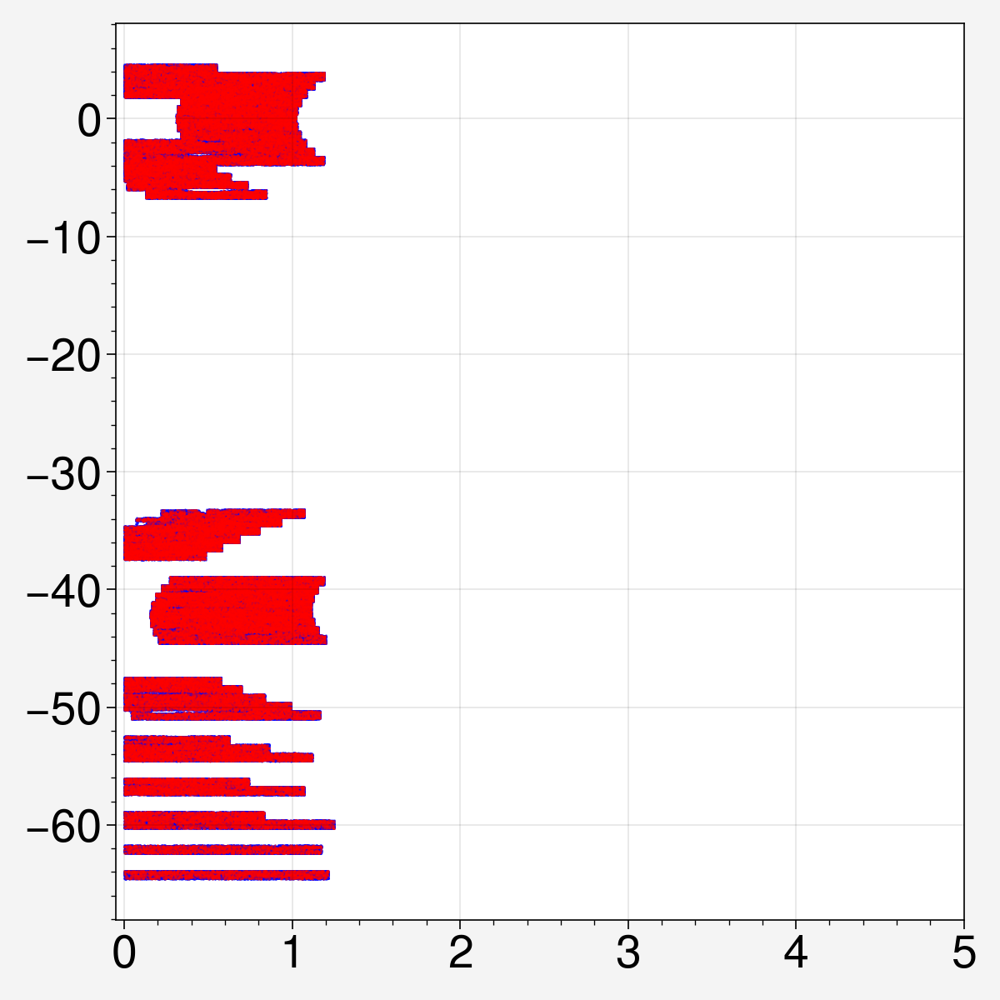

In [9]:

fig,ax=pplt.subplots(figsize=(6,6))
ax.scatter(res_riz['ra'], res_riz['dec'], c='b', s=0.1, alpha=0.5)
ax.scatter(res_g['ra'], res_g['dec'], c='r', s=0.1, alpha=0.5)
ax.set_xlim(-0.05,5)

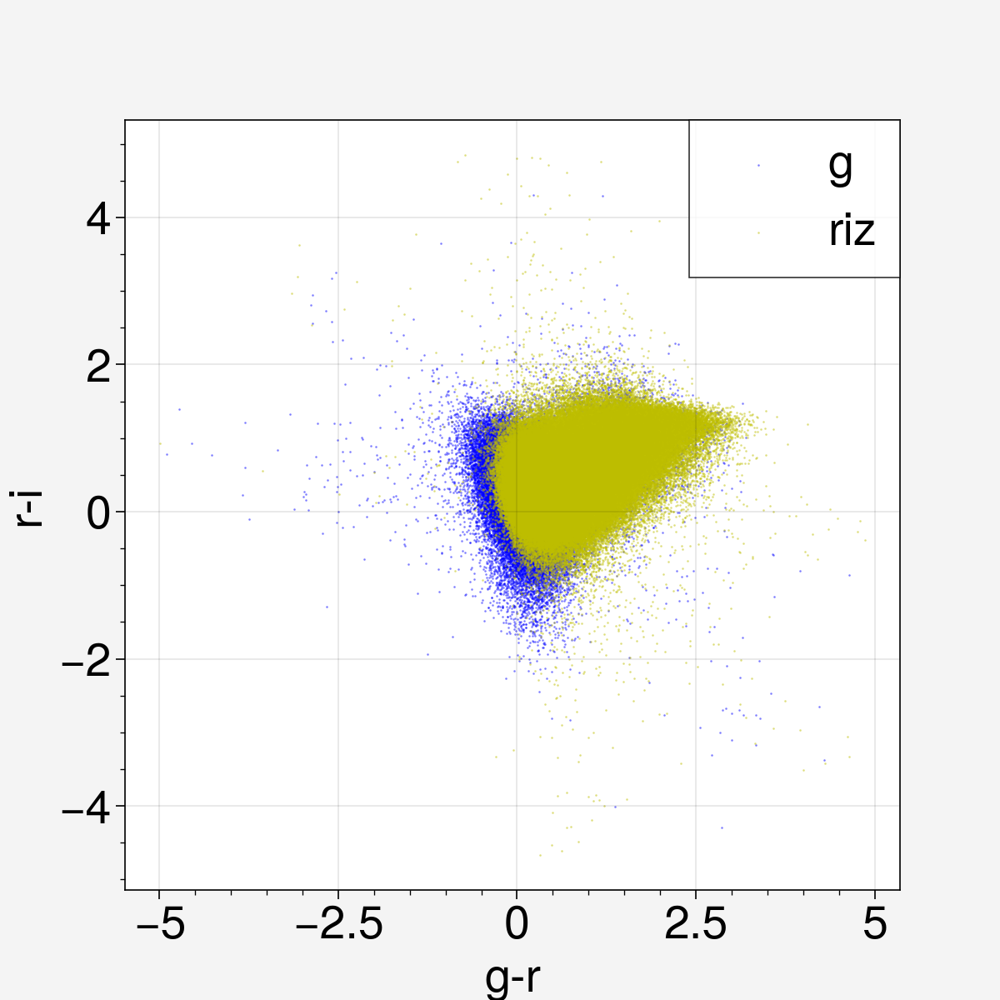

In [10]:

fig,ax2=plt.subplots(figsize=(6,6))
ax2.scatter(res_g['g-r'], res_g['r-i'], s=0.1, c='b', alpha=0.5, label='g')
ax2.scatter(res_riz['g-r'], res_riz['r-i'], s=0.1, c='y', alpha=0.5, label='riz')
ax2.set_xlabel('g-r')
ax2.set_ylabel('r-i')
ax2.legend()

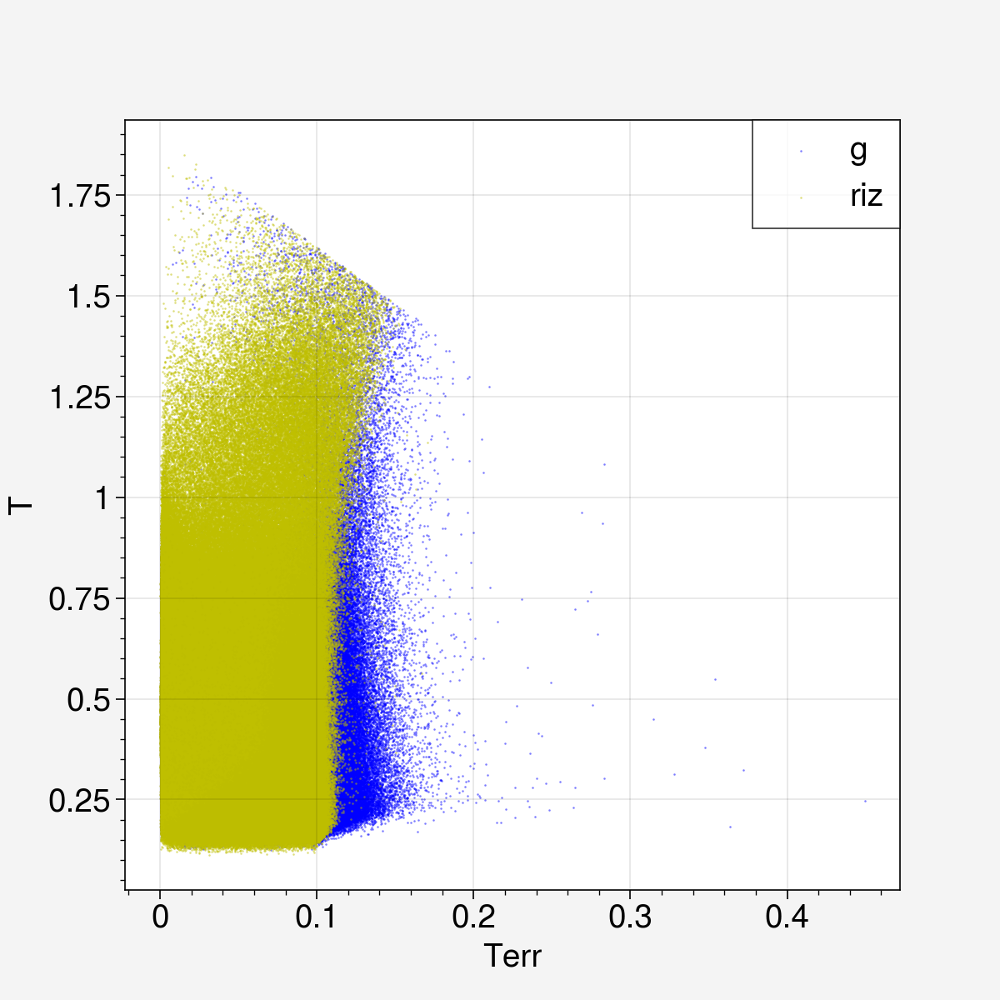

In [19]:
matplotlib.rcParams.update({'font.size': 14})
fig,ax2=plt.subplots(figsize=(6,6))
ax2.scatter(res_g['pgauss_T_err'], res_g['pgauss_T'], s=0.1, c='b', alpha=0.5, label='g')
ax2.scatter(res_riz['pgauss_T_err'], res_riz['pgauss_T'], s=0.1, c='y', alpha=0.5, label='riz')
ax2.set_xlabel('Terr')
ax2.set_ylabel('T')
ax2.legend()
plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/pgauss_g_riz_T-Terr.png', bbox_inches='tight')

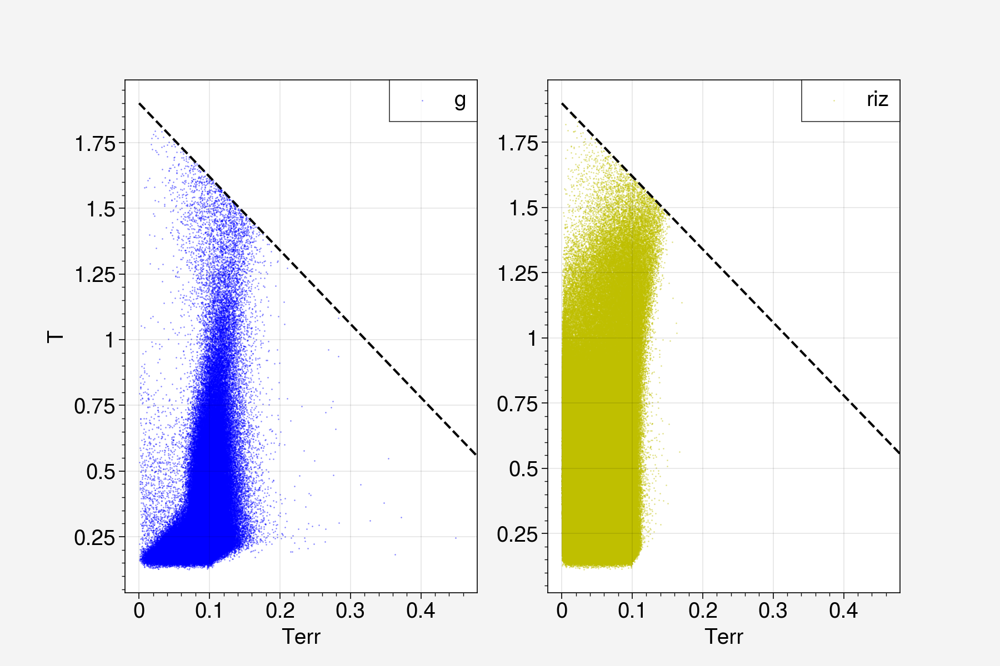

In [32]:
matplotlib.rcParams.update({'font.size': 14})
fig,ax3=plt.subplots(nrows=1, ncols=2, figsize=(9,6))

x=np.linspace(0, 0.48, 50)
ax3[0].scatter(res_g['pgauss_T_err'], res_g['pgauss_T'], s=0.1, c='b', alpha=0.5, label='g')
ax3[0].plot(x, 1.9-2.8*x, ls='--', c='k')
ax3[1].scatter(res_riz['pgauss_T_err'], res_riz['pgauss_T'], s=0.1, c='y', alpha=0.5, label='riz')
ax3[1].plot(x, 1.9-2.8*x, ls='--', c='k')
ax3[0].set_xlabel('Terr')
ax3[1].set_xlabel('Terr')
ax3[0].set_ylabel('T')
ax3[0].set_xlim(-0.02, 0.48)
ax3[1].set_xlim(-0.02, 0.48)
ax3[0].legend()
ax3[1].legend()
plt.savefig('/global/homes/m/myamamot/DES/des-y6-analysis/vf_figures/pgauss_g_riz_T-Terr2.png', bbox_inches='tight')

Text(0, 0.5, 'T')

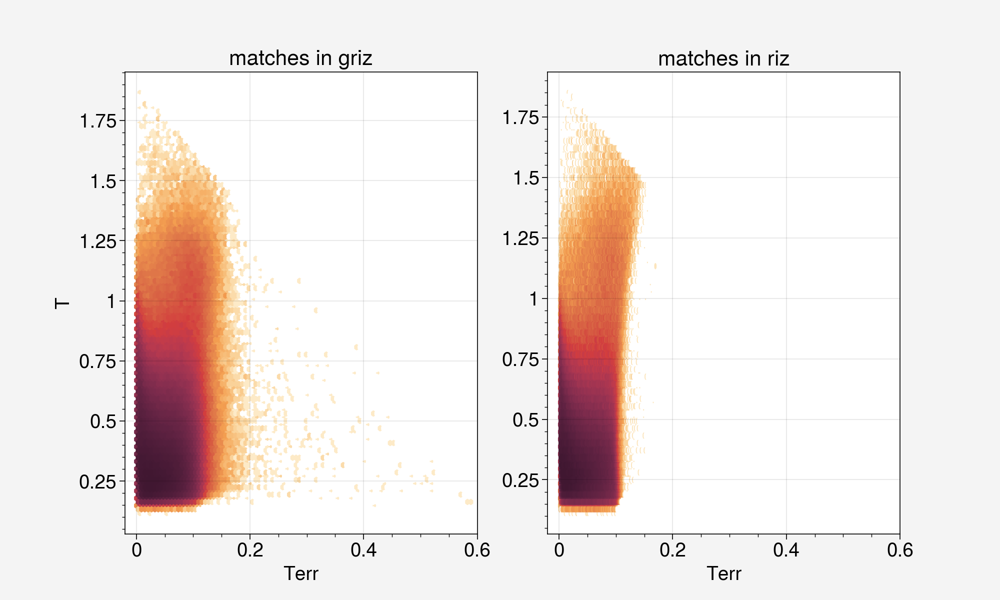

In [37]:
matplotlib.rcParams.update({'font.size': 14})
fig,ax2=plt.subplots(nrows=1, ncols=2, figsize=(10,6))
ax2[0].hexbin(res_griz['pgauss_T_err'], res_griz['pgauss_T'], gridsize=100, bins='log')
ax2[1].hexbin(res_riz['pgauss_T_err'], res_riz['pgauss_T'], gridsize=100, bins='log')
ax2[0].set_xlabel('Terr')
ax2[0].set_title('matches in griz')
ax2[0].set_xlim(-0.02, 0.6)
ax2[1].set_xlim(-0.02, 0.6)
ax2[1].set_xlabel('Terr')
ax2[1].set_title('matches in riz')
ax2[0].set_ylabel('T')

## tilename

In [44]:
resu = np.zeros(1000000, dtype=[('ra', float), ('dec', float), ('tilename', object)])
start = 0
for f_griz in tqdm(mdet_files_griz[:1500]):
    tilename = f_griz.split('/')[-1].split('_')[0]
    d_griz = fio.read(f_griz)
    d_griz = d_griz[d_griz['mdet_step'] == 'noshear']
    
    gsq = d_griz['pgauss_g_1']**2 + d_griz['pgauss_g_2']**2
    msk = gsq > 20
    d_msk = d_griz[msk]
    
    end = start+len(d_msk)
    resu['ra'][start:end] = d_msk['ra']
    resu['dec'][start:end] = d_msk['dec']
    resu['tilename'][start:end] = tilename
    
    start = end

100%|██████████| 1500/1500 [07:11<00:00,  3.48it/s]


In [45]:
resu = resu[resu['ra'] != 0]

In [46]:
resu

array([( 1.19669857, -33.01060471, 'DES0003-3249'),
       ( 1.87153386, -39.56619195, 'DES0006-3914'),
       ( 1.99224221, -44.88855147, 'DES0007-4457'),
       ( 2.34502986, -32.42608815, 'DES0010-3206'),
       ( 3.89887013, -39.29564443, 'DES0013-3914'),
       ( 3.92485784, -39.27952804, 'DES0013-3914'),
       ( 3.81000648, -39.28086664, 'DES0013-3914'),
       ( 3.76068145, -39.27303138, 'DES0013-3914'),
       ( 3.84066412, -39.25298548, 'DES0013-3914'),
       ( 3.81402878, -39.25575308, 'DES0013-3914'),
       ( 3.76114233, -39.2516401 , 'DES0013-3914'),
       ( 3.85284333, -39.24614075, 'DES0013-3914'),
       ( 3.66240382, -39.24919461, 'DES0013-3914'),
       ( 3.94265104, -39.21796299, 'DES0013-3914'),
       ( 3.89648704, -39.21099595, 'DES0013-3914'),
       ( 3.87602248, -39.21018429, 'DES0013-3914'),
       ( 3.86480195, -39.20811905, 'DES0013-3914'),
       ( 3.63525297, -39.21405344, 'DES0013-3914'),
       ( 3.61275019, -39.2100841 , 'DES0013-3914'),
       ( 3.6

In [43]:
fio.write('shear_test.fits', resu)

## number of epochs cuts

In [21]:
np.mean(d_pgauss['nepoch_g'] > 4)

0.89442109965705

In [25]:
d_pgauss = d_pgauss[d_pgauss['nepoch_g'] > 4]

Text(0, 0.5, 'T')

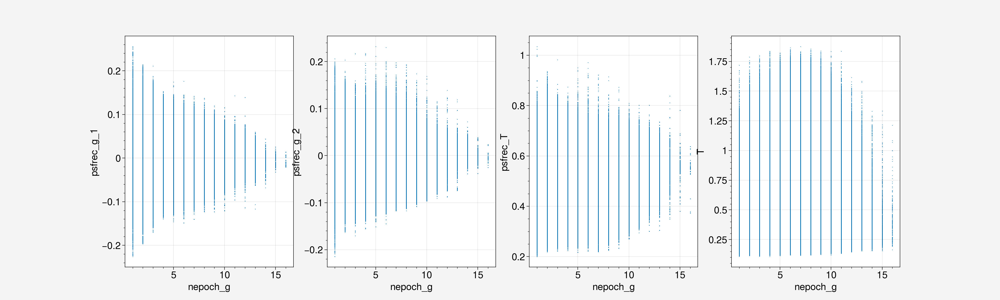

In [24]:
matplotlib.rcParams.update({'font.size': 14})
fig,ax2=plt.subplots(nrows=1, ncols=4, figsize=(20,6))
ax2[0].scatter(d_pgauss['nepoch_g'], d_pgauss['psfrec_g_1'], s=0.1)
ax2[0].set_xlabel('nepoch_g')
ax2[0].set_ylabel('psfrec_g_1')
ax2[1].scatter(d_pgauss['nepoch_g'], d_pgauss['psfrec_g_2'], s=0.1)
ax2[1].set_xlabel('nepoch_g')
ax2[1].set_ylabel('psfrec_g_2')
ax2[2].scatter(d_pgauss['nepoch_g'], d_pgauss['psfrec_T'], s=0.1)
ax2[2].set_xlabel('nepoch_g')
ax2[2].set_ylabel('psfrec_T')
ax2[3].scatter(d_pgauss['nepoch_g'], d_pgauss['pgauss_T'], s=0.1)
ax2[3].set_xlabel('nepoch_g')
ax2[3].set_ylabel('T')

Text(0, 0.5, 'T')

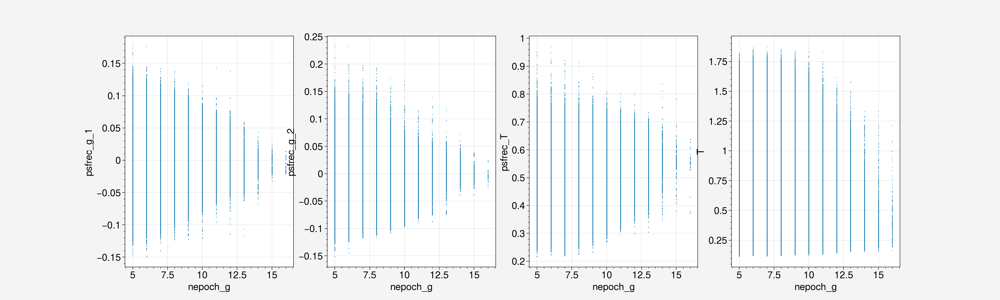

In [26]:
matplotlib.rcParams.update({'font.size': 14})
fig,ax2=plt.subplots(nrows=1, ncols=4, figsize=(20,6))
ax2[0].scatter(d_pgauss['nepoch_g'], d_pgauss['psfrec_g_1'], s=0.1)
ax2[0].set_xlabel('nepoch_g')
ax2[0].set_ylabel('psfrec_g_1')
ax2[1].scatter(d_pgauss['nepoch_g'], d_pgauss['psfrec_g_2'], s=0.1)
ax2[1].set_xlabel('nepoch_g')
ax2[1].set_ylabel('psfrec_g_2')
ax2[2].scatter(d_pgauss['nepoch_g'], d_pgauss['psfrec_T'], s=0.1)
ax2[2].set_xlabel('nepoch_g')
ax2[2].set_ylabel('psfrec_T')
ax2[3].scatter(d_pgauss['nepoch_g'], d_pgauss['pgauss_T'], s=0.1)
ax2[3].set_xlabel('nepoch_g')
ax2[3].set_ylabel('T')

# g-band only catalog

In [22]:
d_pgauss_g = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/mdet_stats_pgauss_gonly.fits')
d_pgauss_riz = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/mdet_stats_pgauss_riz_1267tiles.fits')
d_pgauss_griz = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/mdet_stats_pgauss_griz_1267tiles.fits')

## T-Terr

Text(0.5, 1.0, 'riz')

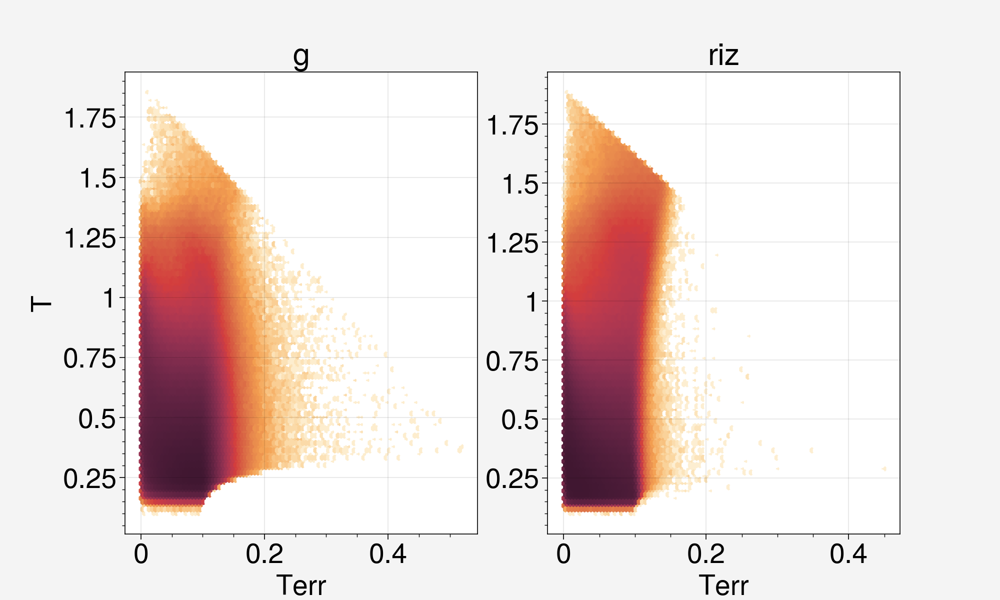

In [6]:
fig,ax2=plt.subplots(nrows=1, ncols=2, figsize=(10,6))
ax2[0].hexbin(d_pgauss_g['pgauss_T_err'], d_pgauss_g['pgauss_T'], gridsize=100, bins='log')
ax2[1].hexbin(d_pgauss_riz['pgauss_T_err'], d_pgauss_riz['pgauss_T'], gridsize=100, bins='log')

ax2[0].set_xlabel('Terr')
ax2[0].set_ylabel('T')
ax2[0].set_title('g')
ax2[1].set_xlabel('Terr')
ax2[1].set_title('riz')

Text(0.5, 1.0, 'riz')

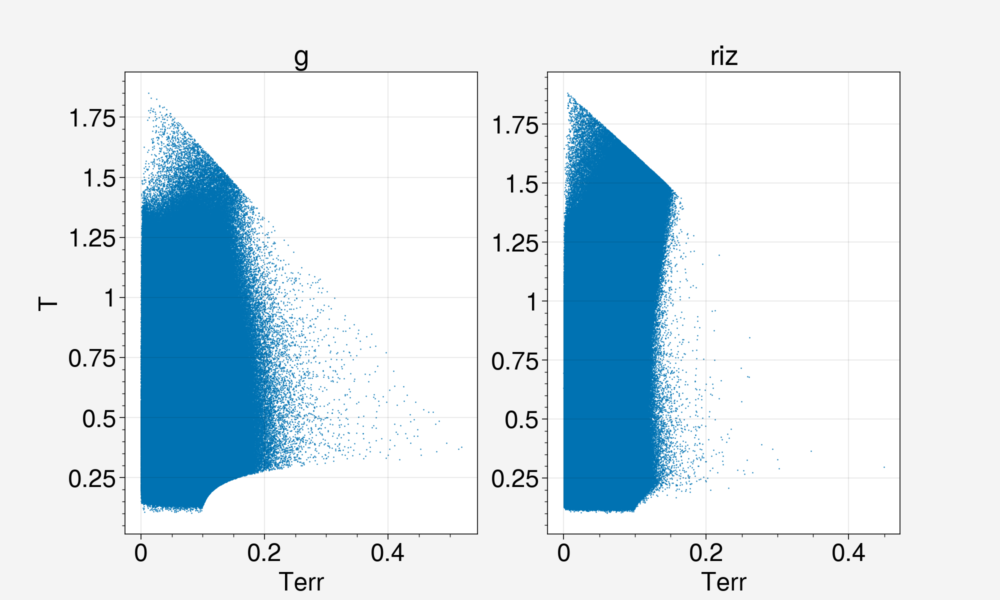

In [8]:
fig,ax2=plt.subplots(nrows=1, ncols=2, figsize=(10,6))
ax2[0].scatter(d_pgauss_g['pgauss_T_err'], d_pgauss_g['pgauss_T'], s=0.1)
ax2[1].scatter(d_pgauss_riz['pgauss_T_err'], d_pgauss_riz['pgauss_T'], s=0.1)

ax2[0].set_xlabel('Terr')
ax2[0].set_ylabel('T')
ax2[0].set_title('g')
ax2[1].set_xlabel('Terr')
ax2[1].set_title('riz')

## large shear

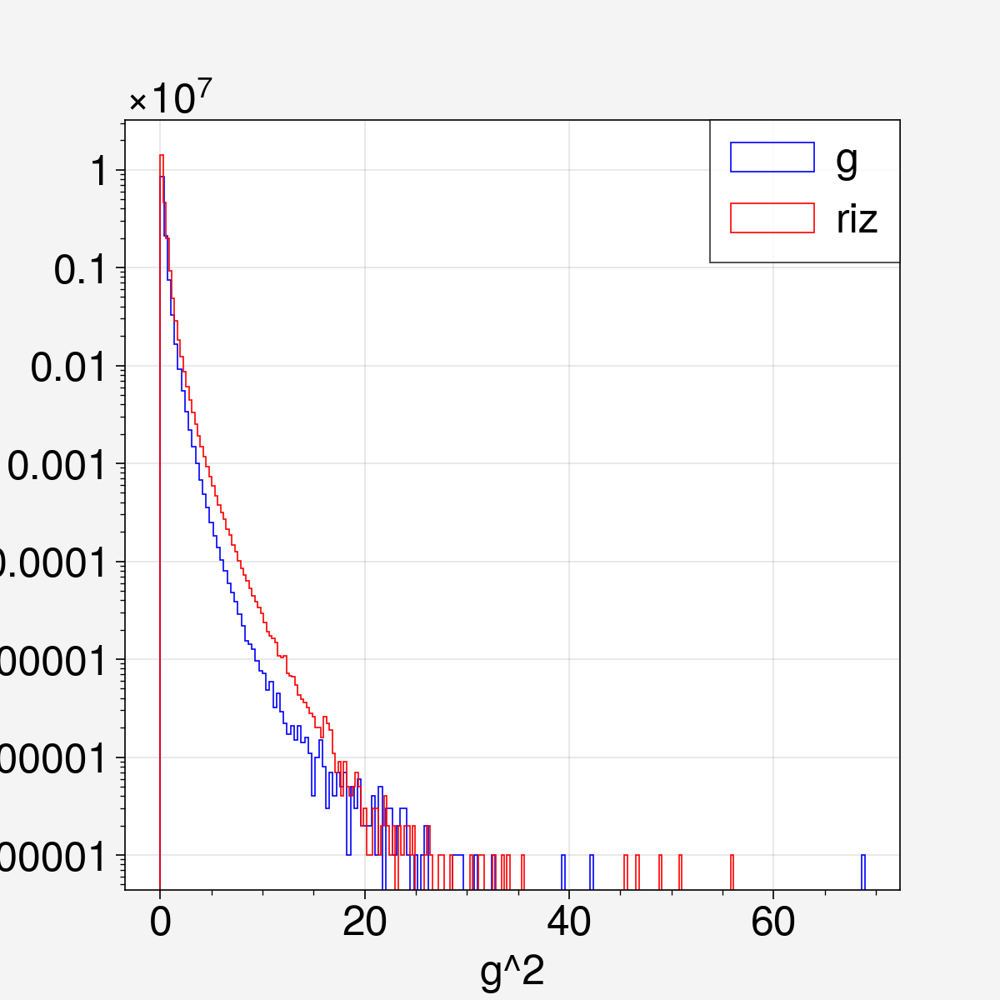

In [7]:
matplotlib.rcParams.update({'font.size': 18})
layout = np.arange(1).reshape(1, 1)
fig,ax = plt.subplot_mosaic(layout, figsize=(6,6))

gsq_pgauss = (d_pgauss_g['pgauss_g_1']**2 + d_pgauss_g['pgauss_g_2']**2)
gsq_pgauss_riz = (d_pgauss_riz['pgauss_g_1']**2 + d_pgauss_riz['pgauss_g_2']**2)
ax[0].hist(gsq_pgauss, bins=200, histtype='step', color='b', label='g')
ax[0].hist(gsq_pgauss_riz, bins=200, histtype='step', color='r', label='riz')
ax[0].set_yscale('log')
ax[0].set_xlabel('g^2')
ax[0].set_ylabel('pgauss')
ax[0].legend()

## epoch dependence

Text(0, 0.5, 'T')

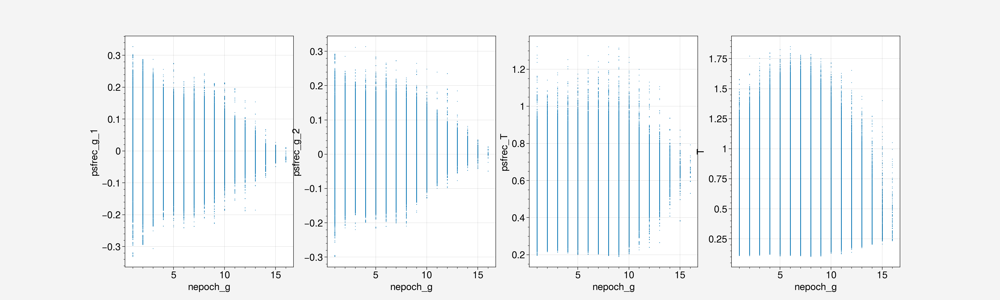

In [9]:
matplotlib.rcParams.update({'font.size': 14})
fig,ax2=plt.subplots(nrows=1, ncols=4, figsize=(20,6))
ax2[0].scatter(d_pgauss_g['nepoch_g'], d_pgauss_g['psfrec_g_1'], s=0.1)
ax2[0].set_xlabel('nepoch_g')
ax2[0].set_ylabel('psfrec_g_1')
ax2[1].scatter(d_pgauss_g['nepoch_g'], d_pgauss_g['psfrec_g_2'], s=0.1)
ax2[1].set_xlabel('nepoch_g')
ax2[1].set_ylabel('psfrec_g_2')
ax2[2].scatter(d_pgauss_g['nepoch_g'], d_pgauss_g['psfrec_T'], s=0.1)
ax2[2].set_xlabel('nepoch_g')
ax2[2].set_ylabel('psfrec_T')
ax2[3].scatter(d_pgauss_g['nepoch_g'], d_pgauss_g['pgauss_T'], s=0.1)
ax2[3].set_xlabel('nepoch_g')
ax2[3].set_ylabel('T')

## size-magnitude 

Text(0.5, 1.0, 'riz')

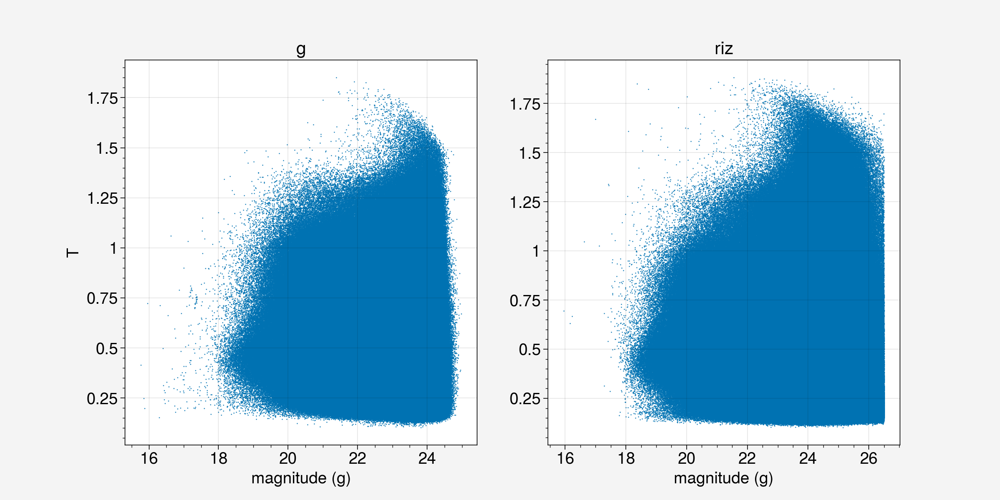

In [12]:
mag_g = 30.0 - 2.5*np.log10(d_pgauss_g["pgauss_band_flux_g"])
mag_g_riz = 30.0 - 2.5*np.log10(d_pgauss_riz["pgauss_band_flux_g"])

fig,ax2=plt.subplots(nrows=1, ncols=2, figsize=(12,6))
ax2[0].scatter(mag_g, d_pgauss_g['pgauss_T'], s=0.1)
ax2[1].scatter(mag_g_riz, d_pgauss_riz['pgauss_T'], s=0.1)

ax2[0].set_xlabel('g [mag]')
ax2[0].set_ylabel('T')
ax2[0].set_title('g')
ax2[1].set_xlabel('g [mag]')
ax2[1].set_title('riz')

Text(0.5, 1.0, 'riz')

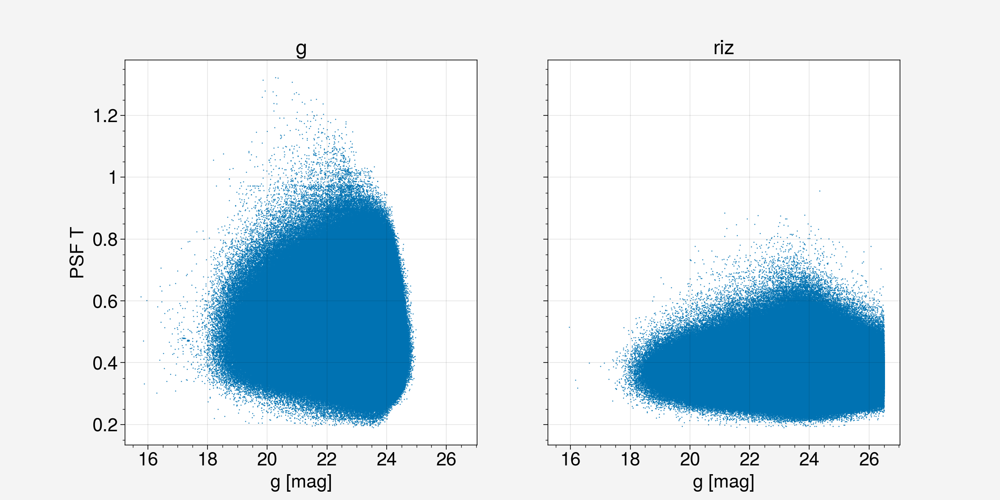

In [20]:
mag_g = 30.0 - 2.5*np.log10(d_pgauss_g["pgauss_band_flux_g"])
mag_g_riz = 30.0 - 2.5*np.log10(d_pgauss_riz["pgauss_band_flux_g"])

fig,ax2=plt.subplots(nrows=1, ncols=2, figsize=(12,6), sharey=True, sharex=True)
ax2[0].scatter(mag_g, d_pgauss_g['psfrec_T'], s=0.1)
ax2[1].scatter(mag_g_riz, d_pgauss_riz['psfrec_T'], s=0.1)

ax2[0].set_xlabel('g [mag]')
ax2[0].set_ylabel('PSF T')
ax2[0].set_title('g')
ax2[1].set_xlabel('g [mag]')
ax2[1].set_title('riz')

Text(0.5, 1.0, 'riz')

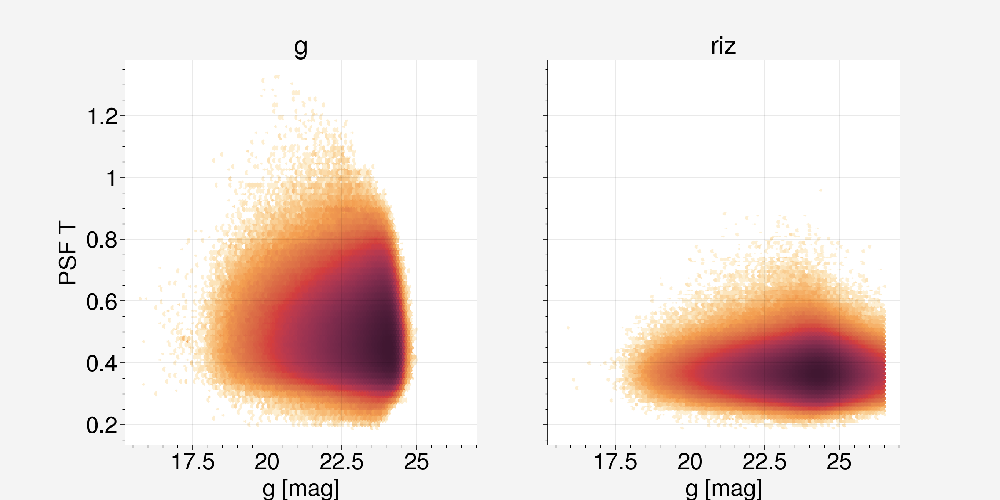

In [44]:
fig,ax2=plt.subplots(nrows=1, ncols=2, figsize=(12,6), sharey=True, sharex=True)
ax2[0].hexbin(mag_g, d_pgauss_g['psfrec_T'], bins='log')
ax2[1].hexbin(mag_g_riz, d_pgauss_riz['psfrec_T'], bins='log')

ax2[0].set_xlabel('g [mag]')
ax2[0].set_ylabel('PSF T')
ax2[0].set_title('g')
ax2[1].set_xlabel('g [mag]')
ax2[1].set_title('riz')

Text(0.5, 1.0, 'riz')

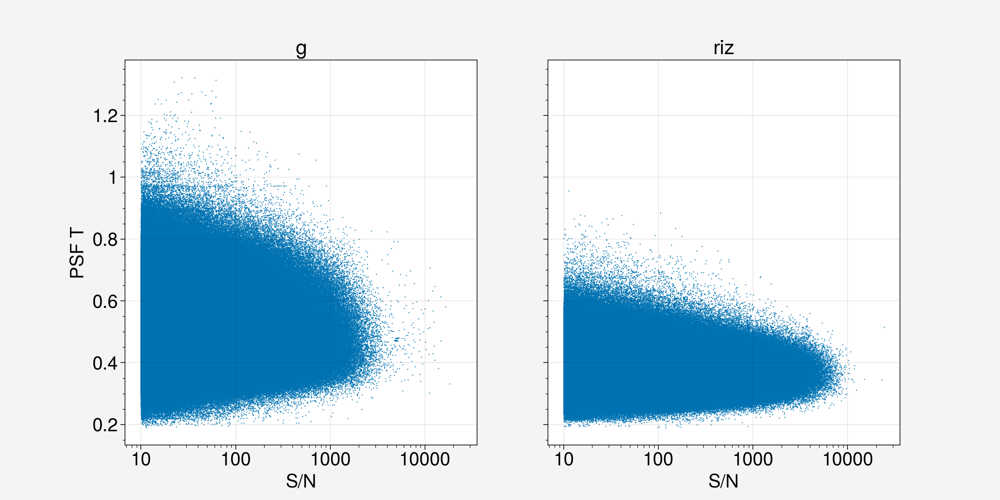

In [26]:

fig,ax2=plt.subplots(nrows=1, ncols=2, figsize=(12,6), sharey=True, sharex=True)
ax2[0].scatter(d_pgauss_g['pgauss_s2n'], d_pgauss_g['psfrec_T'], s=0.1)
ax2[1].scatter(d_pgauss_riz['pgauss_s2n'], d_pgauss_riz['psfrec_T'], s=0.1)
ax2[0].set_xscale('log')
ax2[0].set_xlabel('S/N')
ax2[0].set_ylabel('PSF T')
ax2[0].set_title('g')
ax2[1].set_xlabel('S/N')
ax2[1].set_title('riz')

Text(0.5, 1.0, 'riz')

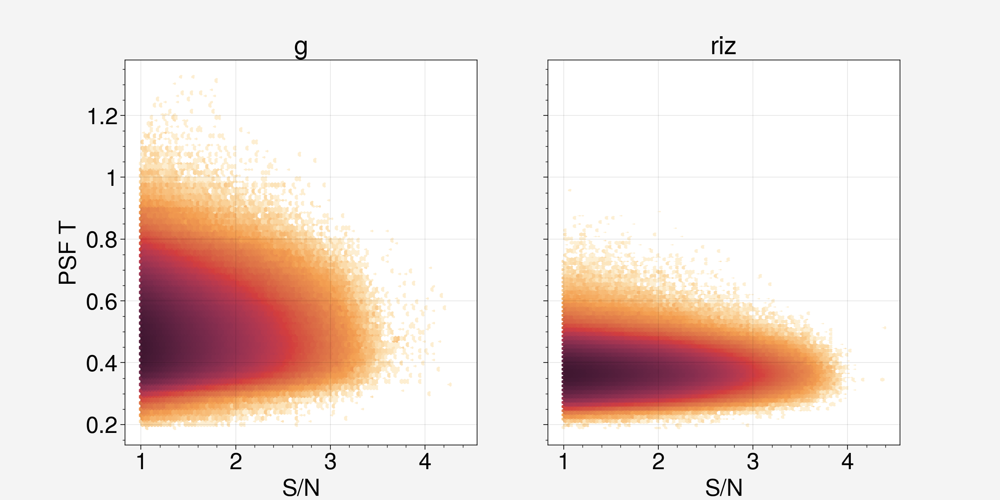

In [45]:
fig,ax2=plt.subplots(nrows=1, ncols=2, figsize=(12,6), sharey=True, sharex=True)
ax2[0].hexbin(np.log10(d_pgauss_g['pgauss_s2n']), d_pgauss_g['psfrec_T'], bins='log')
ax2[1].hexbin(np.log10(d_pgauss_riz['pgauss_s2n']), d_pgauss_riz['psfrec_T'], bins='log')
ax2[0].set_xlabel('S/N')
ax2[0].set_ylabel('PSF T')
ax2[0].set_title('g')
ax2[1].set_xlabel('S/N')
ax2[1].set_title('riz')

Text(0.5, 1.0, 'riz')

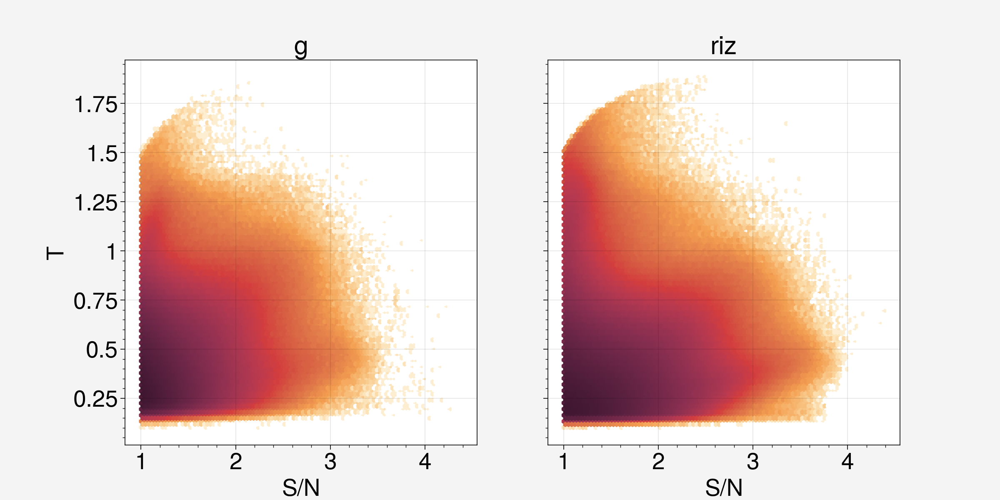

In [43]:
fig,ax2=plt.subplots(nrows=1, ncols=2, figsize=(12,6), sharey=True, sharex=True)
ax2[0].hexbin(np.log10(d_pgauss_g['pgauss_s2n']), d_pgauss_g['pgauss_T'], bins='log')
ax2[1].hexbin(np.log10(d_pgauss_riz['pgauss_s2n']), d_pgauss_riz['pgauss_T'], bins='log')
ax2[0].set_xlabel('S/N')
ax2[0].set_ylabel('T')
ax2[0].set_title('g')
ax2[1].set_xlabel('S/N')
ax2[1].set_title('riz')

## size-shape

Text(0.5, 1.0, 'riz')

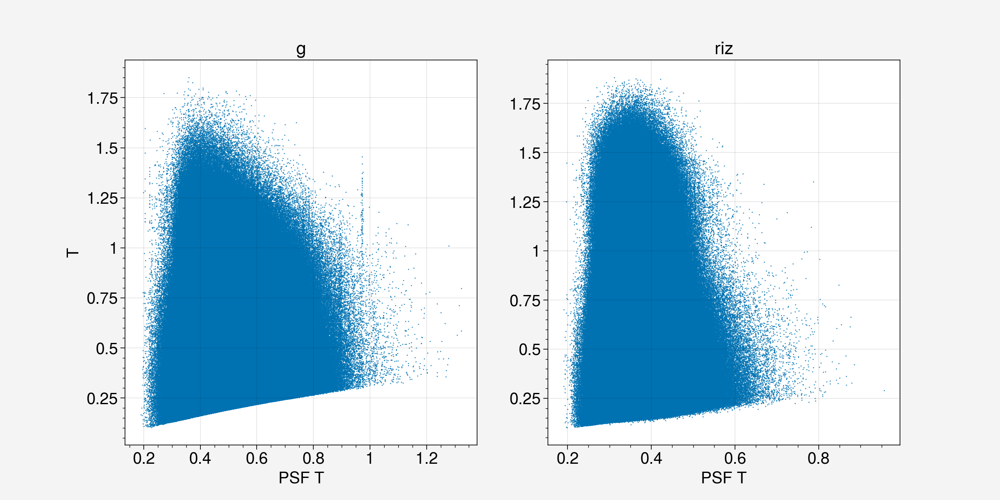

In [13]:
fig,ax2=plt.subplots(nrows=1, ncols=2, figsize=(12,6))
ax2[0].scatter(d_pgauss_g['psfrec_T'], d_pgauss_g['pgauss_T'], s=0.1)
ax2[1].scatter(d_pgauss_riz['psfrec_T'], d_pgauss_riz['pgauss_T'], s=0.1)

ax2[0].set_xlabel('PSF T')
ax2[0].set_ylabel('T')
ax2[0].set_title('g')
ax2[1].set_xlabel('PSF T')
ax2[1].set_title('riz')

Text(0.5, 1.0, 'riz')

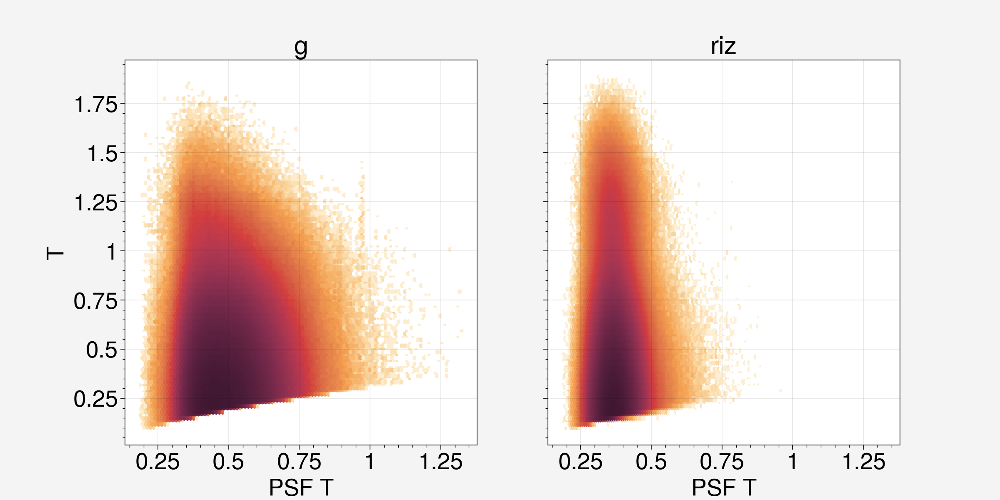

In [48]:
fig,ax2=plt.subplots(nrows=1, ncols=2, figsize=(12,6), sharex=True, sharey=True)
ax2[0].hexbin(d_pgauss_g['psfrec_T'], d_pgauss_g['pgauss_T'], bins='log')
ax2[1].hexbin(d_pgauss_riz['psfrec_T'], d_pgauss_riz['pgauss_T'], bins='log')

ax2[0].set_xlabel('PSF T')
ax2[0].set_ylabel('T')
ax2[0].set_title('g')
ax2[1].set_xlabel('PSF T')
ax2[1].set_title('riz')

Text(0.5, 0, 'PSF T')

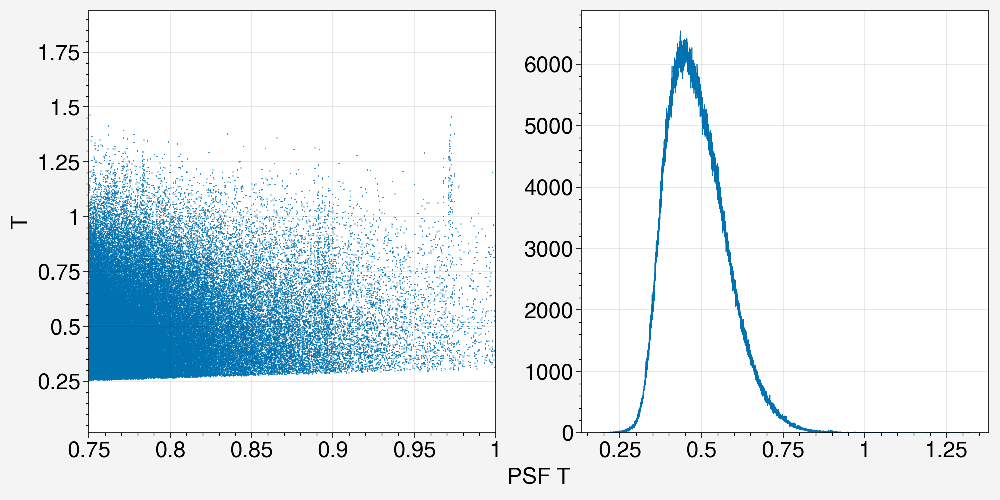

In [36]:
fig,ax2=pplt.subplots(nrows=1, ncols=2, figsize=(10,5), sharex=True, sharey=False)
ax2[0].scatter(d_pgauss_g['psfrec_T'], d_pgauss_g['pgauss_T'], s=0.1)
ax2[1].hist(d_pgauss_g['psfrec_T'], histtype='step', bins=10000)

ax2[0].set_xlabel('PSF T')
ax2[0].set_ylabel('T')
ax2[0].set_xlim(0.75, 1)
ax2[1].set_xlabel('PSF T')

Text(0.5, 0, 'pgauss_T')

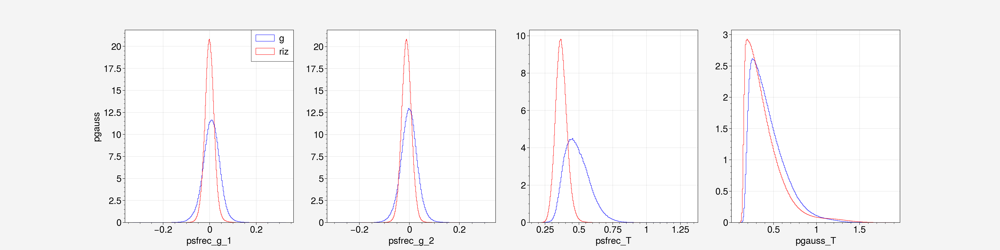

In [28]:
matplotlib.rcParams.update({'font.size': 16})
layout = np.arange(4).reshape(1, 4)
fig,ax = plt.subplot_mosaic(layout, figsize=(24,6))

ax[0].hist(d_pgauss_g['psfrec_g_1'], density=True, bins=200, histtype='step', color='b', label='g')
ax[0].hist(d_pgauss_riz['psfrec_g_1'], density=True, bins=200, histtype='step', color='r', label='riz')
ax[0].set_xlabel('psfrec_g_1')
ax[0].set_ylabel('pgauss')
ax[0].legend()

ax[1].hist(d_pgauss_g['psfrec_g_2'], density=True, bins=200, histtype='step', color='b')
ax[1].hist(d_pgauss_riz['psfrec_g_2'], density=True, bins=200, histtype='step', color='r')
ax[1].set_xlabel('psfrec_g_2')

ax[2].hist(d_pgauss_g['psfrec_T'], density=True, bins=200, histtype='step', color='b')
ax[2].hist(d_pgauss_riz['psfrec_T'], density=True, bins=200, histtype='step', color='r')
ax[2].set_xlabel('psfrec_T')

ax[3].hist(d_pgauss_g['pgauss_T'], density=True, bins=200, histtype='step', color='b')
ax[3].hist(d_pgauss_riz['pgauss_T'], density=True, bins=200, histtype='step', color='r')
ax[3].set_xlabel('pgauss_T')

In [22]:
len(d_pgauss_g), len(d_pgauss_riz)

(12148778, 23044031)

# Match with gold stars

In [4]:
d_gold = fio.read('/global/cscratch1/sd/myamamot/gold/gold_stars_all.fits')

In [10]:
d_g_match = np.load('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/g_gold_match.npy')
d_riz_match = np.load('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/riz_gold_match.npy')

Text(0.5, 1.0, 'g matched with gold')

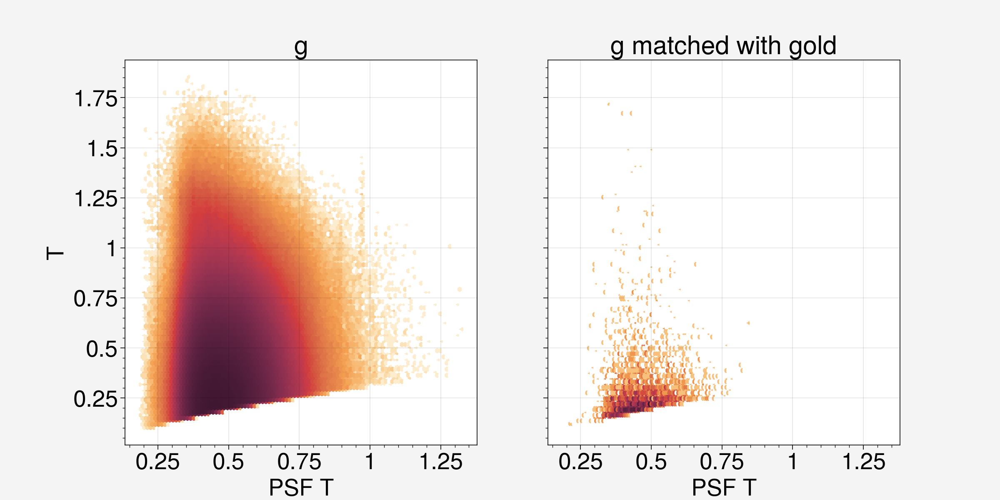

In [8]:
fig,ax2=plt.subplots(nrows=1, ncols=2, figsize=(12,6), sharex=True, sharey=True)
ax2[0].hexbin(d_pgauss_g['psfrec_T'], d_pgauss_g['pgauss_T'], bins='log')
ax2[1].hexbin(d_g_match['psfrec_T'], d_g_match['pgauss_T'], bins='log')

ax2[0].set_xlabel('PSF T')
ax2[0].set_ylabel('T')
ax2[0].set_title('g')
ax2[1].set_xlabel('PSF T')
ax2[1].set_title('g matched with gold')

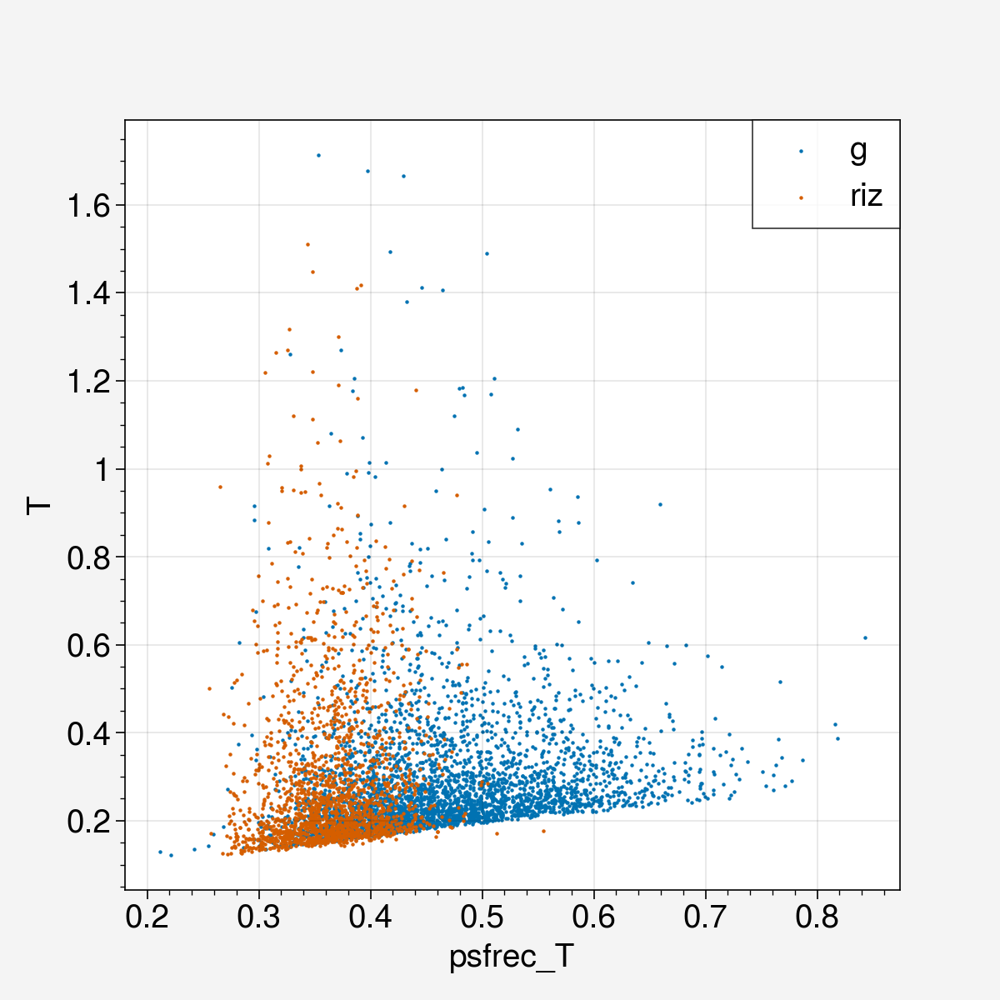

In [18]:
matplotlib.rcParams.update({'font.size': 14})
fig,ax2=plt.subplots(nrows=1, ncols=1, figsize=(6,6), sharex=True, sharey=True)
ax2.scatter(d_g_match['psfrec_T'], d_g_match['pgauss_T'], s=1.0, label='g')
ax2.scatter(d_riz_match['psfrec_T'], d_riz_match['pgauss_T'], s=1.0, label='riz')
ax2.set_xlabel('psfrec_T')
ax2.set_ylabel('T')
ax2.legend()

In [19]:
d_g_nomatch = np.load('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/g_gold_nomatch.npy')
d_riz_nomatch = np.load('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/riz_gold_nomatch.npy')

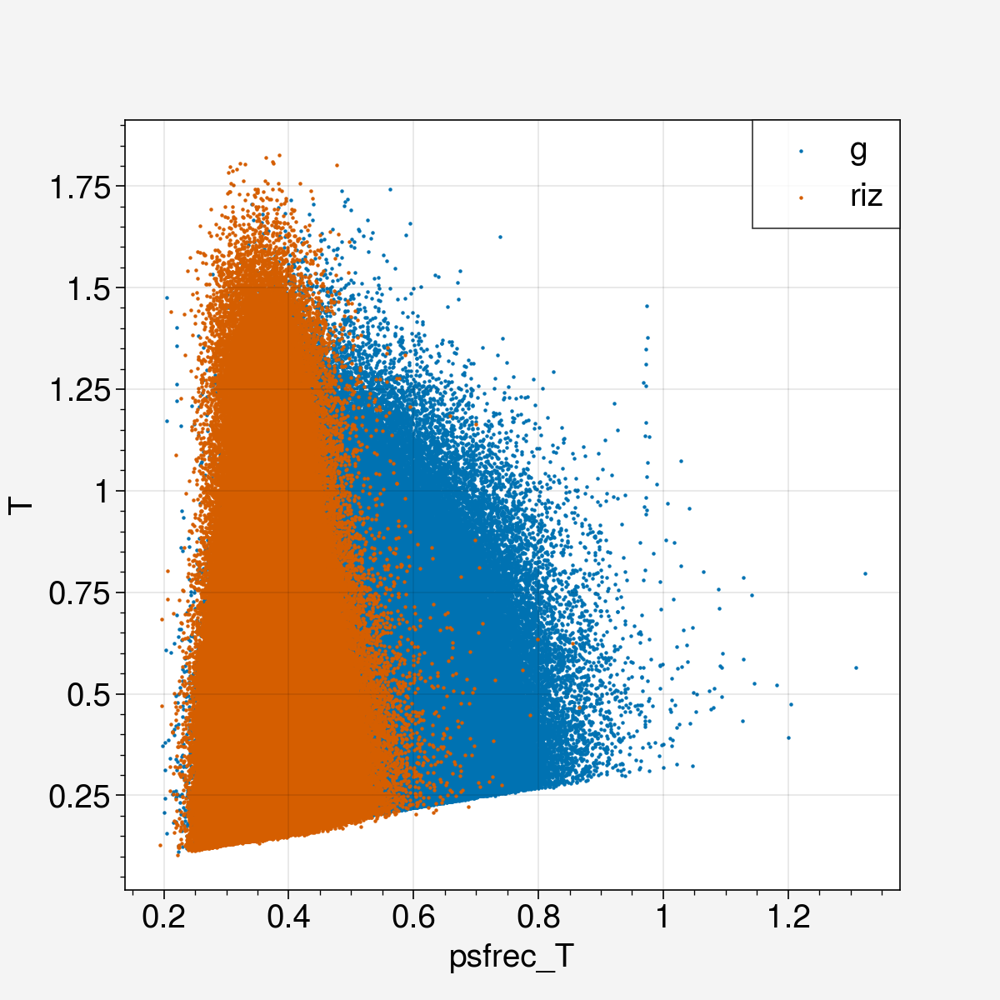

In [20]:
matplotlib.rcParams.update({'font.size': 14})
fig,ax2=plt.subplots(nrows=1, ncols=1, figsize=(6,6), sharex=True, sharey=True)
ax2.scatter(d_g_nomatch['psfrec_T'], d_g_nomatch['pgauss_T'], s=1.0, label='g')
ax2.scatter(d_riz_nomatch['psfrec_T'], d_riz_nomatch['pgauss_T'], s=1.0, label='riz')
ax2.set_xlabel('psfrec_T')
ax2.set_ylabel('T')
ax2.legend()

In [22]:
len(d_pgauss_griz), len(d_pgauss_riz), len(d_pgauss_g)

(23816880, 23044031, 12148778)

In [23]:
np.mean(d_pgauss_griz['pgauss_T_ratio'] > 1.4)

0.2884343793141671

## Match over tiles

In [3]:
res_g = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/res_g.fits')
res_g = res_g[res_g['ra'] != 0]

res_g_star = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/res_g_star.fits')
res_g_star = res_g_star[res_g_star['ra'] != 0]

res_riz = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/res_riz.fits')
res_riz = res_riz[res_riz['ra'] != 0]

res_riz_star = fio.read('/global/cscratch1/sd/myamamot/des-y6-analysis/y6_measurement/res_riz_star.fits')
res_riz_star = res_riz_star[res_riz_star['ra'] != 0]

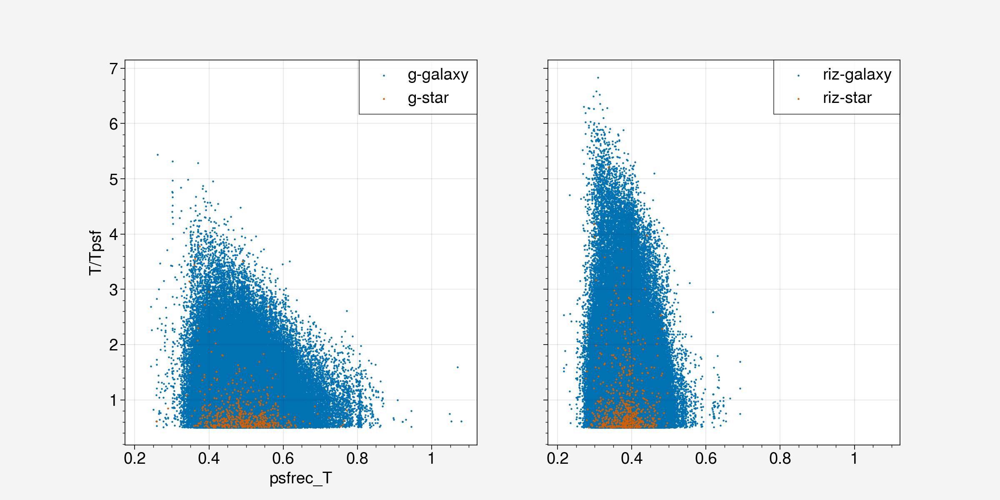

In [8]:
matplotlib.rcParams.update({'font.size': 14})
fig,ax2=plt.subplots(nrows=1, ncols=2, figsize=(12,6), sharex=True, sharey=True)
ax2[0].scatter(res_g['psfrec_T'], res_g['pgauss_T_ratio'], s=1.0, label='g-galaxy')
ax2[0].scatter(res_g_star['psfrec_T'], res_g_star['pgauss_T_ratio'], s=1.0, label='g-star')
ax2[1].scatter(res_riz['psfrec_T'], res_riz['pgauss_T_ratio'], s=1.0, label='riz-galaxy')
ax2[1].scatter(res_riz_star['psfrec_T'], res_riz_star['pgauss_T_ratio'], s=1.0, label='riz-star')

ax2[0].set_xlabel('psfrec_T')
ax2[0].set_ylabel('T/Tpsf')
ax2[0].legend()
ax2[1].legend()

In [11]:
num_g_total = len(res_g_star)*100/0.3521985031099629
num_riz_total = len(res_riz_star)*100/0.2093222999319575

In [12]:
star_g_err = np.sqrt(len(res_g_star))/num_g_total
star_riz_err = np.sqrt(len(res_riz_star))/num_riz_total

In [14]:
star_g_err*100, star_riz_err*100

(0.015198487231941074, 0.008440689800425021)